In [1]:
#####################################################################################################################
#                                                                                                                   #
# Libraries                                                                                                         #
#                                                                                                                   #
#####################################################################################################################
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import LSTM, Dense, Dropout, Bidirectional
import seaborn as sns
from matplotlib import pyplot as plt
from statsmodels.tsa.stattools import adfuller
from sklearn.metrics import mean_absolute_error, mean_squared_error

plt.rcParams['figure.dpi'] = 200 # Plot resolution (dpi)
import pandas as pd
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import ConvLSTM2D, Flatten, Dense
from tensorflow.keras.optimizers import Adam
import numpy as np
import os
import random
import matplotlib.dates as mdates
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from pmdarima import auto_arima
from statsmodels.tsa.vector_ar.var_model import VAR # Import VAR class
from tensorflow.keras import layers, Model, Input
import tensorflow as tf

import shap

# Surpressing Warnings
import warnings
import tensorflow as tf

from statsmodels.tools.sm_exceptions import ValueWarning, ConvergenceWarning
# Suppress Keras UserWarning about input shape in RNN layers
warnings.filterwarnings("ignore", category=UserWarning, module='keras')

# Suppress statsmodels ValueWarning about no frequency information
warnings.filterwarnings("ignore", category=ValueWarning, module='statsmodels')

# Suppress statsmodels ConvergenceWarning about optimization failure
warnings.filterwarnings("ignore", category=ConvergenceWarning, module='statsmodels')

# To suppress all TensorFlow warnings
# warnings.filterwarnings('ignore', category=tf.errors.UserWarning)
warnings.filterwarnings('ignore', message="6 out of the last .* calls to .* triggered tf.function retracing.*", category=UserWarning)



# Loading Transformed Data

In [3]:

file_path = '/Users/bodamjerry/Downloads/GermanyMacroData/'
os.chdir(file_path)
print(f"Current working directory: {os.getcwd()}")

t_Data_Dir = 'TData/'
r_State_Dir = "RState/"
all_LagsHICP_Dir = "AllLagsHICP/"
all_LagsCPI_Dir = "AllLagsCPI/"
# all_LagsNonNormCPI_Dir = "AllLagsNNCPI/"
# all_LagsNonNormHICP_Dir = "AllLagsNNHICP/"

# data_unscaled = pd.read_csv(filepath_or_buffer = r_State_Dir + 'data_unscaled.csv')
# data_scaled = pd.read_csv(filepath_or_buffer = r_State_Dir + 'data_scaled.csv')
data = pd.read_csv(filepath_or_buffer = t_Data_Dir + 'data_scaled.csv')
# data = pd.read_csv(filepath_or_buffer = all_LagsNonNormCPI_Dir + 'data_origin.csv')

# Consider Creating CSV for Data Description
df_date = pd.to_datetime(data['DATE'])
data.set_index('DATE', inplace=True)
print(data.shape)
print(data.columns)

# data_scaled.set_index('DATE', inplace=True)
# data_unscaled.set_index('DATE', inplace=True)

# print(data_scaled.shape)
# print(data_unscaled.shape)

# print(data_scaled.columns)
# print(data_unscaled.columns)



Current working directory: /Users/bodamjerry/Downloads/GermanyMacroData
(311, 19)
Index(['UNERWG', 'ECBIRRO', 'ECBDFR', 'ECBMLFR', 'MMR', 'CPI', 'RETAILMV',
       'RETAILXMV', 'RETAILGSR', 'RETAILGF', 'GOODFBT', 'AGRPROD', 'PPIIP',
       'WPI', 'EPI', 'IPI', 'HICP', 'LTIR', 'UR'],
      dtype='object')


In [241]:
print(data.info())
# print(data_scaled.info())
# # OR
# print(data_unscaled.info())
# 
# print(data_unscaled.dtypes)

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 198 entries, 1999-04-01 to 2015-09-01
Data columns (total 19 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   UNERWG     198 non-null    float64
 1   ECBIRRO    198 non-null    float64
 2   ECBDFR     198 non-null    float64
 3   ECBMLFR    198 non-null    float64
 4   MMR        198 non-null    float64
 5   CPI        198 non-null    float64
 6   RETAILMV   198 non-null    float64
 7   RETAILXMV  198 non-null    float64
 8   RETAILGSR  198 non-null    float64
 9   RETAILGF   198 non-null    float64
 10  GOODFBT    198 non-null    float64
 11  AGRPROD    198 non-null    float64
 12  PPIIP      198 non-null    float64
 13  WPI        198 non-null    float64
 14  EPI        198 non-null    float64
 15  IPI        198 non-null    float64
 16  LTIR       198 non-null    float64
 17  UR         198 non-null    float64
 18  dfHICP_L1  198 non-null    float64
dtypes: float64(19)
memory usage: 30

# Utility Functions

In [4]:

sns.set_theme(style="whitegrid") # Apply seaborn visual theme

def plot_forecast(forecasted_series, actual_series, title_name='Forecasted vs Actual CPIAUCSL'):

    fig = plt.figure(figsize=(12, 6)) # Store figure object

    actual_series.index = pd.to_datetime(actual_series.index) # Try converting to DateTimeIndex

    plt.plot(actual_series.index, forecasted_series, label='Forecasted', color='#e41a1c', linestyle='dashed', linewidth=2) # Red for forecast
    plt.plot(actual_series.index, actual_series, label='Actual', color='#377eb8', linestyle='solid', linewidth=2) # Blue for actual

    plt.xlabel('Date', fontsize=10)
    plt.ylabel('Value', fontsize=10)
    plt.title(title_name, fontsize=12)

    # Date formatting for x-axis (using logic from your improved plot_series)
    ax = plt.gca()
    locator = mdates.AutoDateLocator()
    ax.xaxis.set_major_locator(locator)
    formatter = mdates.DateFormatter('%Y-%m')
    ax.xaxis.set_major_formatter(formatter)
    plt.xticks(rotation=90, ha='right', fontsize=10) # Rotate x-axis labels, adjust font size
    plt.gcf().autofmt_xdate() # Auto-format dates

    plt.legend(fontsize=10, frameon=True, shadow=False, edgecolor='black')
    plt.grid(True, linestyle='--', alpha=0.7, color='gray')

    # Customize Spines
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_linewidth(0.5)
    ax.spines['left'].set_linewidth(0.5)

    plt.tight_layout() # Adjust layout

    return fig # Return the figure object (do NOT use plt.show() here if you want to control display later)


def plot_observed_vs_fitted_var(var_model_fit, train_df, target_column='CPIAUCSL', title='VAR Model - Observed vs Fitted (Training)'):

    fitted_values = var_model_fit.fittedvalues # Get fitted values from the VAR model
    observed_train = train_df[target_column]   # Observed values from the training data

    # Extract fitted values for the target column
    fitted_cpiauscl = fitted_values[target_column]

    # Ensure index is DateTimeIndex if possible (align with actual_series index if needed)
    try:
        fitted_cpiauscl.index = pd.to_datetime(fitted_cpiauscl.index)
        observed_train.index = pd.to_datetime(observed_train.index) # Align observed index too for plotting
        if not fitted_cpiauscl.index.equals(observed_train.index): # If indexes still not the same, try to align based on actual index
            fitted_cpiauscl.index = observed_train.index # Force index alignment for plotting if possible
    except ValueError:
        print("Warning: Could not convert index to DateTime for Observed vs Fitted plot.")
        pass # Plot without DateTimeIndex if conversion fails

    fig = plt.figure(figsize=(12, 6))

    plt.plot(observed_train.index, observed_train, label="Observed (Train)", linestyle="solid", linewidth=2) # Blue for observed
    plt.plot(fitted_cpiauscl.index, fitted_cpiauscl, label="Fitted (Train)", linestyle="solid", linewidth=2) # Green for fitted

    plt.title(title, fontsize=12)
    plt.xlabel("Date", fontsize=10)
    plt.ylabel("Value", fontsize=10)
    plt.legend(fontsize=10, frameon=True, shadow=False, edgecolor='black')
    plt.grid(True, linestyle='--', alpha=0.7, color='gray')

    # Date formatting for x-axis
    ax = plt.gca()
    locator = mdates.AutoDateLocator() # Use observed_train index for locator
    ax.xaxis.set_major_locator(locator)
    formatter = mdates.DateFormatter('%Y-%m')
    ax.xaxis.set_major_formatter(formatter)
    plt.xticks(rotation=45, ha='right', fontsize=10)
    plt.gcf().autofmt_xdate()

    # Customize Spines
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_linewidth(0.5)
    ax.spines['left'].set_linewidth(0.5)

    plt.tight_layout()
    plt.show()
    return fig


# Creating Train and Test Data

In [181]:
# horizon_name = f"dfCPI_L1"
# 
# filename = f"{horizon_name}_rolling_data_norm_1.csv"
# file_path = os.path.join(all_LagsCPI_Dir, filename)
# data = pd.read_csv(file_path, index_col=0, parse_dates=True)
horizon_name = f"dfHICP_L1"

filename = f"{horizon_name}_rolling_data_norm_1.csv"
file_path = os.path.join(all_LagsHICP_Dir, filename)
data = pd.read_csv(file_path, index_col=0, parse_dates=True)

In [182]:
# data = data.drop(columns="CPI")
# print(data.columns)
# target = "dfCPI_L1"

data = data.drop(columns="HICP")
print(data.columns)
target = horizon_name


Index(['UNERWG', 'ECBIRRO', 'ECBDFR', 'ECBMLFR', 'MMR', 'CPI', 'RETAILMV',
       'RETAILXMV', 'RETAILGSR', 'RETAILGF', 'GOODFBT', 'AGRPROD', 'PPIIP',
       'WPI', 'EPI', 'IPI', 'LTIR', 'UR', 'dfHICP_L1'],
      dtype='object')


In [183]:
# df_data = df[['UNERWG', 'ECBIRRO', 'ECBDFR', 'ECBMLFR', 'MMR', 'CPI', 'RETAILMV',
#                              'RETAILXMV', 'RETAILGSR', 'RETAILGF', 'GOODFBT', 'AGRPROD', 'PPIIP',
#                              'WPI', 'EPI', 'IPI', 'HICP', 'LTIR', 'UR']]

df_data = data
test_size = int(len(df_data) * 0.2)  # Convert percentage to absolute count

train_df = df_data.iloc[:-test_size]
test_df = df_data.iloc[-test_size:]

print(train_df.shape)
print(test_df.shape)


(159, 19)
(39, 19)


In [184]:
print(train_df[target].tail())
print(test_df[target].head())


DATE
2012-02-01    0.539137
2012-03-01    0.539137
2012-04-01   -0.899165
2012-05-01   -0.323844
2012-06-01   -0.323844
Name: dfHICP_L1, dtype: float64
DATE
2012-07-01   -0.611505
2012-08-01   -0.036184
2012-09-01    1.114458
2012-10-01   -0.323844
2012-11-01   -0.323844
Name: dfHICP_L1, dtype: float64


# VAR Model Training & Testing
Given that we need more observations than parameters. A rough formula:

Required observations > lag_order × num_variables²

We need to reduce the maxlags or number of variables.


In [185]:

model = VAR(train_df)

# AIC based lag order (your original code)
lag_order_aic = model.select_order(maxlags=5).aic
print(f"AIC-based Lag Order: {lag_order_aic}")

# BIC based lag order
lag_order_bic = model.select_order(maxlags=5).bic
print(f"BIC-based Lag Order: {lag_order_bic}")

# HQIC based lag order
lag_order_hqic = model.select_order(maxlags=5).hqic
print(f"HQIC-based Lag Order: {lag_order_hqic}")

# Choose the lag order based on the criteria you prefer or by comparing performance with different lag orders.
lag_order = lag_order_aic # or lag_order_bic, or lag_order_hqic
var_model = model.fit(lag_order)
print(lag_order)

# var_model.summary()


AIC-based Lag Order: 5
BIC-based Lag Order: 0
HQIC-based Lag Order: 1
5


In [186]:

def var_forecast(train_df, test_df, lag_order):
    """
    Fits a VAR model and performs rolling forecasts with a flexible step size.

    Parameters:
    - data (pd.DataFrame): Time series dataset
    - steps (int): Forecast horizon (e.g., 1 for one-month-ahead, 2 for two-month-ahead)
    - test_ratio (float): Percentage of data to use for testing (default 20%)

    Returns:
    - forecast_df (pd.DataFrame): Forecasted values
    - mae (float): Mean Absolute Error
    - rmse (float): Root Mean Squared Error
    """

    # Fit the VAR model
    model = VAR(train_df)
    var_model = model.fit(lag_order)

    # Perform rolling forecasts
    predictions = []
    history = train_df.values.tolist()

    for i in range(len(test_df)):  # Ensure valid range
        
        input_data = np.array(history[-lag_order:])  # Use latest observed data
        forecast = var_model.forecast(input_data, steps=1)  # Forecast for `steps` ahead
        predictions.append(forecast[0])  # Store last step prediction
        history.append(test_df.iloc[i].values.tolist())  # Update with actual value

    # Convert predictions to DataFrame
    forecast_df = pd.DataFrame(predictions, columns=train_df.columns, index=test_df.index[:len(predictions)])

    # Extract actual and forecasted values for CPI
    actual_cpi = test_df[target]
    forecasted_cpi = forecast_df[target]

    # Compute evaluation metrics
    mae = mean_absolute_error(actual_cpi, forecasted_cpi)
    rmse = np.sqrt(mean_squared_error(actual_cpi, forecasted_cpi))

    print(f"Mean Absolute Error (MAE): {mae}")
    print(f"Root Mean Squared Error (RMSE): {rmse}")

    return var_model, forecasted_cpi, actual_cpi, train_df, mae, rmse



# ***Results***


Mean Absolute Error (MAE): 1.0773201448102465
Root Mean Squared Error (RMSE): 1.4196355474880615


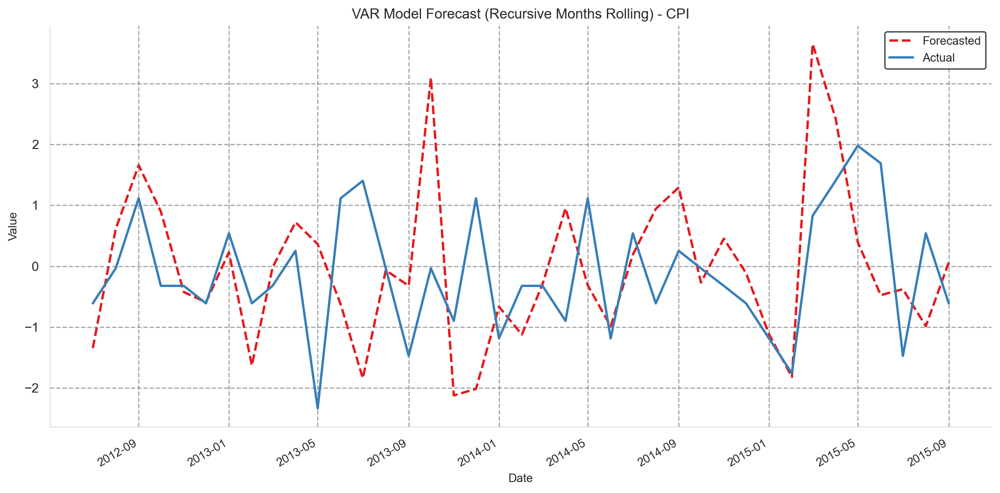

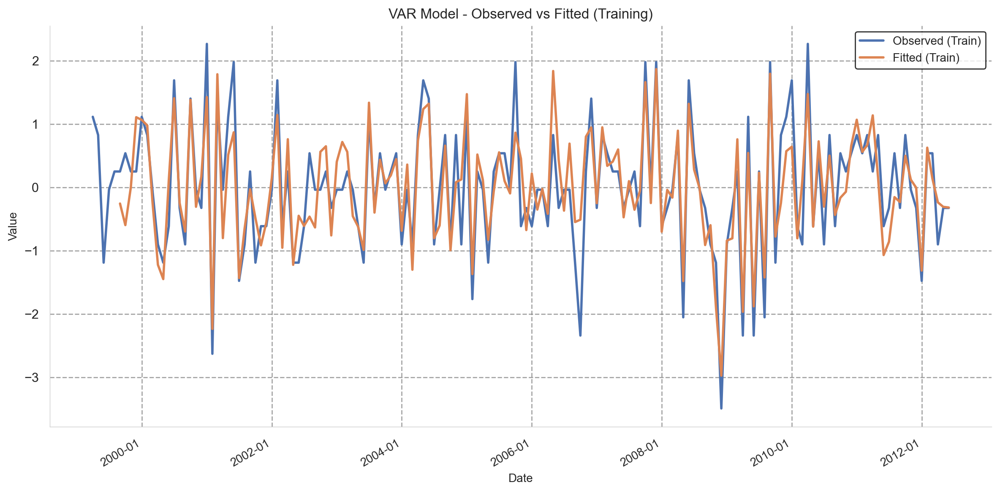

In [187]:
# # Forecast the next 12 months
var_model, forecasted_cpi, actual_cpi, train_df, var_mae, var_rmse = var_forecast(train_df.copy(), test_df.copy(), lag_order)
var_model_forecast_plot = plot_forecast(forecasted_cpi, actual_cpi, title_name='VAR Model Forecast (Recursive Months Rolling) - CPI')
var_observed_vs_fitted_plot = plot_observed_vs_fitted_var(var_model, train_df, target, 'VAR Model - Observed vs Fitted (Training)')


# ***ARIMA Training and Test***

In [188]:

# Extract CPI series for ARIMA
train_cpi_arima = train_df.copy()[target]
test_cpi_arima = test_df.copy()[target]

In [189]:
# For ARIMA order selection (non-seasonal):
auto_arima_model_arima = auto_arima(train_cpi_arima, seasonal=False, stepwise=True,
                                    suppress_warnings=True, error_action="ignore", max_order=10, trace=True)



Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=453.675, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=453.222, Time=0.00 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=450.417, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=451.442, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=449.829, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=451.763, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=451.719, Time=0.02 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=449.964, Time=0.01 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=453.665, Time=0.11 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=451.829, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0]          
Total fit time: 0.257 seconds


In [190]:

def arima_rolling_forecast(train_df, test_df, auto_arima_model, title='ARIMA: Observed vs Fitted (24 Months Rolling)', target_column=target):
    """
    Performs a rolling multi-step-ahead ARIMA forecast for the entire test dataset.

    Parameters:
    - train_df (pd.DataFrame): Training data
    - test_df (pd.DataFrame): Test data
    - target_column (str): The target variable for evaluation (default 'CPIAUCSL')
    - steps (int): Number of steps ahead for each rolling forecast

    Returns:
    - forecast_df (pd.DataFrame): Forecasted values for the entire test period
    - mae (float): Mean Absolute Error
    - rmse (float): Root Mean Squared Error
    """

    # Extract target series
    train_series = train_df[target_column]
    test_series = test_df[target_column]

    # Perform rolling forecasts
    history = train_series.tolist()
    predictions = []

    for i in range(len(test_series)):
        arima_model = ARIMA(history, order=auto_arima_model.order)  # Refit model each step
        arima_model_fit = arima_model.fit()
        forecast = arima_model_fit.forecast(steps=1)  # Forecast 'steps' ahead
        predictions.append(forecast[0])  # Store last predicted step
        history.append(test_series.iloc[i])  # Append actual value

    # Convert predictions to DataFrame
    forecast_df = pd.DataFrame(predictions, index=test_series.index, columns=[target_column])

    # Compute evaluation metrics
    mae = mean_absolute_error(test_series, forecast_df[target_column])
    rmse = np.sqrt(mean_squared_error(test_series, forecast_df[target_column]) )

    print(f"ARIMA Model - Mean Absolute Error (MAE): {mae:.4f}")
    print(f"ARIMA Model - Root Mean Squared Error (RMSE): {rmse:.4f}")

    # Generate and display plots
    print("Train")
    print(train_df.shape)

    plot_forecast(forecast_df[target_column], test_series, title_name=f'ARIMA -Step Ahead Forecast - {target_column}')
    plot_arima_observed_vs_fitted(arima_model_fit, train_df, target_column=target_column, title=title) # Pass target_column

    plt.show()  # Display plots
    return forecast_df, mae, rmse

def plot_arima_observed_vs_fitted(arima_model_fit, train_data, target_column=target, title='ARIMA Model - Observed vs Fitted (Training)'):
    """
    Plots observed vs fitted values for an ARIMA model on the training data,
    handling cases where fittedvalues might not have an index and ensuring index alignment.
    Includes enhanced index debugging.
    """

    observed_train = train_data[target_column] if isinstance(train_data, pd.DataFrame) else train_data # Handle DataFrame or Series input for train_data
    fitted_series = arima_model_fit.fittedvalues    # Ensure only train data is plotted (if fittedvalues has more values)

    num_values_to_keep = observed_train.index.shape[0]
    fitted_series_train = fitted_series[:num_values_to_keep]

    fitted_series_reduced = pd.Series(fitted_series_train, index=observed_train.index)

    # Extract fitted values for the target column
    fig = plt.figure(figsize=(12, 6))

    plt.plot(observed_train.index, observed_train, label="Observed (Train)", linestyle="solid", linewidth=2) # Blue for observed
    plt.plot(fitted_series_reduced.index, fitted_series_train, label="Fitted (Train)", linestyle="solid", linewidth=2) # Green for fitted

    plt.title(title, fontsize=16)
    plt.xlabel("Date", fontsize=12)
    plt.ylabel("Value", fontsize=12)
    plt.legend(fontsize=10, frameon=True, shadow=False, edgecolor='black')
    plt.grid(True, linestyle='--', alpha=0.7, color='gray')

    # Date formatting for x-axis
    ax = plt.gca()
    locator = mdates.AutoDateLocator()
    ax.xaxis.set_major_locator(locator)
    formatter = mdates.DateFormatter('%Y-%m')
    ax.xaxis.set_major_formatter(formatter)
    plt.xticks(rotation=45, ha='right', fontsize=10)
    plt.gcf().autofmt_xdate()

    # Customize Spines
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_linewidth(0.5)
    ax.spines['left'].set_linewidth(0.5)

    plt.tight_layout()
    return fig

In [191]:
# Ensure train_df and test_df are shape (761, 12) and (24, 12) respectively
print(train_df.shape)
print(test_df.shape)


(159, 19)
(39, 19)


# Results

ARIMA Model - Mean Absolute Error (MAE): 0.8088
ARIMA Model - Root Mean Squared Error (RMSE): 1.0186
Train
(159, 19)


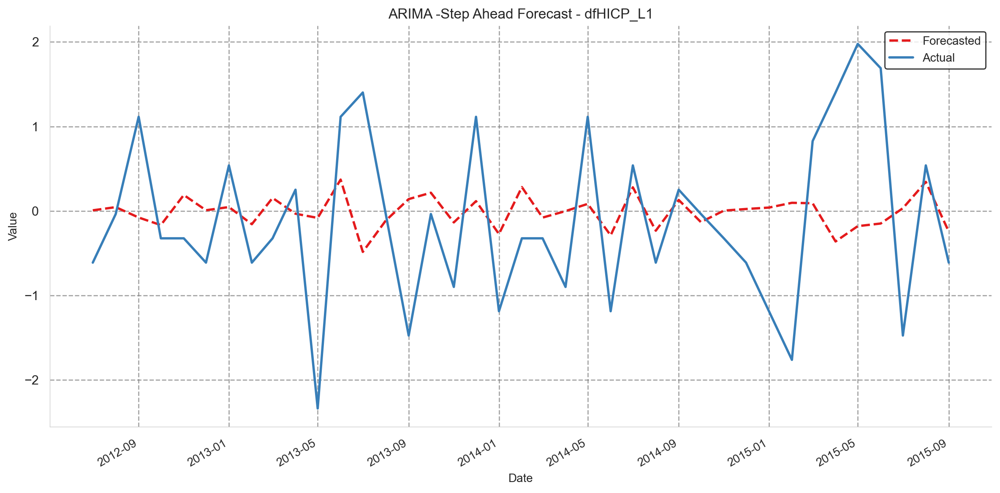

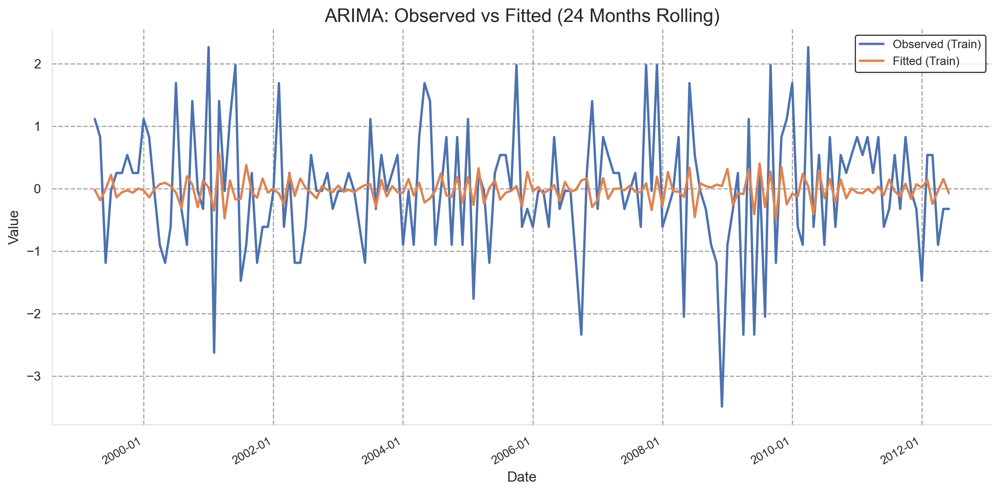

In [192]:
forecast_df, arima_mae, arima_rmse = arima_rolling_forecast(train_df, test_df, auto_arima_model_arima)


# ***SARIMA Training & Test***


In [193]:
train_cpi_sarima = train_df[target]


In [194]:
# For SARIMA order selection (seasonal):
auto_arima_model_sarima = auto_arima(train_cpi_sarima, seasonal=True, m=12, stepwise=True, # m=12 for monthly seasonality
                                     suppress_warnings=True, error_action="ignore", max_order=10, trace=True,
                                     max_p=5, max_q=5, max_P=5, max_Q=5) # Limit search space


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=396.948, Time=4.66 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=455.222, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=426.427, Time=0.38 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=391.805, Time=0.56 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=453.222, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=453.442, Time=0.02 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.66 sec
 ARIMA(0,0,1)(0,0,2)[12] intercept   : AIC=inf, Time=4.87 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=427.455, Time=0.64 sec
 ARIMA(0,0,1)(1,0,2)[12] intercept   : AIC=inf, Time=3.57 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=395.263, Time=0.19 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=391.699, Time=2.20 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=451.964, Time=0.03 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept   : AIC=393.052, Time=0.20 sec
 ARIMA(1,0,1)(0,0,2)[12] intercept   : AIC=in

In [195]:

def rolling_forecast_sarima(train_df, test_df, auto_arima_model_sarima, target_column=target):

    # Extract CPI series for ARIMA
    train_cpiauscl_arima = train_df[target_column]
    test_cpiauscl_arima = test_df[target_column]

    # Ensure the index is datetime for proper date manipulation
    train_cpiauscl_arima.index = pd.to_datetime(train_cpiauscl_arima.index)

    # # Fit SARIMA model to initial training data
    # sarima_model = SARIMAX(train_cpiauscl_arima,
    #                        order=auto_arima_model_sarima.order,
    #                        seasonal_order=auto_arima_model_sarima.seasonal_order)
    # sarima_model_fit = sarima_model.fit(disp=False)  # disp=False to suppress convergence output

    history = train_cpiauscl_arima.tolist()
    predictions = []

    for i in range(len(test_cpiauscl_arima)):
        # Forecast the next step
        # Refit the model with the updated training data
        sarima_model = SARIMAX(history,
                               order=auto_arima_model_sarima.order,
                               seasonal_order=auto_arima_model_sarima.seasonal_order,
                               enforce_stationarity=False,
                               enforce_invertibility=False)

        sarima_model_fit = sarima_model.fit(disp=False)
        forecast = sarima_model_fit.forecast(steps=1)
        predictions.append(forecast[0])
        history.append(test_cpiauscl_arima.iloc[i])  # Append actual value

    forecast_df = pd.DataFrame(predictions, index=test_cpiauscl_arima.index, columns=[target_column])

    mae_sarima = mean_absolute_error(test_cpiauscl_arima, forecast_df[target_column])
    rmse_sarima = np.sqrt(mean_squared_error(test_cpiauscl_arima, forecast_df[target_column]))

    # Print evaluation metrics
    print(f'Rolling SARIMA Model - Mean Absolute Error (MAE): {mae_sarima:.4f}')
    print(f'Rolling SARIMA Model - Root Mean Squared Error (RMSE): {rmse_sarima:.4f}')

    # Plot the forecast and the fitted model
    print("DETAILS")
    print(forecast_df.shape)
    print(test_cpiauscl_arima.shape)
    print(sarima_model_fit.fittedvalues.shape)
    sarima_forecast = plot_forecast(forecast_df, test_cpiauscl_arima, title_name='Rolling SARIMA Model Forecast - CPI')
    sarima_fitted = plot_arima_observed_vs_fitted(sarima_model_fit, train_df, title='SARIMA Model - Observed vs Fitted (24 Months Rolling)')
    plt.show()

    return sarima_forecast, mae_sarima, rmse_sarima



# Result

Rolling SARIMA Model - Mean Absolute Error (MAE): 0.7287
Rolling SARIMA Model - Root Mean Squared Error (RMSE): 0.9352
DETAILS
(39, 1)
(39,)
(197,)


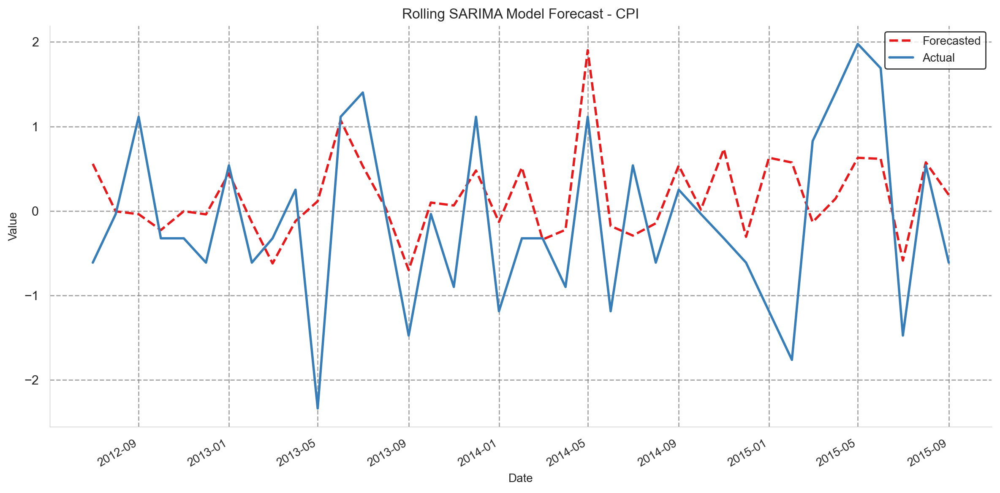

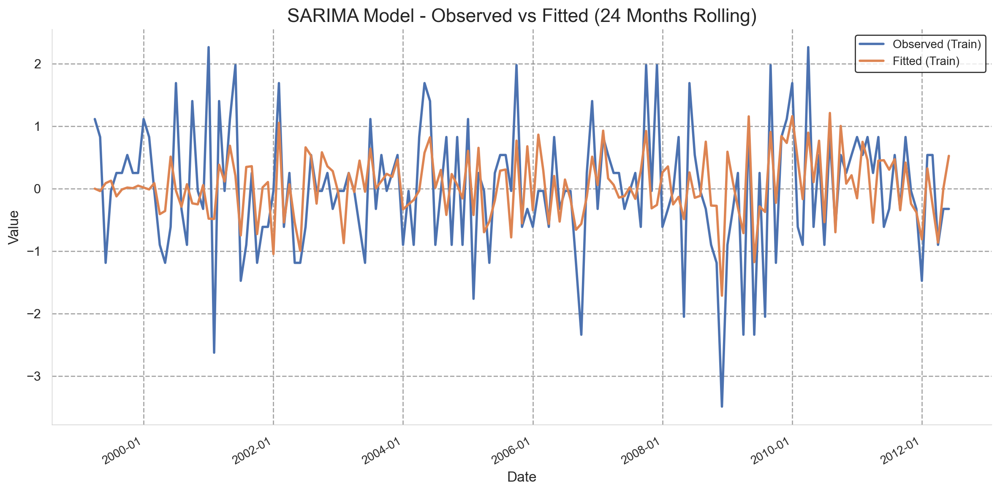

In [196]:

sarima_forecast, sarima_mae, sarima_rmse = rolling_forecast_sarima(train_df, test_df, auto_arima_model_sarima)


# ***CNN-LSTM Training & Testing***

In [197]:
data_l = df_data.copy()

In [220]:

def prepare_data_for_cnn_lstm(data_l, target_col=target, test_size=test_size):
    """
    Prepares and scales data for CNN-LSTM without leakage.
    """
    data_x = data_l.copy()

    # Separate target and features
    y = data_x[[target_col]]
    X = data_x.drop(target_col, axis=1)

    # Split before scaling
    X_train = X.iloc[:-test_size]
    X_test = X.iloc[-test_size:]
    y_train = y.iloc[:-test_size]
    y_test = y.iloc[-test_size:]

    # Initialize scalers
    scaler_X = StandardScaler()
    scaler_y = StandardScaler()

    # Fit scalers on training data only
    X_train_scaled = scaler_X.fit_transform(X_train)
    y_train_scaled = scaler_y.fit_transform(y_train)

    # Transform test data
    X_test_scaled = scaler_X.transform(X_test)
    y_test_scaled = scaler_y.transform(y_test)

    # Reconstruct DataFrames (preserving index and column names)
    X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=X.columns, index=X_train.index)
    y_train_scaled_df = pd.DataFrame(y_train_scaled, columns=y.columns, index=y_train.index)
    X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=X.columns, index=X_test.index)
    y_test_scaled_df = pd.DataFrame(y_test_scaled, columns=y.columns, index=y_test.index)

    # Combine scaled features and target
    train_scaled = pd.concat([X_train_scaled_df, y_train_scaled_df], axis=1)
    test_scaled = pd.concat([X_test_scaled_df, y_test_scaled_df], axis=1)

    return train_scaled, test_scaled, scaler_X, scaler_y


train_data, test_data, scaler_X, scaler_y = prepare_data_for_cnn_lstm(data_l, target, test_size=test_size)
data_ls = pd.concat([train_data, test_data])  # If needed for time-series index continuity

# data_ls = prepare_data_for_cnn_lstm(data_l, 'CPI')

print(data_ls.shape)
print(data.shape)


(198, 19)
(198, 19)


In [199]:

def plot_predictions(y_actual, y_pred, train_index, title='CNN-LSTM: Actual vs Forecasted Values'):
    """Plots actual vs forecasted values."""
    train_index = pd.to_datetime(train_index)
    fig = plt.figure(figsize=(12, 6))
    plt.plot(train_index, y_actual, label='Actual', color='blue', linestyle='solid')
    plt.plot(train_index, y_pred, label='Forecasted', color='red', linestyle='dashed')

    ax = plt.gca()
    locator = mdates.AutoDateLocator()
    ax.xaxis.set_major_locator(locator)
    formatter = mdates.DateFormatter('%Y-%m')
    ax.xaxis.set_major_formatter(formatter)
    plt.xticks(rotation=45, ha='right', fontsize=10)
    plt.gcf().autofmt_xdate()

    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.title(title, fontsize=10)
    plt.legend()
    plt.grid(True)
    plt.show()
    return fig

def plot_loss(history):
    # Plots loss function
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('LSTM - Loss (MSE)')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='upper right')
    plt.show()
    plt.close()

def plot_observed_vs_fitted(y_train, predictions_train, train_index):
    fig = plt.figure(figsize=(12, 6))
    train_index = pd.to_datetime(train_index)
    plt.plot(train_index, y_train, label="Observed (Train)", linestyle="solid")
    plt.plot(train_index, predictions_train, label="Fitted (Train)", linestyle="solid")
    plt.title("CNN-LSTM - Observed vs. Fitted Values")

    ax = plt.gca()
    locator = mdates.AutoDateLocator()
    ax.xaxis.set_major_locator(locator)
    formatter = mdates.DateFormatter('%Y-%m')
    ax.xaxis.set_major_formatter(formatter)
    plt.xticks(rotation=45, ha='right', fontsize=10)
    plt.gcf().autofmt_xdate()

    plt.tight_layout()
    plt.xlabel("Time Steps")
    plt.ylabel("Value")
    plt.legend()
    plt.grid(True)
    plt.show()
    return fig


In [250]:

def prepare_data(data, target_column, test_size, test_size_percent=False):
    """
    Splits the data into training and testing sets and reshapes it for ConvLSTM2D.

    Parameters:
    - data (DataFrame): The input dataset.
    - target_column (str): The column name of the target variable.
    - test_size (int or float): Number of test samples (if int) or percentage of data for testing (if float).
    - test_size_percent (bool): If True, interprets test_size as a percentage (0-1).

    Returns:
    - X_train, y_train, X_test, y_test: Training and testing datasets, reshaped for ConvLSTM2D.
    """
    if test_size_percent:
        test_size = int(len(data) * test_size)  # Convert percentage to absolute count

    train_df = data.iloc[:-test_size]
    test_df = data.iloc[-test_size:]
    train_index = train_df.index
    test_index = test_df.index

    X_train = train_df.drop(target_column, axis=1).values
    y_train = train_df[target_column].values
    X_test = test_df.drop(target_column, axis=1).values
    y_test = test_df[target_column].values

    X_train = X_train.reshape((X_train.shape[0], 1, 1, 1, X_train.shape[1]))
    X_test = X_test.reshape((X_test.shape[0], 1, 1, 1, X_test.shape[1]))

    return X_train, y_train, X_test, y_test, train_index, test_index

# BEST SO FAR 128, 16
def build_model(input_shape):
    """Builds and compiles a ConvLSTM2D model."""
    model = Sequential([
        # Bidirectional(ConvLSTM2D(filters=32, kernel_size=(1, 1), activation='selu', return_sequences=True, input_shape=input_shape)),
        # Bidirectional(ConvLSTM2D(filters=64, kernel_size=(1, 1), activation='selu', return_sequences=True, input_shape=input_shape)),
        Bidirectional(ConvLSTM2D(filters=16, kernel_size=(1, 1), activation='tanh', return_sequences=True, input_shape=input_shape)),
        Bidirectional(ConvLSTM2D(filters=16, kernel_size=(1, 1), activation='tanh', return_sequences=False)),
        Flatten(),
        Dense(1)
    ])
    opt = Adam(learning_rate=0.001)
    model.compile(optimizer=opt, loss='mse')
    return model

def train_model(model, X_train, y_train):
    """Trains the model with early stopping."""
    early_stopping = EarlyStopping(monitor='val_loss', patience=80, restore_best_weights=True)
    history = model.fit(X_train, y_train, epochs=600, batch_size=24, shuffle=False, validation_split=0.2, callbacks=[early_stopping])
    return history

def evaluate_model(model, X_test, y_test):
    """Evaluates the model and returns the test loss and predictions."""
    loss = model.evaluate(X_test, y_test, verbose=0)
    predictions = model.predict(X_test, verbose=0)
    return loss, predictions

def inverse_transform(scaler, data):
    """Inverse transforms the scaled data."""
    return scaler.inverse_transform(data.reshape(-1, 1))

def cnn_lstm_model(data, scaler_y, test_size=test_size):
    """Main function to execute the pipeline."""
    X_train, y_train, X_test, y_test, train_index, test_index = prepare_data(data, target, test_size=test_size, test_size_percent=False)
    model = build_model((X_train.shape[0], 1, 1, X_train.shape[-1]))
    history = train_model(model, X_train, y_train)

    loss, predictions = evaluate_model(model, X_test, y_test)
    print(f'Test Loss: {loss}')
    
    y_test_actual = inverse_transform(scaler_y, y_test)
    predictions_actual = inverse_transform(scaler_y, predictions)

    mae = mean_absolute_error(y_test_actual, predictions_actual)
    rmse = np.sqrt(mean_squared_error(y_test_actual, predictions_actual))
    plot_cnn_forecast = plot_predictions(y_test_actual, predictions_actual, test_index)
    plot_loss(history)

    predictions_train = model.predict(X_train, verbose=0) # Predict on X_train
    predictions_train_actual = inverse_transform(scaler_y, predictions_train) # Inverse transform fitted values
    y_train_actual = inverse_transform(scaler_y, y_train) # Inverse transform y_train

    # --- Plot Observed vs Fitted on Training Data ---
    plot_cnn_obs_vs_fitted = plot_observed_vs_fitted(y_train_actual, predictions_train_actual, train_index) # Pass y_train_actual and predictions_train_actual
    # plot_observed_vs_fitted(y_train, predictions)

    print(f'Mean Absolute Error (MAE): {mae:.8f}')
    print(f'Root Mean Squared Error (RMSE): {rmse:.8f}')
    return model, X_train, X_test, mae, rmse

# Call
# main(data_ls, scaler_y)
# data_x = data_ls.copy().drop(columns="dfCPI_L1")


In [ ]:
model, X_train, X_test, cnn_mae, cnn_rmse = cnn_lstm_model(data_ls, scaler_y, test_size)

# All Results for one sample run

Mean Absolute Error (MAE): 0.8909923942625712
Root Mean Squared Error (RMSE): 1.3347679351327648

In [202]:
print(f'CNN-LSTM (MAE): {cnn_mae}')
print(f'CNN-LSTM (RMSE): {cnn_rmse}')
print(f'VAR (MAE): {var_mae}')
print(f'VAR (RMSE): {var_rmse}')
print(f'ARIMA (MAE): {arima_mae}')
print(f'ARIMA (RMSE): {arima_rmse}')
print(f'SARIMA (MAE): {sarima_mae}')
print(f'SARIMA (RMSE): {sarima_rmse}')



CNN-LSTM (MAE): 0.7860762360660195
CNN-LSTM (RMSE): 0.967949826719288
VAR (MAE): 1.0773201448102465
VAR (RMSE): 1.4196355474880615
ARIMA (MAE): 0.8087509355743467
ARIMA (RMSE): 1.0186124526678701
SARIMA (MAE): 0.7286806068975464
SARIMA (RMSE): 0.9351670864586991


# Recursive

In [251]:
def cnn_lstm_model_recursive(data, target_column, scaler_y, test_size):
    """
    Performs one-step recursive forecasting with CNN-LSTM.
    """
    # --- Split data ---
    train_df = data.iloc[:-test_size]
    test_df = data.iloc[-test_size:]
    train_index = train_df.index
    test_index = test_df.index

    X_train_raw = train_df.drop(target_column, axis=1).values
    y_train_raw = train_df[target_column].values

    # Reshape input for ConvLSTM2D: (samples, time, rows, cols, features)
    X_train = X_train_raw.reshape((X_train_raw.shape[0], 1, 1, 1, X_train_raw.shape[1]))
    y_train = y_train_raw

    model = build_model((1, 1, 1, X_train.shape[-1]))
    history = train_model(model, X_train, y_train)

    # Prepare recursive loop
    history_X = X_train_raw.tolist()
    predictions = []

    for i in range(test_size):
        latest_input = np.array(history_X[-1]).reshape((1, 1, 1, 1, X_train.shape[-1]))  # Shape: (1, 1, 1, 1, features)
        pred = model.predict(latest_input, verbose=0)[0][0]
        predictions.append(pred)

        # Append prediction to input history (simulate real update at time t+1)
        new_row = test_df.iloc[i].copy()
        new_row[target_column] = pred  # Add predicted target (recursive)
        history_X.append(new_row.drop(target_column).values.tolist())

    # Inverse transform
    y_test_actual = inverse_transform(scaler_y, test_df[target_column].values)
    predictions_actual = inverse_transform(scaler_y, np.array(predictions))

    mae = mean_absolute_error(y_test_actual, predictions_actual)
    rmse = np.sqrt(mean_squared_error(y_test_actual, predictions_actual))

    plot_cnn_forecast = plot_predictions(y_test_actual, predictions_actual, test_index)
    plot_loss(history)

    # Training performance
    predictions_train = model.predict(X_train, verbose=0)
    predictions_train_actual = inverse_transform(scaler_y, predictions_train)
    y_train_actual = inverse_transform(scaler_y, y_train)

    plot_cnn_obs_vs_fitted = plot_observed_vs_fitted(y_train_actual, predictions_train_actual, train_index)

    print(f'Mean Absolute Error (MAE): {mae:.8f}')
    print(f'Root Mean Squared Error (RMSE): {rmse:.8f}')
    return model, mae, rmse



Epoch 1/600
6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 1.0055 - val_loss: 0.6734
Epoch 2/600
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.9897 - val_loss: 0.6707
Epoch 3/600
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.9782 - val_loss: 0.6685
Epoch 4/600
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.9670 - val_loss: 0.6666
Epoch 5/600
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.9554 - val_loss: 0.6650
Epoch 6/600
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.9429 - val_loss: 0.6637
Epoch 7/600
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.9291 - val_loss: 0.6630
Epoch 8/600
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.9140 - val_loss: 0.6631
Epoch 9/600
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.8977 - val_loss: 0.6643
Epoch 10/600
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.8804 - val_loss: 0.6671
Epoch 11/600
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.8625 - val_loss: 0.6717
Epoch 12/600
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.8446 - val_loss: 0.6784


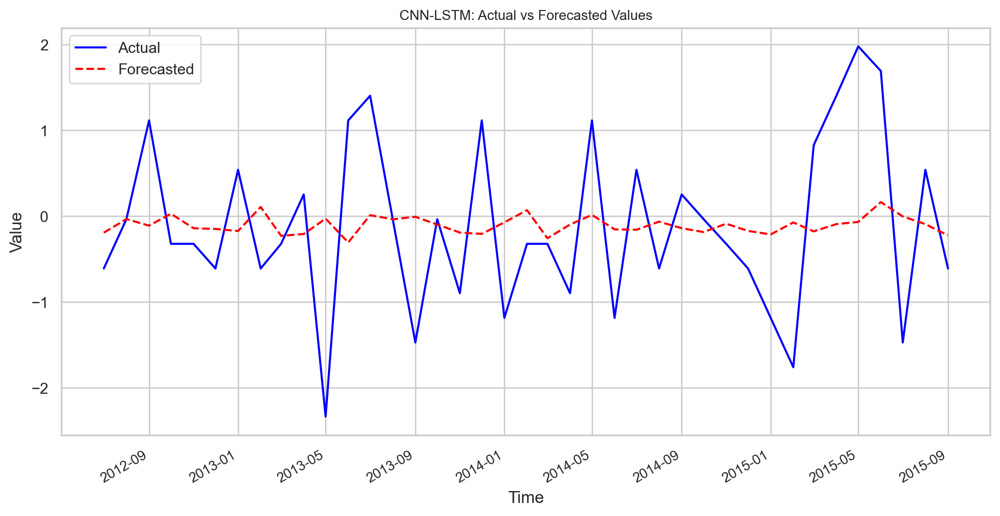

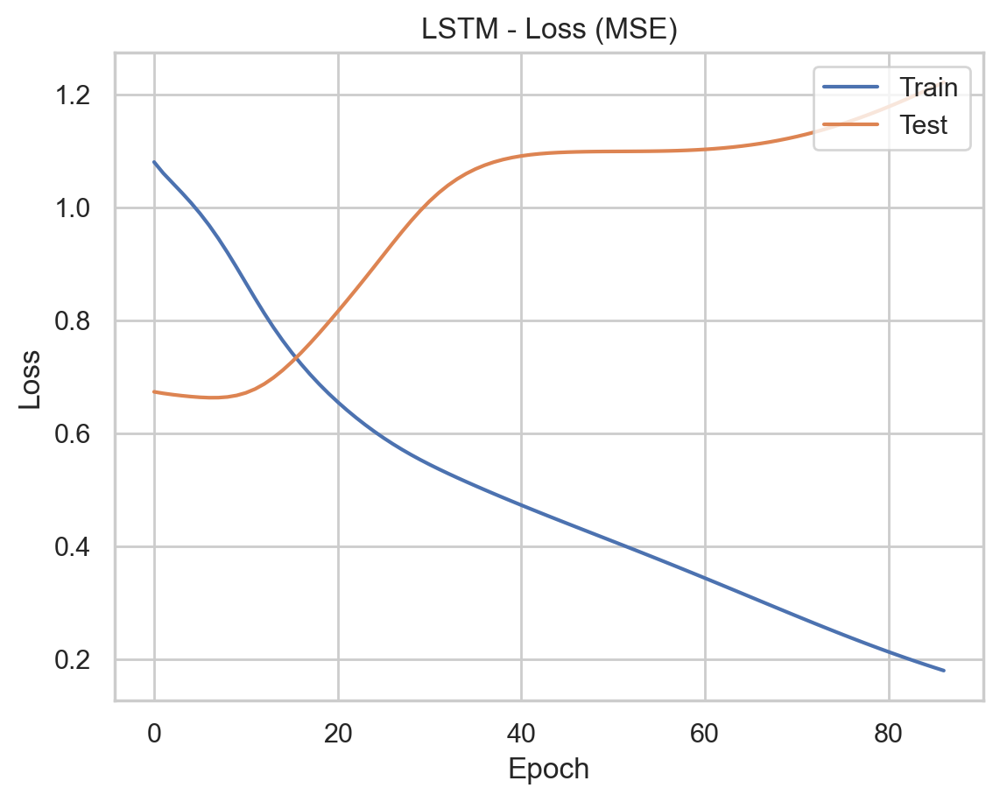

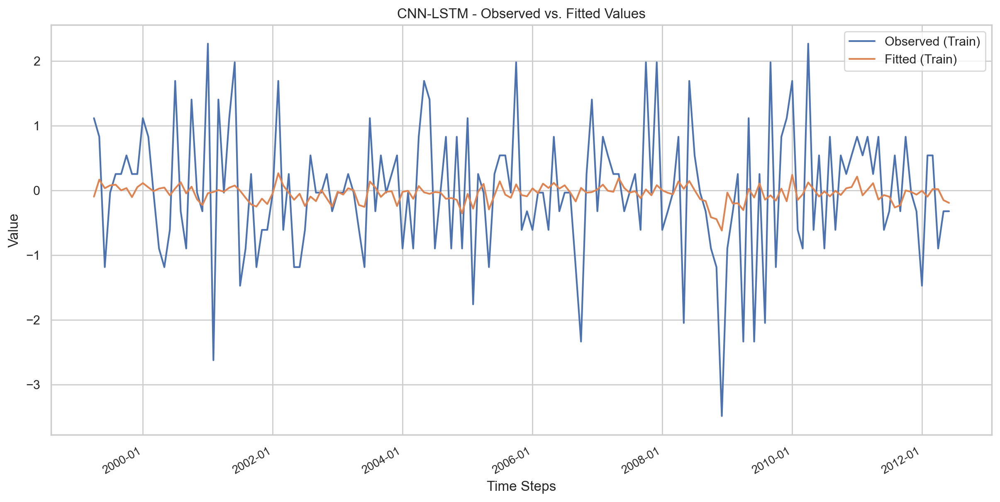

Mean Absolute Error (MAE): 0.80757831
Root Mean Squared Error (RMSE): 0.99714774


(<Sequential name=sequential_516, built=True>,
 0.8075783126285822,
 0.9971477387902408)

In [252]:
cnn_lstm_model_recursive(data_ls, target, scaler_y, test_size)

# NEW CNN-LSTM Model

In [27]:
from tensorflow.keras.layers import Conv1D, MaxPooling1D
print(data_x.index)



Index(['1999-04-01', '1999-05-01', '1999-06-01', '1999-07-01', '1999-08-01',
       '1999-09-01', '1999-10-01', '1999-11-01', '1999-12-01', '2000-01-01',
       ...
       '2024-03-01', '2024-04-01', '2024-05-01', '2024-06-01', '2024-07-01',
       '2024-08-01', '2024-09-01', '2024-10-01', '2024-11-01', '2024-12-01'],
      dtype='object', name='DATE', length=309)


Epoch 1/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 530ms/step - loss: 0.9864 - val_loss: 0.6146
Epoch 2/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 373ms/step - loss: 0.8723 - val_loss: 0.5913
Epoch 3/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 325ms/step - loss: 0.8407 - val_loss: 0.5336
Epoch 4/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 381ms/step - loss: 0.7753 - val_loss: 0.4924
Epoch 5/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 433ms/step - loss: 0.7484 - val_loss: 0.4331
Epoch 6/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 317ms/step - loss: 0.7211 - val_loss: 0.4064
Epoch 7/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 312ms/step - loss: 0.6640 - val_loss: 0.4090
Epoch 8/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 314ms/step - loss: 0.6756 - val_loss: 0.4059
Epoch 9/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 313ms/step - loss: 0.6615 - val_loss: 0.4014
Epoch 10/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 317ms/step - loss: 0.6430 - val_loss: 0.4049
Epoch 11/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 315ms/step - loss: 0.6444 - val_loss: 0.4350
Epoch 12/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 427ms/step - loss: 0.6

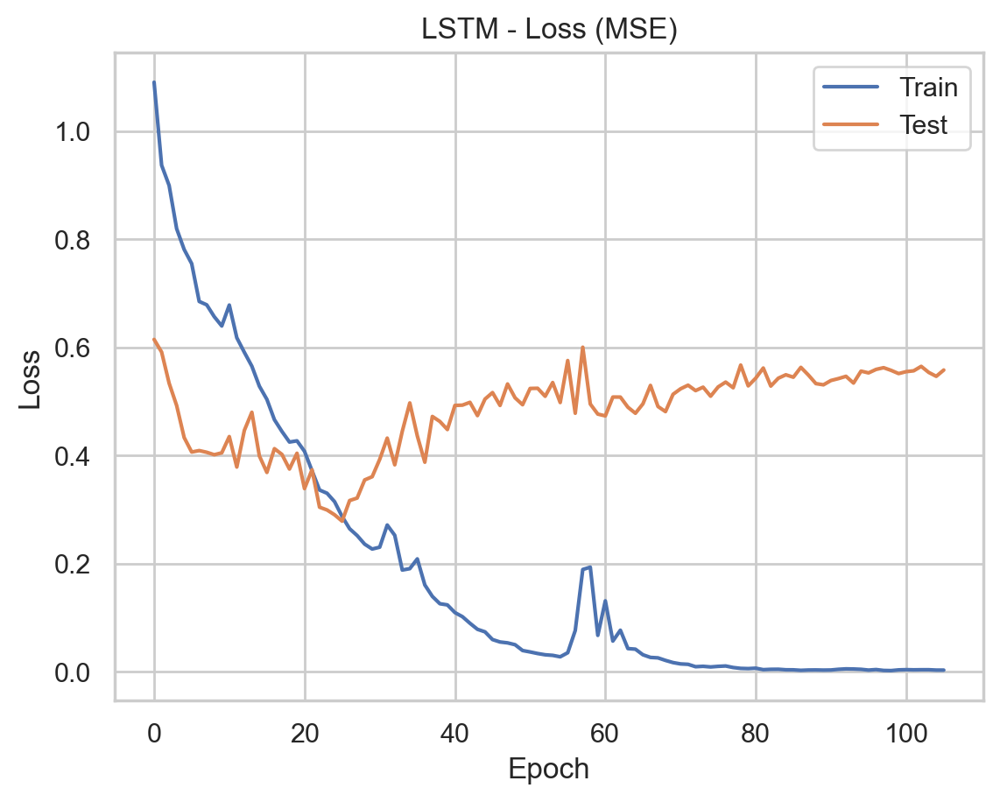

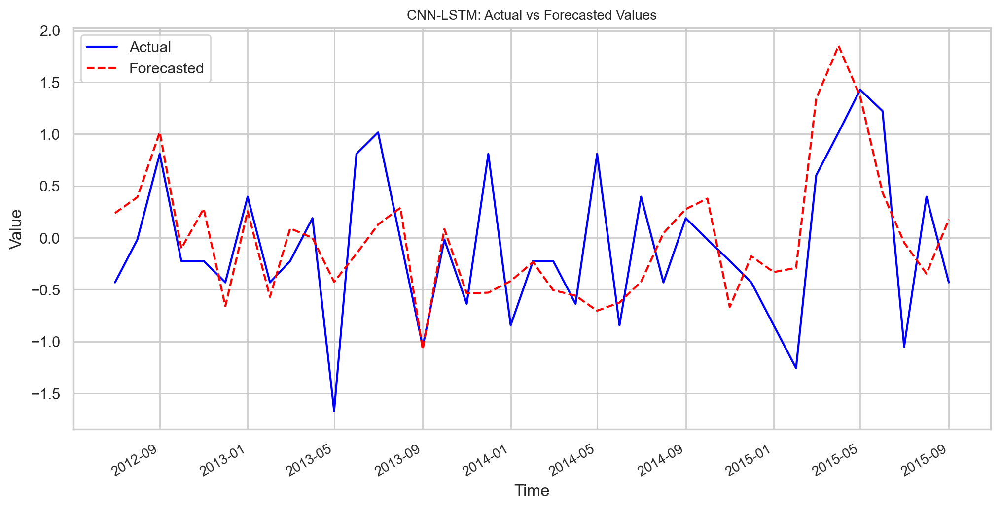

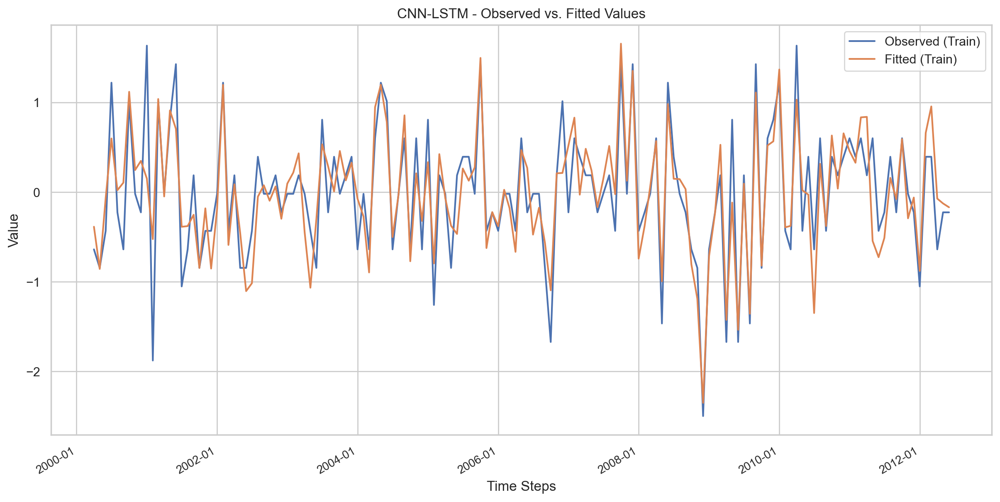

Mean Absolute Error (MAE): 0.49117698
Root Mean Squared Error (RMSE): 0.62510941


In [180]:

# Re-define the updated pipeline with temporal features and ConvLSTM2D
def inverse_transform_1(scaler, data):
    if isinstance(data, str):
        raise ValueError(f"Expected array-like, but got string: {data}")
    return scaler.inverse_transform(np.array(data).reshape(-1, 1))

def add_time_features(df):
    df['month'] = df.index.month
    df['quarter'] = df.index.quarter
    df['year'] = df.index.year
    df['month_sin'] = np.sin(2 * np.pi * df['month'] / 12)
    df['month_cos'] = np.cos(2 * np.pi * df['month'] / 12)
    return df.drop(columns=['month', 'quarter', 'year'])

def prepare_data_1(data_df, target_column, test_size, look_back=12, test_size_percent=False):
    if test_size_percent:
        test_size = int(len(data_df) * test_size)

    y = data_df[[target_column]]
    X = data_df.drop(target_column, axis=1)

    features = X.values
    target = y.values

    X_seq, y_seq, indices = [], [], []
    for i in range(look_back, len(data_df)):
        window = features[i - look_back:i]
        X_seq.append(window)
        y_seq.append(target[i])
        indices.append(data_df.index[i])

    X_seq = np.array(X_seq)  # Shape: (samples, timesteps, features)
    y_seq = np.array(y_seq)  # Shape: (samples, 1)
    indices = np.array(indices)

    split_index = len(X_seq) - test_size

    # Split before scaling
    X_train = X_seq[:split_index]
    y_train = y_seq[:split_index]
    X_test = X_seq[split_index:]
    y_test = y_seq[split_index:]
    train_index = indices[:split_index]
    test_index = indices[split_index:]

    # Scale features
    num_features = X_train.shape[2]
    scaler_X = StandardScaler()
    scaler_y1 = StandardScaler()

    # Flatten X to 2D for scaling, then reshape back
    X_train_flat = X_train.reshape(-1, num_features)
    X_train_scaled_flat = scaler_X.fit_transform(X_train_flat)
    X_train_scaled = X_train_scaled_flat.reshape(X_train.shape)

    X_test_flat = X_test.reshape(-1, num_features)
    X_test_scaled_flat = scaler_X.transform(X_test_flat)
    X_test_scaled = X_test_scaled_flat.reshape(X_test.shape)

    # Scale y
    y_train_scaled = scaler_y1.fit_transform(y_train)
    y_test_scaled = scaler_y1.transform(y_test)

    # Image-shaped padding for ConvLSTM
    rows, cols = 3, 6
    assert rows * cols >= num_features, f"{rows}x{cols} grid too small for {num_features} features"

    def pad_and_reshape(X):
        padded = np.zeros((X.shape[0], X.shape[1], rows, cols))
        for i in range(X.shape[0]):
            for j in range(X.shape[1]):
                flat = X[i, j]
                padded_flat = np.zeros(rows * cols)
                padded_flat[:num_features] = flat
                padded[i, j] = padded_flat.reshape((rows, cols))
        return padded[..., np.newaxis]  # add channel dim

    X_train_final = pad_and_reshape(X_train_scaled)
    X_test_final = pad_and_reshape(X_test_scaled)

    return X_train_final, y_train_scaled, X_test_final, y_test_scaled, test_index, train_index, scaler_y1

def train_model_1(model, X_train, y_train):
    early_stopping = EarlyStopping(monitor='val_loss', patience=80, restore_best_weights=True)
    history = model.fit(
        X_train, y_train,
        epochs=600,
        batch_size=48,
        validation_split=0.2,
        shuffle=False,
        callbacks=[early_stopping]
    )
    return history

def evaluate_model_1(model, X_test, y_test):
    loss = model.evaluate(X_test, y_test, verbose=0)
    predictions = model.predict(X_test, verbose=0)
    return loss, predictions

def build_model_1(input_shape):
    model = Sequential([
        Bidirectional(ConvLSTM2D(filters=256, kernel_size=(2, 2), activation='tanh', return_sequences=True, input_shape=input_shape)),
        Dropout(0.2),
        Bidirectional(ConvLSTM2D(filters=128, kernel_size=(2, 2), activation='tanh')),
        Flatten(),
        Dense(1)
    ])
    model.compile(optimizer=Adam(0.0005), loss='mse')
    return model

def cnn_lstm_model_1(data, test_size, look_back=12):
    X_train, y_train, X_test, y_test, test_index, train_index, scaler_y1 = prepare_data_1(data, target, test_size=test_size, look_back=look_back)
    model = build_model_1(X_train.shape[1:])
    history = train_model_1(model, X_train, y_train)

    loss, predictions = evaluate_model_1(model, X_test, y_test)
    # print(f'Test Loss: {loss}')
    # print(f'Type of predictions: {type(predictions)}')

    y_test_actual = inverse_transform_1(scaler_y1, y_test)
    predictions_actual = inverse_transform_1(scaler_y1, predictions)

    mae = mean_absolute_error(y_test_actual, predictions_actual)
    rmse = np.sqrt(mean_squared_error(y_test_actual, predictions_actual))

    predictions_train = model.predict(X_train, verbose=0)
    predictions_train_actual = inverse_transform_1(scaler_y1, predictions_train)
    y_train_actual = inverse_transform_1(scaler_y1, y_train)

    plot_loss(history)
    plot_predictions(y_test_actual, predictions_actual, test_index)
    plot_observed_vs_fitted(y_train_actual, predictions_train_actual, train_index)

    print(f'Mean Absolute Error (MAE): {mae:.8f}')
    print(f'Root Mean Squared Error (RMSE): {rmse:.8f}')

    return model, X_train, X_test, mae, rmse

model, X_train, X_test, cnn_mae, cnn_rmse = cnn_lstm_model_1(data_l, test_size=test_size, look_back=12)


# SHAP Value Estimation for CNN-LSTM Model

In [111]:
print(data_x.shape)
print(data_l.shape)
print(data_x.columns)



(198, 20)
(310, 19)
Index(['UNERWG', 'ECBIRRO', 'ECBDFR', 'ECBMLFR', 'MMR', 'CPI', 'RETAILMV',
       'RETAILXMV', 'RETAILGSR', 'RETAILGF', 'GOODFBT', 'AGRPROD', 'PPIIP',
       'WPI', 'EPI', 'IPI', 'HICP', 'LTIR', 'UR', 'dfCPI_L1'],
      dtype='object')


  0%|          | 0/39 [00:00<?, ?it/s]

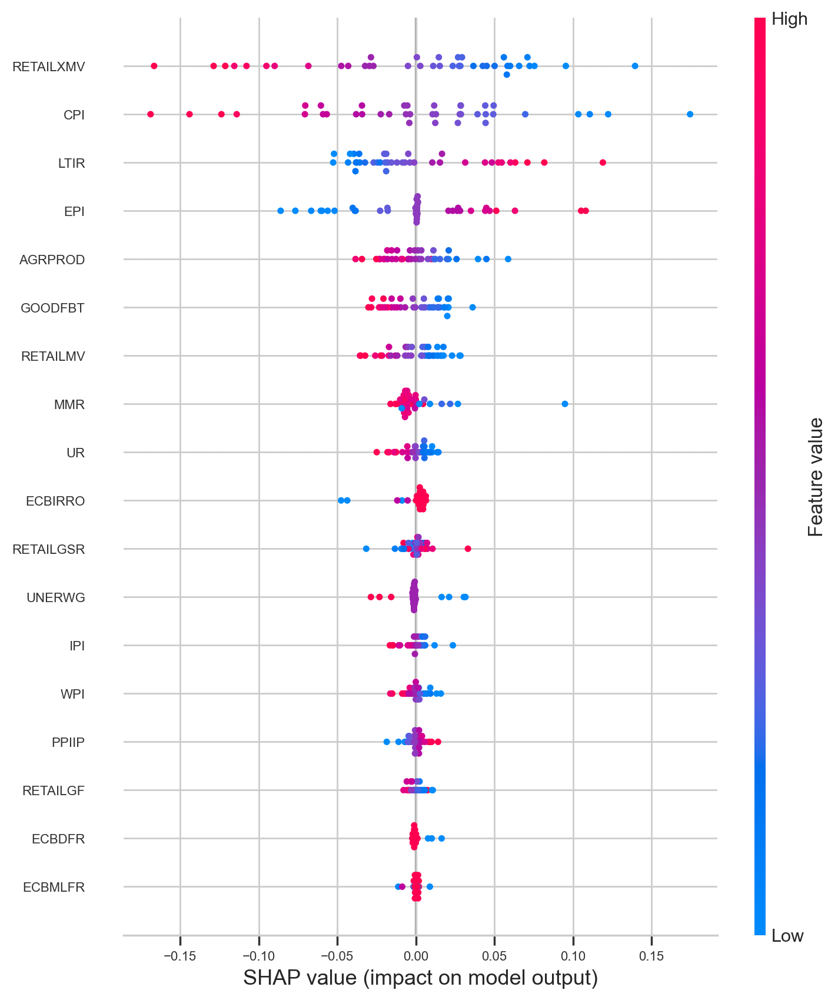

In [31]:

# Wrapper function for SHAP
def model_predict(X):
    """Predict function for SHAP that ensures correct input shape."""
    X = X.reshape((X.shape[0], 1, 1, 1, X.shape[1]))  # Reshape to original model input shape
    return model.predict(X, verbose=0).flatten()  # Flatten output for SHAP

# Select a subset of X_test for SHAP analysis
feature_names = data_ls.drop(columns=[target]).columns.tolist()
num_samples = min(50, X_test.shape[0])  # Ensure we don't exceed the available samples

X_sample = X_test[:num_samples].reshape((num_samples, X_test.shape[-1]))  # Convert to 2D
X_sample_df = pd.DataFrame(X_sample, columns=feature_names)  # Convert NumPy array back to DataFrame

# Create Kernel SHAP Explainer
explainer = shap.KernelExplainer(model_predict, X_sample_df)

# Compute SHAP values
shap_values = explainer.shap_values(X_sample_df)

# Create SHAP summary plot
fig, ax = plt.subplots(figsize=(10, 6))  # Adjust figure size if needed
shap.summary_plot(shap_values, X_sample_df, show=False)  # Prevent immediate display

# Adjust font sizes
for item in ax.get_xticklabels() + ax.get_yticklabels():
    item.set_fontsize(8)  # Change this value to your desired font size

plt.show()

# Plot summary plot
# shap.summary_plot(shap_values, X_sample_df)


# ***Top Influential Variables***

In [32]:

# Compute mean absolute SHAP values for each feature
shap_importance = np.abs(shap_values).mean(axis=0)

# Create a dictionary mapping feature names to their importance
shap_importance_dict = dict(zip(feature_names, shap_importance))

# Sort features by importance (descending order)
sorted_features = sorted(shap_importance_dict, key=shap_importance_dict.get, reverse=True)



In [33]:
# Convert the dictionary to a list of (feature, importance) tuples
shap_importance_list = list(shap_importance_dict.items())

# Sort the list in descending order based on the importance value (second element of the tuple)
shap_importance_list.sort(key=lambda item: item[1], reverse=True)

# Print the sorted feature names and their importance values
print("SHAP Feature Importance (Descending Order):")
for feature, importance in shap_importance_list:
    print(f"{feature}: {importance:.4f}") # You can adjust the formatting of the importance value

SHAP Feature Importance (Descending Order):
RETAILXMV: 0.0567
CPI: 0.0533
LTIR: 0.0343
EPI: 0.0325
AGRPROD: 0.0159
GOODFBT: 0.0153
RETAILMV: 0.0141
MMR: 0.0094
UR: 0.0073
ECBIRRO: 0.0060
RETAILGSR: 0.0054
UNERWG: 0.0052
IPI: 0.0047
WPI: 0.0042
PPIIP: 0.0041
RETAILGF: 0.0034
ECBDFR: 0.0018
ECBMLFR: 0.0015


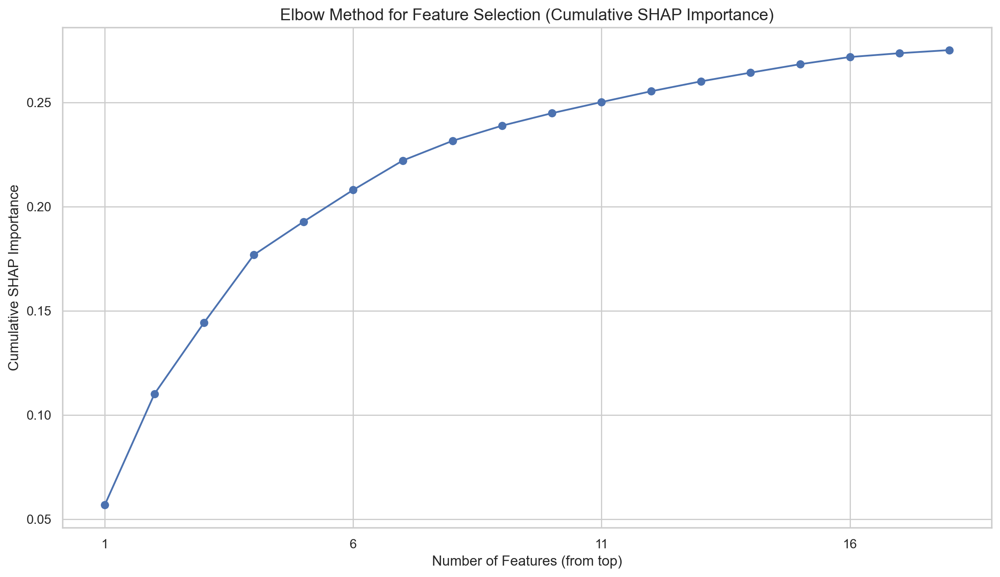

In [34]:
# Extract importance values
importance_values = [item[1] for item in shap_importance_list]

# Calculate cumulative importance
cumulative_importance = [sum(importance_values[:i+1]) for i in range(len(importance_values))]

# Plotting with adjustments
plt.figure(figsize=(12, 7))  # Increase figure size
plt.plot(range(1, len(importance_values) + 1), cumulative_importance, marker='o', linestyle='-')
plt.xlabel("Number of Features (from top)", fontsize=12)
plt.ylabel("Cumulative SHAP Importance", fontsize=12)
plt.title("Elbow Method for Feature Selection (Cumulative SHAP Importance)", fontsize=14)
plt.grid(True)

# Adjust x-axis ticks to be less dense (show every 5 features)
plt.xticks(range(1, len(importance_values) + 1, 5))

plt.tight_layout()
plt.show()

In [35]:
# Since no elbow we settle for the top 30 variables as this captures over 80% of the total importance
# one_third = len(sorted_features) // 3
top_influential_variables = np.array(sorted_features)[:11]

# Print the top influential variables
print("*** Top 11 influential variables based on elbow ***")
print(top_influential_variables)
print("*** All variables sorted in order of influence ***")
print(sorted_features)

*** Top 11 influential variables based on elbow ***
['RETAILXMV' 'CPI' 'LTIR' 'EPI' 'AGRPROD' 'GOODFBT' 'RETAILMV' 'MMR' 'UR'
 'ECBIRRO' 'RETAILGSR']
*** All variables sorted in order of influence ***
['RETAILXMV', 'CPI', 'LTIR', 'EPI', 'AGRPROD', 'GOODFBT', 'RETAILMV', 'MMR', 'UR', 'ECBIRRO', 'RETAILGSR', 'UNERWG', 'IPI', 'WPI', 'PPIIP', 'RETAILGF', 'ECBDFR', 'ECBMLFR']


# ***CNN-LSTM + Variable Selection***

In [36]:

# Add the target variable to the list of influential variables
top_influential_variables = np.append(top_influential_variables, target)
data_lsv = data_ls[top_influential_variables]


Epoch 1/600
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - loss: 0.5634 - val_loss: 0.3927
Epoch 2/600
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.5331 - val_loss: 0.3766
Epoch 3/600
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.5116 - val_loss: 0.3648
Epoch 4/600
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4937 - val_loss: 0.3568
Epoch 5/600
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4791 - val_loss: 0.3524
Epoch 6/600
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4668 - val_loss: 0.3510
Epoch 7/600
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4565 - val_loss: 0.3517
Epoch 8/600
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4478 - val_loss: 0.3544
Epoch 9/600
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4407 - val_loss: 0.3580
Epoch 10/600
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4346 - val_loss: 0.3631
Epoch 11/600
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4294 - val_loss: 0.3689
Epoch 12/600
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4251 - val_loss: 0.3750


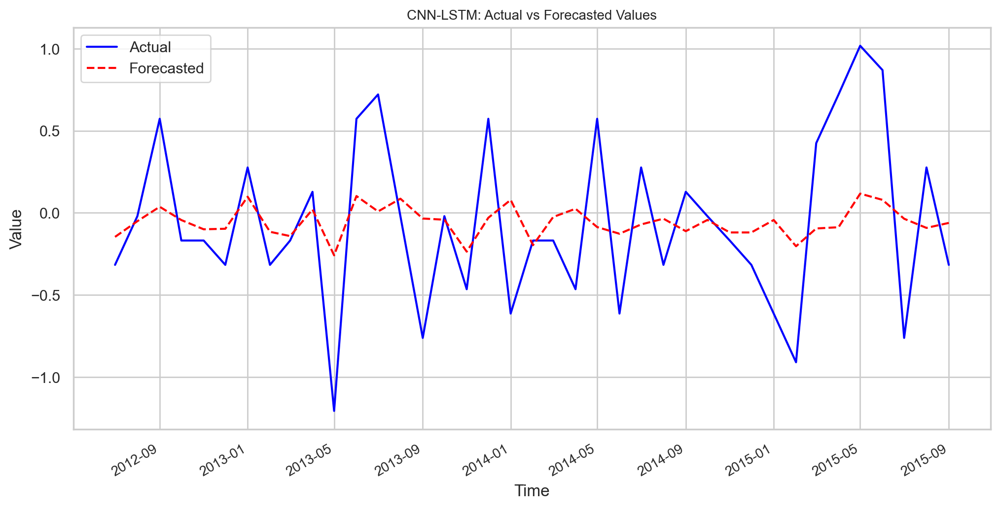

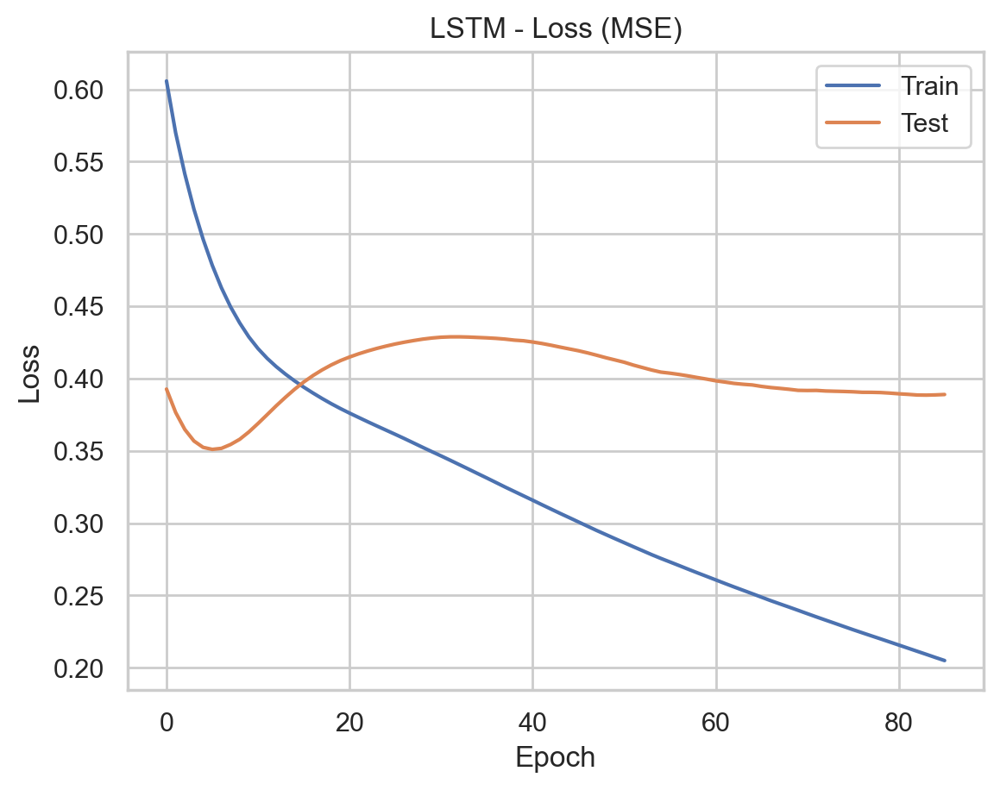

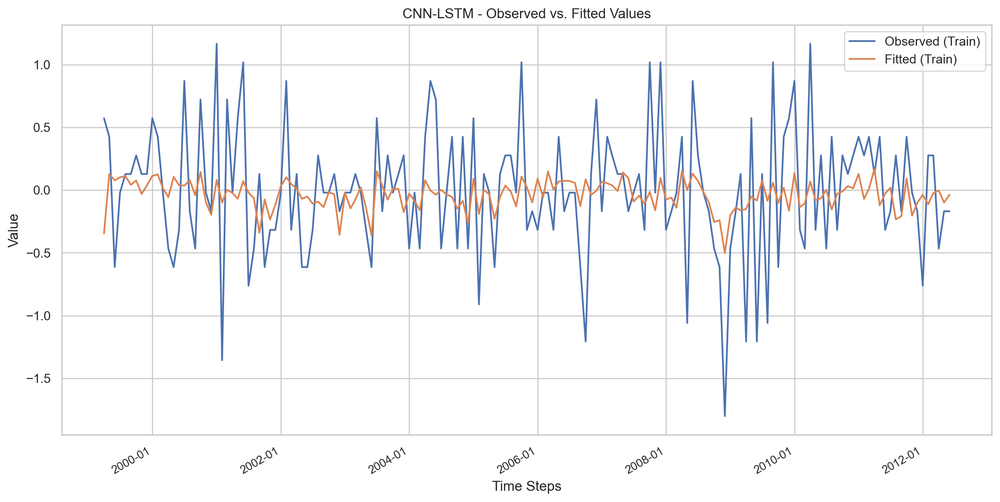

Mean Absolute Error (MAE): 0.37857801
Root Mean Squared Error (RMSE): 0.47169427


In [37]:
model_var_sel, X_train_var_sel, X_test_var_sel, cnn_mae_var_sel, cnn_rmse_var_sel = cnn_lstm_model(data_lsv, scaler_y)


# CNN-LSTM + VAE

In [38]:

class VAE(Model):
    def __init__(self, encoder, decoder, **kwargs):
        super(VAE, self).__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder
        self.total_loss_tracker = tf.keras.metrics.Mean(name="total_loss")
        self.reconstruction_loss_tracker = tf.keras.metrics.Mean(name="reconstruction_loss")
        self.kl_loss_tracker = tf.keras.metrics.Mean(name="kl_loss")

    def train_step(self, data):
        if isinstance(data, tuple):
            data = data[0]
        with tf.GradientTape() as tape:
            z_mean, z_log_var, z = self.encoder(data)
            reconstruction = self.decoder(z)
            # reconstruction_loss = tf.reduce_mean(tf.reduce_sum(tf.square(data - reconstruction), axis=1))
            mse = tf.keras.losses.MeanSquaredError(reduction=tf.keras.losses.Reduction.SUM)
            reconstruction_loss = mse(data, reconstruction)
            # mse = tf.keras.losses.MeanSquaredError()
            # reconstruction_loss = mse(data, reconstruction)

            kl_loss = -0.5 * tf.reduce_mean(tf.reduce_sum(1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var), axis=1))
            total_loss = reconstruction_loss + kl_loss

        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        self.total_loss_tracker.update_state(total_loss)
        self.reconstruction_loss_tracker.update_state(reconstruction_loss)
        self.kl_loss_tracker.update_state(kl_loss)
        return {
            "loss": self.total_loss_tracker.result(),
            "reconstruction_loss": self.reconstruction_loss_tracker.result(),
            "kl_loss": self.kl_loss_tracker.result(),
        }

def build_vae(input_dim, latent_dim=5):
    # Encoder
    encoder_inputs = Input(shape=(input_dim,))
    x = layers.Dense(64, activation="selu")(encoder_inputs)
    z_mean = layers.Dense(latent_dim, name="z_mean")(x)
    z_log_var = layers.Dense(latent_dim, name="z_log_var")(x)

    def sampling(args):
        z_mean, z_log_var = args
        epsilon = tf.random.normal(shape=(tf.shape(z_mean)[0], latent_dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon

    z = layers.Lambda(sampling)([z_mean, z_log_var])
    encoder = Model(encoder_inputs, [z_mean, z_log_var, z], name="encoder")

    # Decoder
    latent_inputs = Input(shape=(latent_dim,))
    x = layers.Dense(64, activation="selu")(latent_inputs)
    decoder_outputs = layers.Dense(input_dim, activation="selu")(x)
    decoder = Model(latent_inputs, decoder_outputs, name="decoder")

    # VAE Model
    vae = VAE(encoder, decoder)
    vae.compile(optimizer="adam")
    return vae, encoder



In [39]:
print(data.head())

              UNERWG   ECBIRRO    ECBDFR   ECBMLFR       MMR       CPI  \
DATE                                                                     
1999-04-01  0.089274 -3.094987 -3.152990 -5.666850  0.744139  0.996641   
1999-05-01 -1.761671 -0.002983 -0.020147  0.020115  0.566968 -0.993065   
1999-06-01  0.089274 -0.002983 -0.020147  0.020115  0.625457  0.249666   
1999-07-01 -0.836198 -0.002983 -0.020147  0.020115  0.666859  0.495552   
1999-08-01  0.089274 -0.002983 -0.020147  0.020115  0.625457 -0.739853   

            RETAILMV  RETAILXMV  RETAILGSR  RETAILGF   GOODFBT   AGRPROD  \
DATE                                                                       
1999-04-01  0.000805   0.001670   0.003333  0.486577  0.469336 -0.729090   
1999-05-01 -0.841057  -0.662277   0.003333 -0.482771 -0.464889  0.034083   
1999-06-01  0.283115   0.002467  -0.498380  0.001577 -0.232283  0.448289   
1999-07-01  0.002157   0.224577  -0.249998 -0.485383 -0.234198 -1.218007   
1999-08-01 -0.279139  -0.

In [40]:
# # 1. Extract raw features (no lagging yet)
# X_vae = data.copy().drop(columns=['CPI'])
# y_target = data['CPI']
#
# # 2. Scale & run VAE (as you already have)
# vae, encoder = build_vae(X_vae.shape[1], latent_dim=5)
# vae.fit(X_vae, X_vae, epochs=50, batch_size=32)
# _, _, z_encoded = encoder.predict(X_vae)
#
# # 3. Combine compressed features + target
# compressed_df = pd.DataFrame(z_encoded, columns=[f'z{i+1}' for i in range(z_encoded.shape[1])], index=data.index)
# compressed_df['CPI'] = y_target.values
#
# # 4. Apply lagging
# data_ls_compressed = create_lag_features(compressed_df, columns=compressed_df.columns, lags=3)
# data_ls_compressed.dropna(inplace=True)

def prepare_vae_data(data):
    # 1. Extract raw features (no lagging yet)
    X_vae = data.copy().drop(columns=[target])
    y_target = data[target]

    # 2. Scale & run VAE (as you already have)
    vae, encoder = build_vae(X_vae.shape[1], latent_dim=5)
    vae.fit(X_vae, X_vae, epochs=50, batch_size=32)

    # print("Input to VAE:", X_vae.shape)
    # print(f"Any NaNs? {np.isnan(X_vae).any()}")
    # print(f"Any infs? {np.isinf(X_vae).any()}")
    # assert X_vae.shape[0] > 0 and X_vae.shape[1] > 0, f"X_vae shape is {X_vae.shape}"

    _, _, z_encoded = encoder.predict(X_vae)

    # 3. Combine compressed features + target
    compressed_df = pd.DataFrame(z_encoded, columns=[f'z{i+1}' for i in range(z_encoded.shape[1])], index=data.index)
    compressed_df[target] = y_target.values

    # 4. Apply lagging
    # data_ls_compressed = create_lag_features(compressed_df.copy(), columns=compressed_df.columns, lags=3)
    # data_ls_compressed.dropna(inplace=True)

    return compressed_df


In [41]:
data_comp = prepare_vae_data(data)

Epoch 1/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 928us/step - kl_loss: 3.6622 - loss: 48.6451 - reconstruction_loss: 44.9829
Epoch 2/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 939us/step - kl_loss: 3.1607 - loss: 41.6049 - reconstruction_loss: 38.4441
Epoch 3/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 556us/step - kl_loss: 2.4953 - loss: 33.1382 - reconstruction_loss: 30.6430
Epoch 4/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 640us/step - kl_loss: 2.4014 - loss: 33.2675 - reconstruction_loss: 30.8661
Epoch 5/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 760us/step - kl_loss: 2.5090 - loss: 30.0254 - reconstruction_loss: 27.5163
Epoch 6/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - kl_loss: 2.5046 - loss: 26.7704 - reconstruction_loss: 24.2658
Epoch 7/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - kl_loss: 2.6341 - loss: 27.2335 - reconstruction_loss: 24.5994
Epoch 8/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 704us/step - kl_loss: 2.4605 - loss: 22.4815 - reconstruction_loss: 20.0210
Epoch 9/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - kl_loss: 2.9106 - loss: 27.000

In [42]:
# X_train, y_train, X_test, y_test, scaler_y = prep_data_for_cnn_r(data_ls_vae, 'CPI', test_size=24)
# cnn_lstm_model(compressed_df, scaler_y)
print(data_comp.shape)
print(data.shape)
# print(data_ls_compressed.shape)

(198, 6)
(198, 19)


Epoch 1/600
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step - loss: 0.4931 - val_loss: 0.3373
Epoch 2/600
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4791 - val_loss: 0.3345
Epoch 3/600
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4715 - val_loss: 0.3337
Epoch 4/600
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4662 - val_loss: 0.3346
Epoch 5/600
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4627 - val_loss: 0.3365
Epoch 6/600
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4603 - val_loss: 0.3389
Epoch 7/600
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4586 - val_loss: 0.3417
Epoch 8/600
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4571 - val_loss: 0.3442
Epoch 9/600
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4557 - val_loss: 0.3466
Epoch 10/600
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4544 - val_loss: 0.3488
Epoch 11/600
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4529 - val_loss: 0.3508
Epoch 12/600
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4512 - val_loss: 0.3524


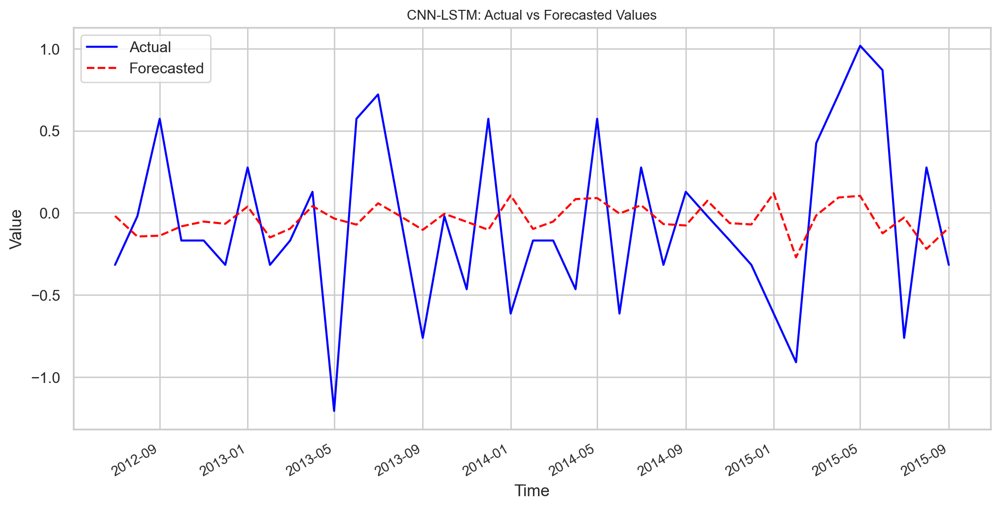

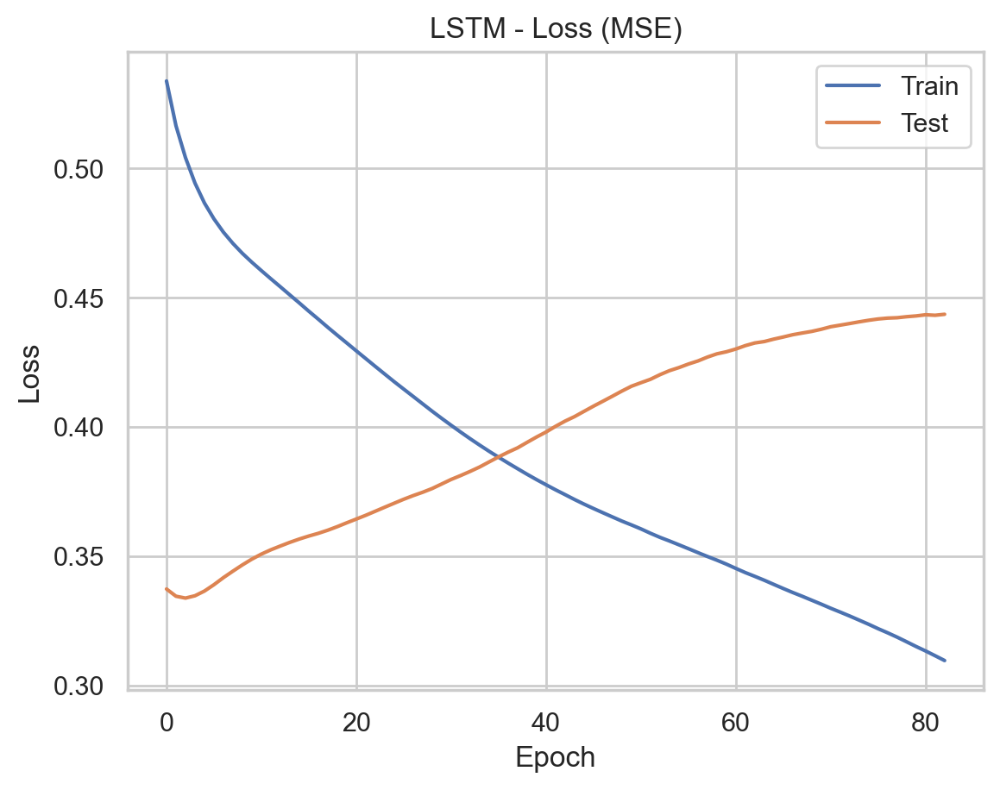

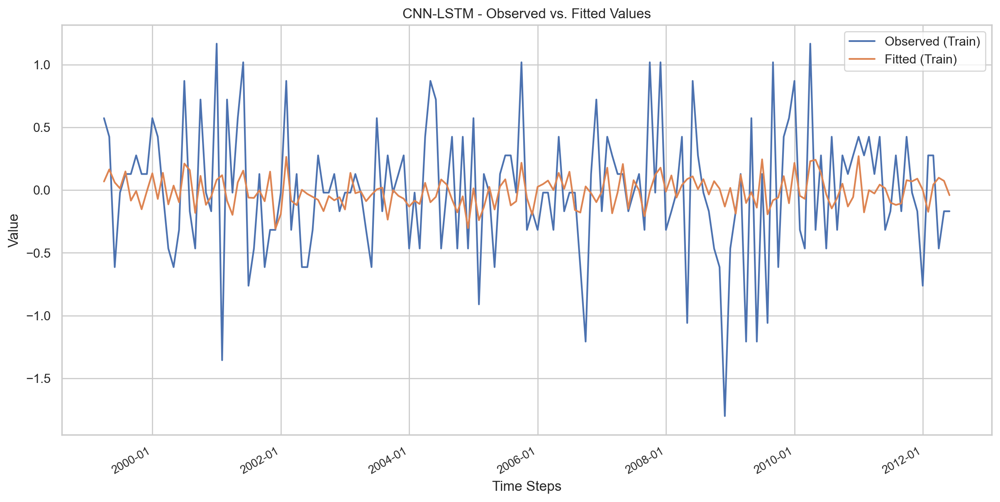

Mean Absolute Error (MAE): 0.40686159
Root Mean Squared Error (RMSE): 0.50511286


In [43]:
model_cnn_var, X_train_cnn_var, X_test_cnn_var, cnn_mae_vae, cnn_rmse_vae = cnn_lstm_model(data_comp, scaler_y)


# All results including CNN-LSTM + Variable Selection (VarSel)
For one sample run

In [44]:
print(f'CNN-LSTM (MAE) + VAE: {cnn_mae_vae}')
print(f'CNN-LSTM (RMSE) + VAE: {cnn_rmse_vae}')
print(f'CNN-LSTM (MAE) + VarSel: {cnn_mae_var_sel}')
print(f'CNN-LSTM (RMSE) + VarSel: {cnn_rmse_var_sel}')
print(f'CNN-LSTM (MAE): {cnn_mae}')
print(f'CNN-LSTM (RMSE): {cnn_rmse}')
print(f'VAR (MAE): {var_mae}')
print(f'VAR (RMSE): {var_rmse}')
print(f'ARIMA (MAE): {arima_mae}')
print(f'ARIMA (RMSE): {arima_rmse}')
print(f'SARIMA (MAE): {sarima_mae}')
print(f'SARIMA (RMSE): {sarima_rmse}')


CNN-LSTM (MAE) + VAE: 0.40686159156391444
CNN-LSTM (RMSE) + VAE: 0.5051128550898979
CNN-LSTM (MAE) + VarSel: 0.3785780061985543
CNN-LSTM (RMSE) + VarSel: 0.4716942699394162
CNN-LSTM (MAE): 0.396541712665359
CNN-LSTM (RMSE): 0.4939231504230176
VAR (MAE): 0.7736082729944899
VAR (RMSE): 1.0194200948198786
ARIMA (MAE): 0.5807519528091856
ARIMA (RMSE): 0.7314503983343175
SARIMA (MAE): 0.5152934347782612
SARIMA (RMSE): 0.6670722258835514


# CNN-VAE Setup

In [108]:

def prepare_data_cnn_vae(data, target_column=target, test_size=test_size, test_size_percent=False):
    """
    Splits the data into training and testing sets and reshapes it for ConvLSTM2D.

    Parameters:
    - data (DataFrame): The input dataset.
    - target_column (str): The column name of the target variable.
    - test_size (int or float): Number of test samples (if int) or percentage of data for testing (if float).
    - test_size_percent (bool): If True, interprets test_size as a percentage (0-1).

    Returns:
    - X_train, y_train, X_test, y_test: Training and testing datasets, reshaped for ConvLSTM2D.
    """
    if test_size_percent:
        test_size = int(len(data) * test_size)  # Convert percentage to absolute count

    train_df = data.iloc[:-test_size]
    test_df = data.iloc[-test_size:]
    train_index = train_df.index
    test_index = test_df.index

    X_train = train_df.drop(target_column, axis=1).values
    y_train = train_df[target_column].values
    X_test = test_df.drop(target_column, axis=1).values
    y_test = test_df[target_column].values

    X_train = X_train.reshape((X_train.shape[0], 1, 1, 1, X_train.shape[1]))
    X_test = X_test.reshape((X_test.shape[0], 1, 1, 1, X_test.shape[1]))

    return X_train, y_train, X_test, y_test, train_index, test_index

# BEST SO FAR 128, 16
def build_model_vae(input_shape):
    """Builds and compiles a ConvLSTM2D model."""
    model = Sequential([
        Bidirectional(ConvLSTM2D(filters=16, kernel_size=(1, 1), activation='tanh', return_sequences=True, input_shape=input_shape)),
        Bidirectional(ConvLSTM2D(filters=16, kernel_size=(1, 1), activation='tanh', return_sequences=True, input_shape=input_shape)),
        Bidirectional(ConvLSTM2D(filters=8, kernel_size=(1, 1), activation='tanh', return_sequences=False)),
        Flatten(),
        Dense(1)
    ])
    opt = Adam(learning_rate=0.0009)
    model.compile(optimizer=opt, loss='mse')
    return model

def train_model_vae(model, X_train, y_train):
    """Trains the model with early stopping."""
    early_stopping = EarlyStopping(monitor='val_loss', patience=80, restore_best_weights=True)
    history = model.fit(X_train, y_train, epochs=600, batch_size=48, validation_split=0.2, callbacks=[early_stopping], shuffle=False)
    return history


def cnn_lstm_model_vae(data, scaler_y, test_size=24):
    """Main function to execute the pipeline."""
    X_train, y_train, X_test, y_test, train_index, test_index = prepare_data_cnn_vae(data, test_size=test_size, test_size_percent=False)
    model = build_model_vae((X_train.shape[0], 1, 1, X_train.shape[-1]))
    history = train_model_vae(model, X_train, y_train)

    loss, predictions = evaluate_model(model, X_test, y_test)
    print(f'Test Loss: {loss}')

    y_test_actual = inverse_transform(scaler_y, y_test)
    predictions_actual = inverse_transform(scaler_y, predictions)

    mae = mean_absolute_error(y_test_actual, predictions_actual)
    rmse = np.sqrt(mean_squared_error(y_test_actual, predictions_actual))
    plot_cnn_forecast = plot_predictions(y_test_actual, predictions_actual, test_index)
    plot_loss(history)

    predictions_train = model.predict(X_train, verbose=0) # Predict on X_train
    predictions_train_actual = inverse_transform(scaler_y, predictions_train) # Inverse transform fitted values
    y_train_actual = inverse_transform(scaler_y, y_train) # Inverse transform y_train

    # --- Plot Observed vs Fitted on Training Data ---
    plot_cnn_obs_vs_fitted = plot_observed_vs_fitted(y_train_actual, predictions_train_actual, train_index) # Pass y_train_actual and predictions_train_actual
    # plot_observed_vs_fitted(y_train, predictions)

    print(f'Mean Absolute Error (MAE): {mae}')
    print(f'Root Mean Squared Error (RMSE): {rmse}')
    return model, X_train, X_test, mae, rmse



Epoch 1/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 242ms/step - loss: 0.6615 - val_loss: 1.5046
Epoch 2/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.6602 - val_loss: 1.5046
Epoch 3/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.6590 - val_loss: 1.5046
Epoch 4/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.6578 - val_loss: 1.5044
Epoch 5/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.6567 - val_loss: 1.5039
Epoch 6/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.6555 - val_loss: 1.5031
Epoch 7/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.6543 - val_loss: 1.5019
Epoch 8/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.6529 - val_loss: 1.5003
Epoch 9/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.6515 - val_loss: 1.4983
Epoch 10/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.6499 - val_loss: 1.4958
Epoch 11/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.6482 - val_loss: 1.4928
Epoch 12/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.6463 - val_loss: 1.489

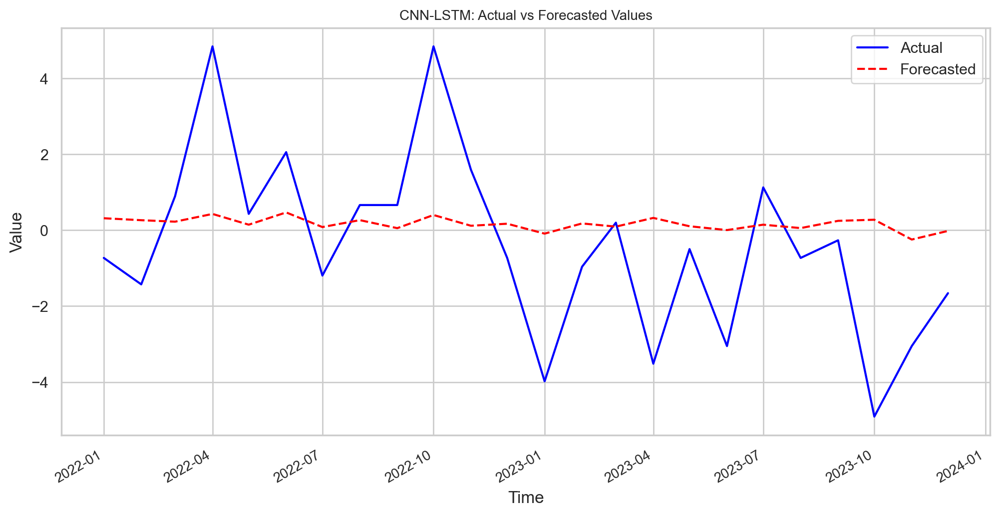

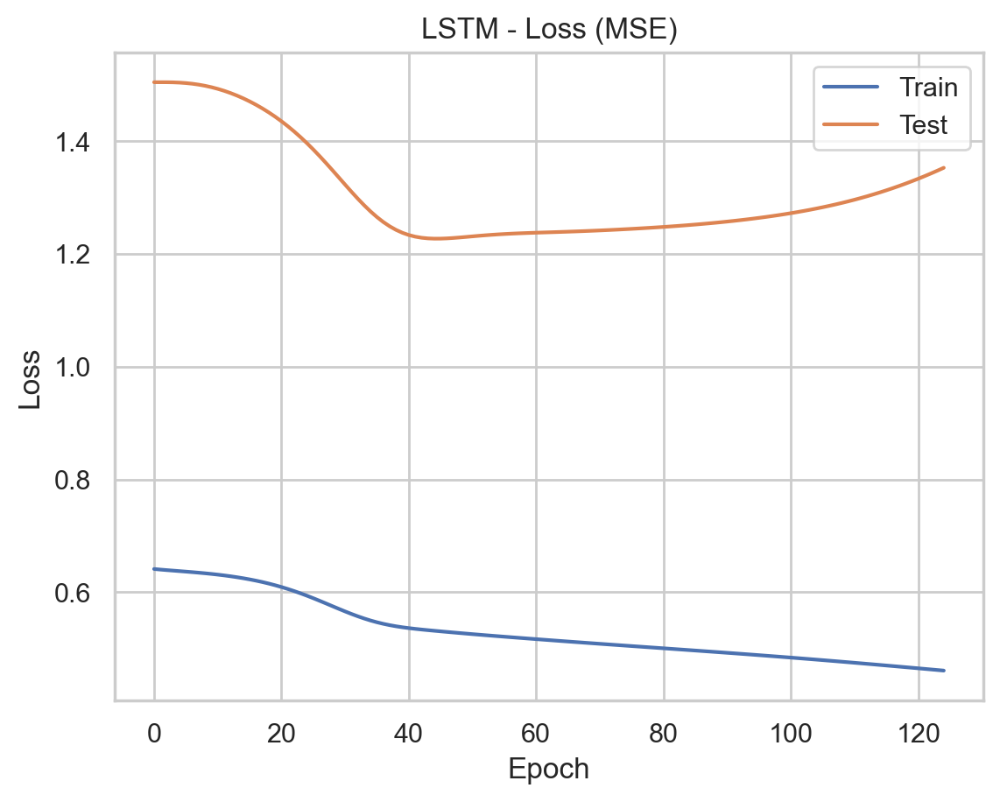

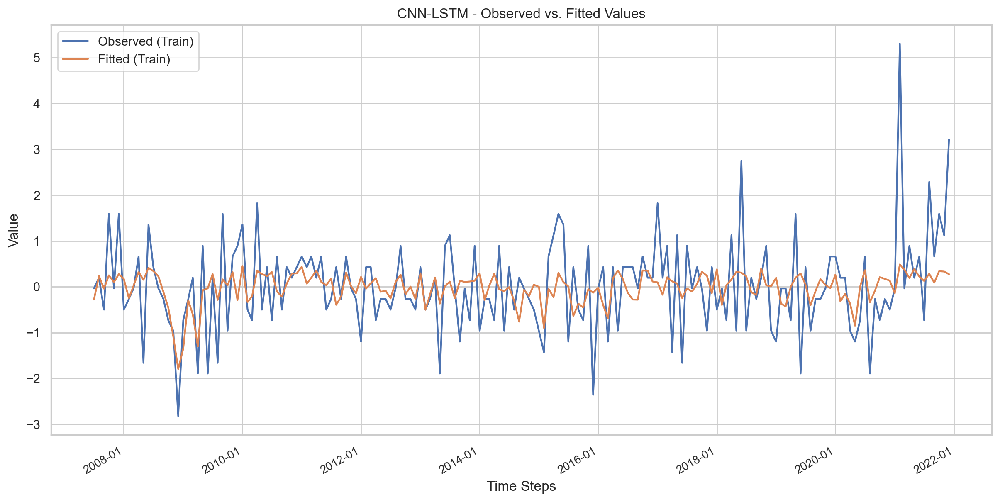

Mean Absolute Error (MAE): 1.8054856741902148
Root Mean Squared Error (RMSE): 2.340843328162818


In [109]:
model, X_train, X_test, cnn_vae_mae, cnn_vae_rmse = cnn_lstm_model_vae(data_comp, scaler_y)


In [218]:

# def prepare_data_cnn_vae(data_l, target_col='CPI', forecast_horizon=1, test_size=24, test_size_percent=False):
#     data_x = data_l.copy()
#     scaler_y = StandardScaler()
# 
#     # Separate features and target
#     y = data_x[[target_col]]
#     X = data_x.drop(columns=[target_col])
# 
#     # Scale target
#     y_scaled = scaler_y.fit_transform(y)
#     y_scaled_df = pd.DataFrame(y_scaled, columns=[target_col], index=data_x.index)
# 
#     # Shift target for forecasting horizon
#     y_scaled_df[target_col] = y_scaled_df[target_col].shift(-forecast_horizon)
#     data = pd.concat([X, y_scaled_df], axis=1)
#     data.dropna(inplace=True)
# 
#     if test_size_percent:
#         test_size = int(len(data) * test_size)
# 
#     # Train-test split
#     train_df = data.iloc[:-test_size]
#     test_df = data.iloc[-test_size:]
# 
#     X_train = train_df.drop(columns=[target_col]).values
#     y_train = train_df[target_col].values
#     X_test = test_df.drop(columns=[target_col]).values
#     y_test = test_df[target_col].values
# 
#     # Reshape to 5D for ConvLSTM
#     X_train = X_train.reshape((X_train.shape[0], 1, 1, 1, X_train.shape[1]))
#     X_test = X_test.reshape((X_test.shape[0], 1, 1, 1, X_test.shape[1]))
# 
#     return X_train, y_train, X_test, y_test, scaler_y, test_df.index, train_df.index
# 
# # BEST SO FAR
# def build_model_vae(input_shape):
#     """Builds and compiles a ConvLSTM2D model."""
#     model = Sequential([
#         ConvLSTM2D(filters=16, kernel_size=(1, 1), activation='selu', return_sequences=True, input_shape=input_shape),
#         ConvLSTM2D(filters=8, kernel_size=(1, 1), activation='selu', return_sequences=False),
#         Flatten(),
#         Dense(1)
#     ])
#     opt = Adam(learning_rate=0.0001)
#     model.compile(optimizer=opt, loss='mse')
#     return model
# 
# def train_model_vae(model, X_train, y_train):
#     """Trains the model with early stopping."""
#     early_stopping = EarlyStopping(monitor='val_loss', patience=80, restore_best_weights=True)
#     history = model.fit(X_train, y_train, epochs=600, batch_size=48, validation_split=0.2, callbacks=[early_stopping])
#     return history
# 
# def evaluate_model(model, X_test, y_test):
#     """Evaluates the model and returns the test loss and predictions."""
#     loss = model.evaluate(X_test, y_test, verbose=0)
#     predictions = model.predict(X_test, verbose=0)
#     return loss, predictions
# 
# def cnn_lstm_model_vae(data, test_size=24):
#     """Main function to execute the pipeline using VAE-compressed inputs."""
# 
#     # 1. Prepare VAE-compressed and lagged data
#     X_train, y_train, X_test, y_test, scaler_y, test_index, train_index = prepare_data_cnn_vae(
#         data, target_col='CPI', forecast_horizon=1, test_size=test_size
#     )
# 
#     # 3. Build, train and evaluate the CNN-LSTM model
#     model = build_model_vae((X_train.shape[1], X_train.shape[2], X_train.shape[3], X_train.shape[4]))  # match 5D input
#     # model = build_model_vae((X_train.shape[0], 1, 1, X_train.shape[-1]))
#     history = train_model_vae(model, X_train, y_train)
# 
#     loss, predictions = evaluate_model(model, X_test, y_test)
#     print(f'Test Loss: {loss}')
# 
#     # Inverse transform predictions and ground truth
#     y_test_actual = scaler_y.inverse_transform(y_test.reshape(-1, 1)).flatten()
#     predictions_actual = scaler_y.inverse_transform(predictions).flatten()
#     # y_test_actual = inverse_transform(scaler_y, y_test)
#     # predictions_actual = inverse_transform(scaler_y, predictions)
# 
#     plot_cnn_forecast = plot_predictions(y_test_actual, predictions_actual, test_index)
#     print("DETAILS")
#     print(y_test_actual.shape, predictions_actual.shape)
# 
#     mae = mean_absolute_error(y_test_actual, predictions_actual)
#     rmse = np.sqrt(mean_squared_error(y_test_actual, predictions_actual))
# 
#     plot_loss(history)
# 
#     # Predict on training data for visualization
#     predictions_train = model.predict(X_train, verbose=0)
#     predictions_train_actual = inverse_transform(scaler_y, predictions_train)
#     y_train_actual = inverse_transform(scaler_y, y_train)
#     plot_cnn_obs_vs_fitted = plot_observed_vs_fitted(y_train_actual, predictions_train_actual, train_index) # Pass y_train_actual and predictions_train_actual
# 
#     print(f'Mean Absolute Error (MAE): {mae}')
#     print(f'Root Mean Squared Error (RMSE): {rmse}')
#     return model, X_train, X_test, mae, rmse



In [233]:
# Call
# main(data_ls, scaler_y)


Mean Absolute Error (MAE): 0.46951469946838625
Root Mean Squared Error (RMSE): 0.6148211783163768

# ***Robust Test***

# ***ARIMA***

In [31]:
read_dir = r_State_Dir
# Function for created multi-step ahead data sets
def shift_target_per_step(data, target_col='CPI', horizon=1):
    data = data.copy()
    data[target_col] = data[target_col].shift(-horizon + 1)
    return data.dropna()

In [47]:

def train_and_evaluate_arima_model(data, auto_arima_model, title='ARIMA: Observed vs Fitted (24 Months Rolling)', target_column=target, test_size=test_size):
    """
    Performs a rolling multi-step-ahead ARIMA forecast for the entire test dataset.

    Parameters:
    - train_df (pd.DataFrame): Training data
    - test_df (pd.DataFrame): Test data
    - target_column (str): The target variable for evaluation (default 'CPI')
    - steps (int): Number of steps ahead for each rolling forecast

    Returns:
    - forecast_df (pd.DataFrame): Forecasted values for the entire test period
    - mae (float): Mean Absolute Error
    - rmse (float): Root Mean Squared Error
    """

    train_df = data.iloc[:-test_size]
    test_df = data.iloc[-test_size:]

    # Extract target series
    train_series = train_df[target_column]
    test_series = test_df[target_column]

    # Perform rolling forecasts
    history = train_series.tolist()
    predictions = []

    for i in range(len(test_series)):
        arima_model = ARIMA(history, order=auto_arima_model.order)  # Refit model each step
        arima_model_fit = arima_model.fit()
        forecast = arima_model_fit.forecast(steps=1)  # Forecast 'steps' ahead
        predictions.append(forecast[0])  # Store last predicted step
        history.append(test_series.iloc[i])  # Append actual value

    # Convert predictions to DataFrame
    forecast_df = pd.DataFrame(predictions, index=test_series.index, columns=[target_column])

    # Compute evaluation metrics
    # mae = mean_absolute_error(test_series, forecast_df[target_column])
    mae = mean_absolute_error(test_series.values, predictions)
    rmse = np.sqrt(mean_squared_error(test_series, forecast_df[target_column]) )

    return forecast_df, mae, rmse

In [49]:
horizon_name = f"dfHICP_L1"


In [51]:

arima_maes = []
arima_rmses = []
arima_all_forecasts = []

for i in range(100):

    filename = f"{horizon_name}_rolling_data_norm_{i + 1}.csv"
    file_path = os.path.join(all_LagsHICP_Dir, filename)
    data = pd.read_csv(file_path, index_col=0, parse_dates=True).drop(columns="HICP")

    # Read shuffled data from CSV file
    # file_path = os.path.join(read_dir, f"random_data_{i+1}.csv")
    # Create data DataFrame with selected columns
    # random_data.drop('HICP', axis=1)
    # df = random_data.copy()
    # data = shift_target_per_step(df, horizon=1)
    forecasted_cpi, mae, rmse = train_and_evaluate_arima_model(data, auto_arima_model_arima, test_size=test_size)
    arima_maes.append(mae)
    arima_rmses.append(rmse)
    arima_all_forecasts.append(forecasted_cpi)

# Calculate and print average MAE and RMSE for the ARIMA model
avg_arima_mae = np.mean(arima_maes)
avg_arima_rmse = np.mean(arima_rmses)


In [52]:

# Calculate and print average MAE and RMSE for the ARIMA model
avg_arima_mae = np.mean(arima_maes)
avg_arima_rmse = np.mean(arima_rmses)

print(f'ARIMA Average MAE: {avg_arima_mae}')
print(f'ARIMA Average RMSE: {avg_arima_rmse}')


ARIMA Average MAE: 0.7460256308991967
ARIMA Average RMSE: 1.0108396976208913


VAR Average MAE: 0.7460256308991967
VAR Average RMSE: 1.0108396976208913


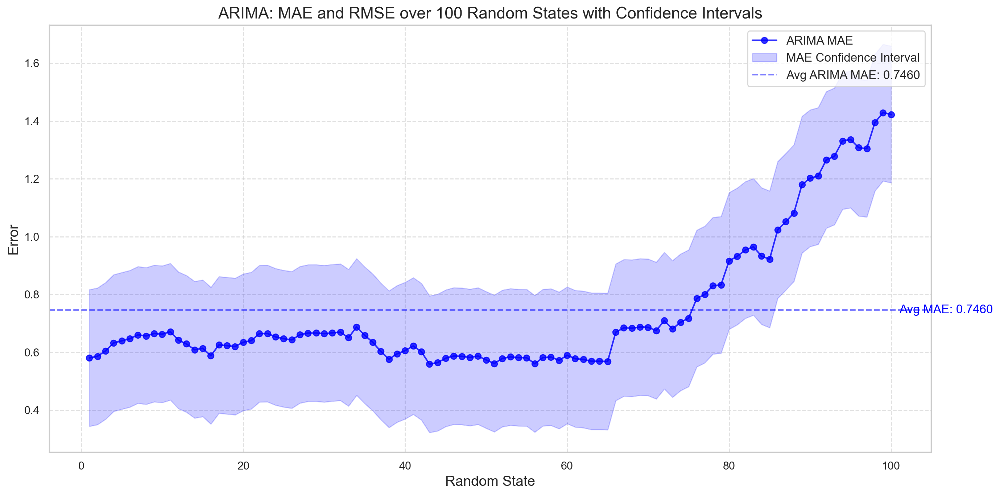

In [53]:

# Calculate and print average MAE and RMSE for the VAR model
avg_arima_mae = np.mean(arima_maes)
avg_arima_rmse = np.mean(arima_rmses)

print(f'VAR Average MAE: {avg_arima_mae}')
print(f'VAR Average RMSE: {avg_arima_rmse}')

# Calculate standard deviation for MAE and RMSE
std_arima_mae = np.std(arima_maes)
std_arima_rmse = np.std(arima_rmses)

# Plotting the MAEs and RMSEs with shaded confidence intervals
plt.figure(figsize=(14, 7))

# Plot VAR MAEs with shaded confidence interval
plt.plot(range(1, 101), arima_maes, label='ARIMA MAE', marker='o', linestyle='-', color='blue', alpha=0.8)
plt.fill_between(range(1, 101),
                 np.array(arima_maes) - std_arima_mae,
                 np.array(arima_maes) + std_arima_mae,
                 color='blue', alpha=0.2, label='MAE Confidence Interval')

# Add horizontal lines for average MAE and RMSE
plt.axhline(y=avg_arima_mae, color='blue', linestyle='--', alpha=0.5, label=f'Avg ARIMA MAE: {avg_arima_mae:.4f}')

# Add annotations for average values
plt.text(101, avg_arima_mae, f'Avg MAE: {avg_arima_mae:.4f}', color='blue', va='center', ha='left')

# Customize the plot
plt.title('ARIMA: MAE and RMSE over 100 Random States with Confidence Intervals', fontsize=16)
plt.xlabel('Random State', fontsize=14)
plt.ylabel('Error', fontsize=14)
plt.legend(fontsize=12, loc='upper right')
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# ***VAR***

In [55]:

# Directory to save CSV files
def train_and_evaluate_var_model(data, lag_order, test_size):
    """
    Trains and evaluates a VAR model on a given dataset.

    Args:
        data (pd.DataFrame): DataFrame with lagged time series data.
        lag_order (int): The lag order for the VAR model.

    Returns:
        tuple: MAE, RMSE, and forecasted CPI values.
    """

    train_df = data.iloc[:-test_size]
    test_df = data.iloc[-test_size:]

    # Fit the VAR model
    model = VAR(train_df)
    var_model = model.fit(lag_order)

    # Perform rolling forecasts
    predictions = []
    history = train_df.values.tolist()

    for i in range(len(test_df)):  # Ensure valid range
        input_data = np.array(history[-lag_order:])  # Use latest observed data
        forecast = var_model.forecast(input_data, steps=1)  # Forecast for `steps` ahead
        predictions.append(forecast[0])  # Store last step prediction
        history.append(test_df.iloc[i].values.tolist())  # Update with actual value

    # Convert predictions to DataFrame
    forecast_df = pd.DataFrame(predictions, columns=train_df.columns, index=test_df.index[:len(predictions)])

    # Extract actual and forecasted values for CPI
    actual_cpiauscl = test_df[target][:len(predictions)]
    forecasted_cpiauscl = forecast_df[target]

    # Compute evaluation metrics
    mae = mean_absolute_error(actual_cpiauscl, forecasted_cpiauscl)
    rmse = np.sqrt(mean_squared_error(actual_cpiauscl, forecasted_cpiauscl))
    return mae, rmse, forecasted_cpiauscl


In [57]:

# Perform robust testing with 50 random states
var_maes = []
var_rmses = []
var_all_forecasts = []

for i in range(100):
    # Read shuffled data from CSV file
    filename = f"{horizon_name}_rolling_data_norm_{i + 1}.csv"
    file_path = os.path.join(all_LagsHICP_Dir, filename)
    data = pd.read_csv(file_path, index_col=0, parse_dates=True).drop(columns="HICP")

    # Read shuffled data from CSV file
    # file_path = os.path.join(read_dir, f"random_data_{i+1}.csv")
    mae, rmse, forecasted_cpiauscl = train_and_evaluate_var_model(data, lag_order, test_size=test_size)
    var_maes.append(mae)
    var_rmses.append(rmse)
    var_all_forecasts.append(forecasted_cpiauscl)

# ... (rest of your code for calculating averages and plotting)

VAR Average MAE: 0.8410981342837528
VAR Average RMSE: 1.1122534049859518


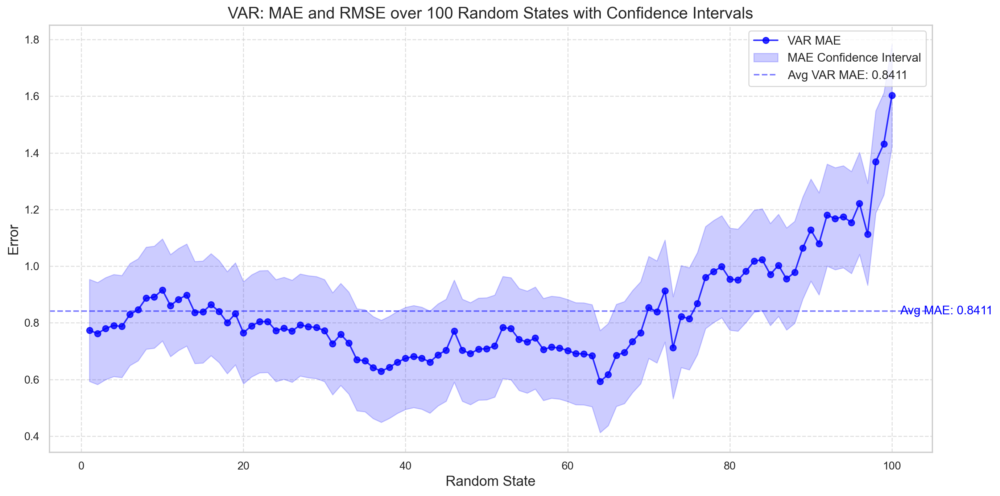

In [58]:

# Calculate and print average MAE and RMSE for the VAR model
avg_var_mae = np.mean(var_maes)
avg_var_rmse = np.mean(var_rmses)

print(f'VAR Average MAE: {avg_var_mae}')
print(f'VAR Average RMSE: {avg_var_rmse}')

# Calculate standard deviation for MAE and RMSE
std_var_mae = np.std(var_maes)
std_var_rmse = np.std(var_rmses)

# Plotting the MAEs and RMSEs with shaded confidence intervals
plt.figure(figsize=(14, 7))

# Plot VAR MAEs with shaded confidence interval
plt.plot(range(1, 101), var_maes, label='VAR MAE', marker='o', linestyle='-', color='blue', alpha=0.8)
plt.fill_between(range(1, 101),
                 np.array(var_maes) - std_var_mae,
                 np.array(var_maes) + std_var_mae,
                 color='blue', alpha=0.2, label='MAE Confidence Interval')

# Add horizontal lines for average MAE and RMSE
plt.axhline(y=avg_var_mae, color='blue', linestyle='--', alpha=0.5, label=f'Avg VAR MAE: {avg_var_mae:.4f}')

# Add annotations for average values
plt.text(101, avg_var_mae, f'Avg MAE: {avg_var_mae:.4f}', color='blue', va='center', ha='left')

# Customize the plot
plt.title('VAR: MAE and RMSE over 100 Random States with Confidence Intervals', fontsize=16)
plt.xlabel('Random State', fontsize=14)
plt.ylabel('Error', fontsize=14)
plt.legend(fontsize=12, loc='upper right')
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# ***SARIMA***

In [60]:

def train_and_evaluate_sarima_model(data, auto_arima_model_sarima, test_size, target_column=target):
    """
    Trains and evaluates a VAR model on a given dataset.

    Args:
        data (pd.DataFrame): DataFrame with lagged time series data.
        lag_order (int): The lag order for the VAR model.

    Returns:
        tuple: MAE, RMSE, and forecasted CPI values.
    """

    # Extract CPIAUCSL series for ARIMA
    train_df = data.iloc[:-test_size]
    test_df = data.iloc[-test_size:]

    train_cpi_arima = train_df[target_column]
    test_cpi_arima = test_df[target_column]

    # Ensure the index is datetime for proper date manipulation
    train_cpi_arima.index = pd.to_datetime(train_cpi_arima.index)

    # # Fit SARIMA model to initial training data
    # sarima_model = SARIMAX(train_cpi_arima,
    #                        order=auto_arima_model_sarima.order,
    #                        seasonal_order=auto_arima_model_sarima.seasonal_order)
    # sarima_model_fit = sarima_model.fit(disp=False)  # disp=False to suppress convergence output

    history = train_cpi_arima.tolist()
    predictions = []

    for i in range(len(test_cpi_arima)):
        # Forecast the next step
        # Refit the model with the updated training data
        sarima_model = SARIMAX(history,
                               order=auto_arima_model_sarima.order,
                               seasonal_order=auto_arima_model_sarima.seasonal_order, enforce_stationarity=False,
                               enforce_invertibility=False)
        sarima_model_fit = sarima_model.fit(disp=False)
        forecast = sarima_model_fit.forecast(steps=1)
        predictions.append(forecast[0])
        history.append(test_cpi_arima.iloc[i])  # Append actual value

    forecast_df = pd.DataFrame(predictions, index=test_cpi_arima.index, columns=[target_column])

    mae_sarima = mean_absolute_error(test_cpi_arima, forecast_df[target_column])
    rmse_sarima = np.sqrt(mean_squared_error(test_cpi_arima, forecast_df[target_column]))
    forecasted_cpi = forecast_df[target_column]

    return mae_sarima, rmse_sarima, forecasted_cpi


In [62]:


# Perform robust testing with 50 random states
sarima_maes = []
sarima_rmses = []
sarima_all_forecasts = []
horizon_name = f"dfHICP_L1"

for i in range(100):
    # Read shuffled data from CSV file
    # file_path = os.path.join(read_dir, f"random_data_{i+1}.csv")
    # random_data = pd.read_csv(file_path)

    filename = f"{horizon_name}_rolling_data_norm_{i+1}.csv"
    file_path = os.path.join(all_LagsHICP_Dir, filename)
    data = pd.read_csv(file_path, index_col=0, parse_dates=True).drop(columns="HICP")

    sample_size = len(data)
    test_size = int(sample_size * 0.2)


    # Create data DataFrame with selected columns
    # df = random_data.drop('HICP', axis=1)
    # data = shift_target_per_step(df, horizon=2)
    mae, rmse, forecasted_cpiauscl = train_and_evaluate_sarima_model(data, auto_arima_model_sarima, test_size, target_column=target)
    sarima_maes.append(mae)
    sarima_rmses.append(rmse)
    sarima_all_forecasts.append(forecasted_cpiauscl)

# ... (rest of your code for calculating averages and plotting)

SARIMA Average MAE: 0.6595296780712195
SARIMA Average RMSE: 0.9317762285298445


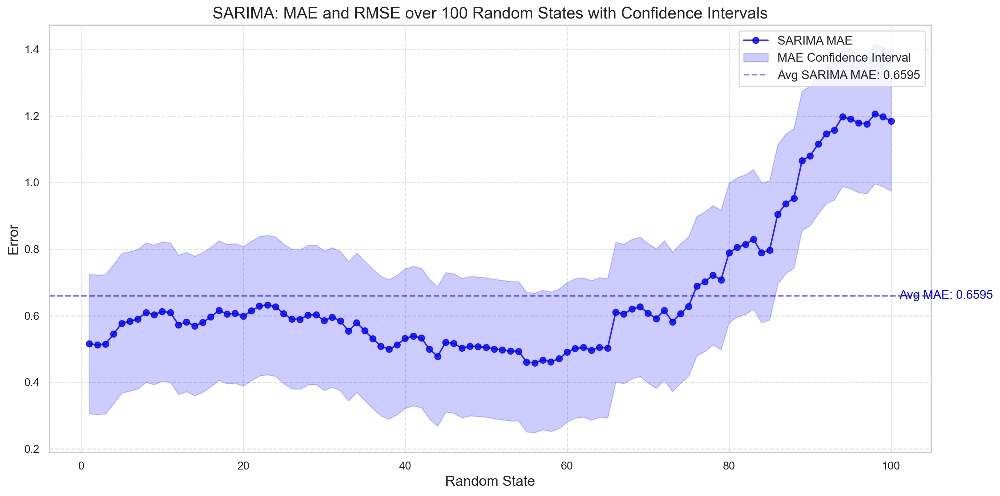

In [63]:

# Calculate and print average MAE and RMSE for the VAR model
avg_sarima_mae = np.mean(sarima_maes)
avg_sarima_rmse = np.mean(sarima_rmses)

print(f'SARIMA Average MAE: {avg_sarima_mae}')
print(f'SARIMA Average RMSE: {avg_sarima_rmse}')

# Calculate standard deviation for MAE and RMSE
std_sarima_mae = np.std(sarima_maes)
std_sarima_rmse = np.std(sarima_rmses)

# Plotting the MAEs and RMSEs with shaded confidence intervals
plt.figure(figsize=(14, 7))

# Plot VAR MAEs with shaded confidence interval
plt.plot(range(1, 101), sarima_maes, label='SARIMA MAE', marker='o', linestyle='-', color='blue', alpha=0.8)
plt.fill_between(range(1, 101),
                 np.array(sarima_maes) - std_sarima_mae,
                 np.array(sarima_maes) + std_sarima_mae,
                 color='blue', alpha=0.2, label='MAE Confidence Interval')

# Add horizontal lines for average MAE and RMSE
plt.axhline(y=avg_sarima_mae, color='blue', linestyle='--', alpha=0.5, label=f'Avg SARIMA MAE: {avg_sarima_mae:.4f}')

# Add annotations for average values
plt.text(101, avg_sarima_mae, f'Avg MAE: {avg_sarima_mae:.4f}', color='blue', va='center', ha='left')

# Customize the plot
plt.title('SARIMA: MAE and RMSE over 100 Random States with Confidence Intervals', fontsize=16)
plt.xlabel('Random State', fontsize=14)
plt.ylabel('Error', fontsize=14)
plt.legend(fontsize=12, loc='upper right')
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

 # ***CNN-LSTM***

In [65]:
def prep_data_for_cnn_r(data_l, test_size, target_col=target):
    data_x = data_l.copy()

    # Initialize scalers
    scaler_X = StandardScaler()
    scaler_y = StandardScaler()

    # Separate target and features
    y = data_x[[target_col]]
    X = data_x.drop(target_col, axis=1)

    # Scale the features and target
    X_scaled = scaler_X.fit_transform(X)
    y_scaled = scaler_y.fit_transform(y)

    # Convert back to DataFrame (preserving column names and index)
    X_scaled_df = pd.DataFrame(X_scaled, columns=X.columns, index=X.index)
    y_scaled_df = pd.DataFrame(y_scaled, columns=y.columns, index=y.index)

    # Concatenate scaled features and target
    data = pd.concat([X_scaled_df, y_scaled_df], axis=1)
    data_ls = data

    # Shift the target column to align with forecasting horizon
    # data[target_col] = data_x[target_col].shift(-forecast_horizon)

    # columns_to_lag = [col for col in data.columns if col != target_col] # All columns except target
    # columns_to_lag = [col for col in data.columns]
    # Create lagged features
    # data_ls = create_lag_features(data, columns_to_lag, lags=lags)
    # data_ls.dropna(inplace=True)

    # if test_size_percent:
    #     test_size = int(len(data_ls) * test_size)  # Convert percentage to absolute count

    train_df = data_ls.iloc[:-test_size]
    test_df = data_ls.iloc[-test_size:]

    X_train = train_df.drop(target_col, axis=1).values
    y_train = train_df[target_col].values
    X_test = test_df.drop(target_col, axis=1).values
    y_test = test_df[target_col].values

    X_train = X_train.reshape((X_train.shape[0], 1, 1, 1, X_train.shape[1]))
    X_test = X_test.reshape((X_test.shape[0], 1, 1, 1, X_test.shape[1]))

    return X_train, y_train, X_test, y_test, scaler_y, test_df.index
    # return data_ls, scaler_X, scaler_y


In [106]:

# Perform robust testing with 100 random states
cnn_maes = []
cnn_rmses = []
cnn_all_predictions = []


for i in range(100):
    # file_path = os.path.join(read_dir, f"random_data_{i+1}.csv")
    # shuffled_data = pd.read_csv(file_path).drop('HICP', axis=1)

    filename = f"{horizon_name}_rolling_data_norm_{i+1}.csv"
    file_path = os.path.join(all_LagsHICP_Dir, filename)
    data = pd.read_csv(file_path, index_col=0, parse_dates=True).drop(columns="HICP")
    sample_size = len(data)
    test_size = int(sample_size * 0.2)

    X_train, y_train, X_test, y_test, scaler_y, test_index = prep_data_for_cnn_r(data, test_size, target)
    model = build_model((X_train.shape[0], 1, 1, X_train.shape[-1]))
    loss, predictions = evaluate_model(model, X_test, y_test)

    y_test_actual = inverse_transform(scaler_y, y_test)
    predictions_actual = inverse_transform(scaler_y, predictions)

    mae = mean_absolute_error(y_test_actual, predictions_actual)
    rmse = np.sqrt(mean_squared_error(y_test_actual, predictions_actual))

    # main(data, scaler_y)
    cnn_maes.append(mae)
    cnn_rmses.append(rmse)
    cnn_all_predictions.append(predictions)

# Calculate and print average MAE and RMSE
avg_cnn_mae = np.mean(cnn_maes)
avg_cnn_rmse = np.mean(cnn_rmses)

print(f'Average MAE: {avg_cnn_mae}')
print(f'Average RMSE: {avg_cnn_rmse}')


Average MAE: 0.7666107714615703
Average RMSE: 1.0341956548736178


Average MAE: 0.7696258215946666
Average RMSE: 1.010885800493961

CNN-LSTM Average MAE: 0.7666107714615703
CNN-LSTM Average RMSE: 1.0341956548736178


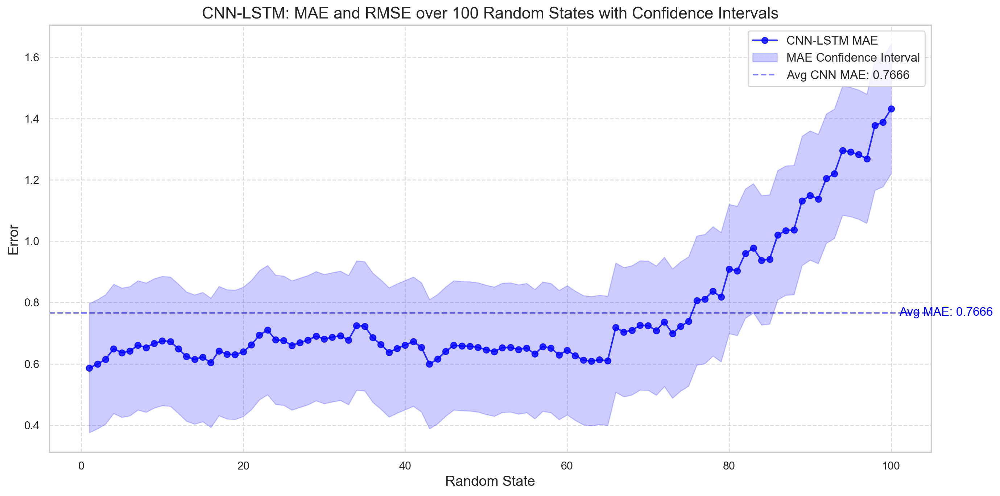

In [107]:

# Calculate and print average MAE and RMSE for the VAR model

print(f'CNN-LSTM Average MAE: {avg_cnn_mae}')
print(f'CNN-LSTM Average RMSE: {avg_cnn_rmse}')

# Calculate standard deviation for MAE and RMSE
std_cnn_mae = np.std(cnn_maes)
std_cnn_rmse = np.std(cnn_rmses)

# Plotting the MAEs and RMSEs with shaded confidence intervals
plt.figure(figsize=(14, 7))

# Plot VAR MAEs with shaded confidence interval
plt.plot(range(1, 101), cnn_maes, label='CNN-LSTM MAE', marker='o', linestyle='-', color='blue', alpha=0.8)
plt.fill_between(range(1, 101),
                 np.array(cnn_maes) - std_cnn_mae,
                 np.array(cnn_maes) + std_cnn_mae,
                 color='blue', alpha=0.2, label='MAE Confidence Interval')

# Add horizontal lines for average MAE and RMSE
plt.axhline(y=avg_cnn_mae, color='blue', linestyle='--', alpha=0.5, label=f'Avg CNN MAE: {avg_cnn_mae:.4f}')

# Add annotations for average values
plt.text(101, avg_cnn_mae, f'Avg MAE: {avg_cnn_mae:.4f}', color='blue', va='center', ha='left')

# Customize the plot
plt.title('CNN-LSTM: MAE and RMSE over 100 Random States with Confidence Intervals', fontsize=16)
plt.xlabel('Random State', fontsize=14)
plt.ylabel('Error', fontsize=14)
plt.legend(fontsize=12, loc='upper right')
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()




# CNN_VAE

In [68]:
def prep_data_cnn_vae(data_l, test_size, target_col=target):
    data_x = data_l.copy()

    # Initialize scalers
    # scaler_X = StandardScaler()
    scaler_y = StandardScaler()

    # Separate target and features
    y = data_x[[target_col]]
    X = data_x.drop(target_col, axis=1)

    # Scale the features and target
    # X_scaled = scaler_X.fit_transform(X)
    y_scaled = scaler_y.fit_transform(y)

    # Convert back to DataFrame (preserving column names and index)
    # X_scaled_df = pd.DataFrame(X_scaled, columns=X.columns, index=X.index)
    y_scaled_df = pd.DataFrame(y_scaled, columns=y.columns, index=y.index)

    # Concatenate scaled features and target
    data = pd.concat([X, y_scaled_df], axis=1)

    # Shift the target column to align with forecasting horizon
    # data[target_col] = data_x[target_col].shift(-forecast_horizon)

    # # columns_to_lag = [col for col in data.columns if col != target_col] # All columns except target
    # columns_to_lag = [col for col in data.columns]
    # # Create lagged features
    # data_ls = create_lag_features(data, columns_to_lag, lags=lags)
    # data_ls.dropna(inplace=True)

    # if test_size_percent:
    #     test_size = int(len(data_ls) * test_size)  # Convert percentage to absolute count

    train_df = data_ls.iloc[:-test_size]
    test_df = data_ls.iloc[-test_size:]

    X_train = train_df.drop(target_col, axis=1).values
    y_train = train_df[target_col].values
    X_test = test_df.drop(target_col, axis=1).values
    y_test = test_df[target_col].values

    X_train = X_train.reshape((X_train.shape[0], 1, 1, 1, X_train.shape[1]))
    X_test = X_test.reshape((X_test.shape[0], 1, 1, 1, X_test.shape[1]))

    return X_train, y_train, X_test, y_test, scaler_y, test_df.index
    # return data_ls, scaler_X, scaler_y



In [69]:
# filename = f"{horizon_name}_rolling_data_norm_1.csv"
# file_path = os.path.join(all_LagsCPI_Dir, filename)
# data = pd.read_csv(file_path, index_col=0, parse_dates=True)
#
# data_comp = prepare_vae_data(data)
#
#
# print(data_comp.head())
# print(data_comp.tail())

In [70]:
# X_train, y_train, X_test, y_test, scaler_y, test_index = prep_data_cnn_vae(data_comp, test_size, 'CPI')


In [71]:
# model1 = build_model((1, 1, 1, X_train.shape[-1]))


In [72]:
# Perform robust testing with 100 random states
cnn_vae_maes = []
cnn_vae_rmses = []
cnn_vae_all_predictions = []

# model = build_model(1, 1, 1, X_train.shape[-1])

for i in range(100):
    # file_path = os.path.join(read_dir, f"random_data_{i+1}.csv")
    # shuffled_data = pd.read_csv(file_path)
    filename = f"{horizon_name}_rolling_data_norm_{i+1}.csv"
    file_path = os.path.join(all_LagsHICP_Dir, filename)
    data = pd.read_csv(file_path, index_col=0, parse_dates=True).drop(columns="HICP")

    sample_size = len(data)
    test_size = int(sample_size * 0.2)

    data_comp = prepare_vae_data(data)

    X_train, y_train, X_test, y_test, scaler_y, test_index = prep_data_cnn_vae(data_comp, test_size, target)
    model = build_model((X_train.shape[0], 1, 1, X_train.shape[-1]))
    loss, predictions = evaluate_model(model, X_test, y_test)

    y_test_actual = inverse_transform(scaler_y, y_test)
    predictions_actual = inverse_transform(scaler_y, predictions)

    mae = mean_absolute_error(y_test_actual, predictions_actual)
    rmse = np.sqrt(mean_squared_error(y_test_actual, predictions_actual))

    # main(data, scaler_y)
    cnn_vae_maes.append(mae)
    cnn_vae_rmses.append(rmse)
    cnn_vae_all_predictions.append(predictions)

# Calculate and print average MAE and RMSE
avg_cnn_vae_mae = np.mean(cnn_vae_maes)
avg_cnn_vae_rmse = np.mean(cnn_vae_rmses)




Epoch 1/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - kl_loss: 2.5397 - loss: 41.1989 - reconstruction_loss: 38.6592
Epoch 2/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - kl_loss: 2.3267 - loss: 36.7791 - reconstruction_loss: 34.4524
Epoch 3/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 713us/step - kl_loss: 2.0437 - loss: 29.9963 - reconstruction_loss: 27.9526
Epoch 4/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 782us/step - kl_loss: 2.2209 - loss: 29.0869 - reconstruction_loss: 26.8660
Epoch 5/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 631us/step - kl_loss: 2.4416 - loss: 26.9705 - reconstruction_loss: 24.5288
Epoch 6/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - kl_loss: 2.6978 - loss: 24.8470 - reconstruction_loss: 22.1492
Epoch 7/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 974us/step - kl_loss: 2.8517 - loss: 23.2241 - reconstruction_loss: 20.3724
Epoch 8/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - kl_loss: 2.9021 - loss: 23.3067 - reconstruction_loss: 20.4046
Epoch 9/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 748us/step - kl_loss: 3.0131 - loss: 23.827

In [73]:
print(f'Average MAE: {avg_cnn_vae_mae}')
print(f'Average RMSE: {avg_cnn_vae_rmse}')

Average MAE: 0.4834472037289188
Average RMSE: 0.5884032873441271


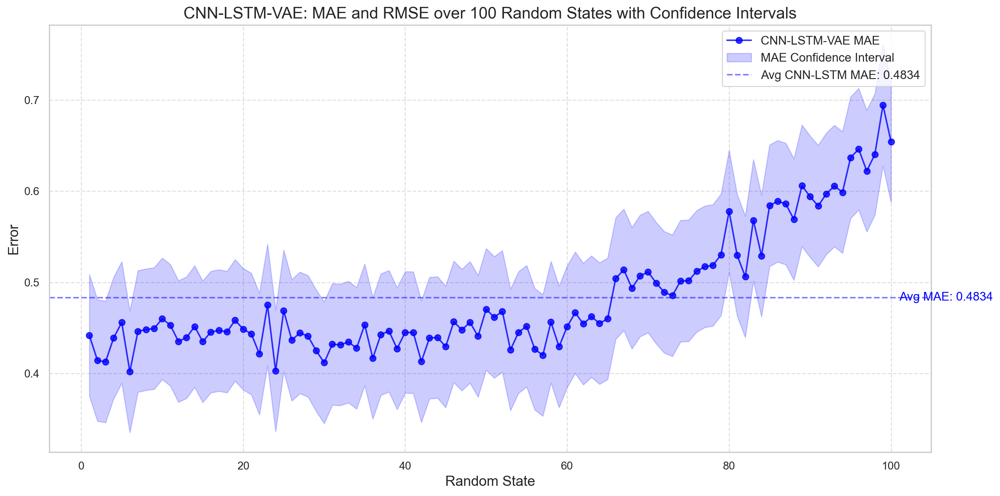

In [74]:

# Calculate standard deviation for MAE and RMSE
std_cnn_vae_mae = np.std(cnn_vae_maes)
std_cnn_vae_rmse = np.std(cnn_vae_rmses)

# Plotting the MAEs and RMSEs with shaded confidence intervals
plt.figure(figsize=(14, 7))

# Plot VAR MAEs with shaded confidence interval
plt.plot(range(1, 101), cnn_vae_maes, label='CNN-LSTM-VAE MAE', marker='o', linestyle='-', color='blue', alpha=0.8)
plt.fill_between(range(1, 101),
                 np.array(cnn_vae_maes) - std_cnn_vae_mae,
                 np.array(cnn_vae_maes) + std_cnn_vae_mae,
                 color='blue', alpha=0.2, label='MAE Confidence Interval')

# Add horizontal lines for average MAE and RMSE
plt.axhline(y=avg_cnn_vae_mae, color='blue', linestyle='--', alpha=0.5, label=f'Avg CNN-LSTM MAE: {avg_cnn_vae_mae:.4f}')
# plt.axhline(y=avg_var_rmse, color='green', linestyle='--', alpha=0.5, label=f'Avg VAR RMSE: {avg_var_rmse:.2f}')

# Add annotations for average values
plt.text(101, avg_cnn_vae_mae, f'Avg MAE: {avg_cnn_vae_mae:.4f}', color='blue', va='center', ha='left')
# plt.text(101, avg_var_rmse, f'Avg RMSE: {avg_var_rmse:.2f}', color='green', va='center', ha='left')

# Customize the plot
plt.title('CNN-LSTM-VAE: MAE and RMSE over 100 Random States with Confidence Intervals', fontsize=16)
plt.xlabel('Random State', fontsize=14)
plt.ylabel('Error', fontsize=14)
plt.legend(fontsize=12, loc='upper right')
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# ***CNN-LSTM + Variable Selection***

In [75]:

def prep_data_for_cnn_var_sel(data_l, target_col=target, forecast_horizon=1, lags=3, test_size=test_size, test_size_percent=False):

    # Variable selection
    data_x = data_l.copy()

    # Initialize scalers
    scaler_X = StandardScaler()
    scaler_y = StandardScaler()

    # Separate target and features
    y = data_x[[target_col]]
    X = data_x.drop(target_col, axis=1)

    # Scale the features and target
    X_scaled = scaler_X.fit_transform(X)
    y_scaled = scaler_y.fit_transform(y)

    # Convert back to DataFrame (preserving column names and index)
    X_scaled_df = pd.DataFrame(X_scaled, columns=X.columns, index=X.index)
    y_scaled_df = pd.DataFrame(y_scaled, columns=y.columns, index=y.index)

    # Concatenate scaled features and target
    data = pd.concat([X_scaled_df, y_scaled_df], axis=1)

    # Shift the target column to align with forecasting horizon
    # data[target_col] = data_x[target_col].shift(-forecast_horizon)
    # columns_to_lag = [col for col in data.columns if col != target_col] # All columns except target

    # columns_to_lag = [col for col in data.columns]
    # # Create lagged features
    # data_l = create_lag_features(data, columns_to_lag, lags=lags)
    # data_l.dropna(inplace=True)

    data_ls = data_l[top_influential_variables]

    if test_size_percent:
        test_size = int(len(data_ls) * test_size)  # Convert percentage to absolute count

    train_df = data_ls.iloc[:-test_size]
    test_df = data_ls.iloc[-test_size:]

    X_train = train_df.drop(target_col, axis=1).values
    y_train = train_df[target_col].values
    X_test = test_df.drop(target_col, axis=1).values
    y_test = test_df[target_col].values

    X_train = X_train.reshape((X_train.shape[0], 1, 1, 1, X_train.shape[1]))
    X_test = X_test.reshape((X_test.shape[0], 1, 1, 1, X_test.shape[1]))

    return X_train, y_train, X_test, y_test, scaler_y, test_df.index
    # return data_ls, scaler_X, scaler_y


In [76]:
cnn_sel_maes = []
cnn_sel_rmses = []
cnn_sel_all_predictions = []

for i in range(100):

    filename = f"{horizon_name}_rolling_data_norm_{i+1}.csv"
    file_path = os.path.join(all_LagsHICP_Dir, filename)
    data = pd.read_csv(file_path, index_col=0, parse_dates=True).drop(columns="HICP")


    X_train, y_train, X_test, y_test, scaler_y, test_index = prep_data_for_cnn_var_sel(data, target, test_size=test_size)
    model = build_model((1, 1, 1, X_train.shape[-1]))
    loss, predictions = evaluate_model(model, X_test, y_test)

    y_test_actual = inverse_transform(scaler_y, y_test)
    predictions_actual = inverse_transform(scaler_y, predictions)

    mae = mean_absolute_error(y_test_actual, predictions_actual)
    rmse = np.sqrt(mean_squared_error(y_test_actual, predictions_actual))

    # main(data, scaler_y)
    cnn_sel_maes.append(mae)
    cnn_sel_rmses.append(rmse)
    cnn_sel_all_predictions.append(predictions)



In [77]:
# Calculate and print average MAE and RMSE
cnn_sel_avg_mae = np.mean(cnn_sel_maes)
cnn_sel_avg_rmse = np.mean(cnn_sel_rmses)
print(f'CNN+VS Average MAE: {cnn_sel_avg_mae}')
print(f'CNN+VS Average RMSE: {cnn_sel_avg_rmse}')

CNN+VS Average MAE: 0.6510814471911242
CNN+VS Average RMSE: 0.8844694343794334


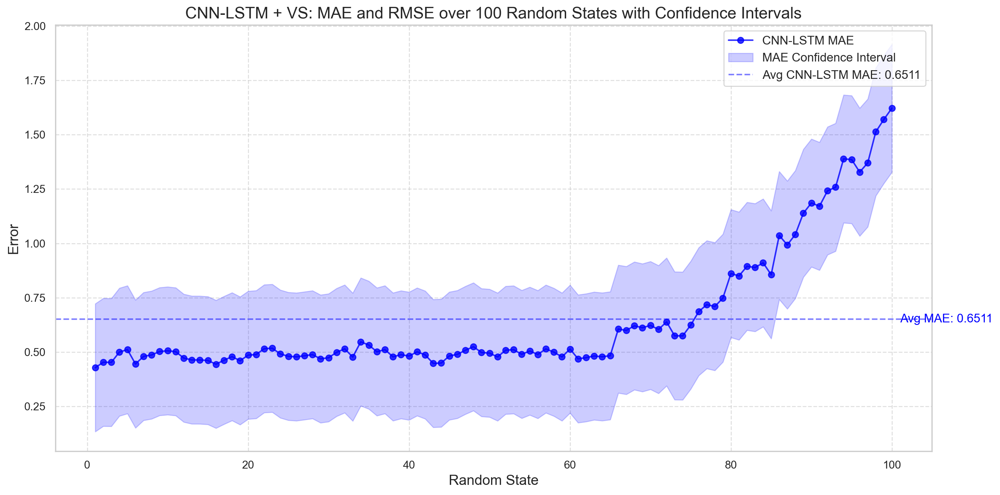

CNN+VS Average MAE: 0.6510814471911242
CNN+VS Average RMSE: 0.8844694343794334


In [78]:

# Calculate standard deviation for MAE and RMSE
std_cnn_sel_mae = np.std(cnn_sel_maes)
std_cnn_sel_rmse = np.std(cnn_sel_rmses)

# Plotting the MAEs and RMSEs with shaded confidence intervals
plt.figure(figsize=(14, 7))

# Plot VAR MAEs with shaded confidence interval
plt.plot(range(1, 101), cnn_sel_maes, label='CNN-LSTM MAE', marker='o', linestyle='-', color='blue', alpha=0.8)
plt.fill_between(range(1, 101),
                 np.array(cnn_sel_maes) - std_cnn_sel_mae,
                 np.array(cnn_sel_maes) + std_cnn_sel_mae,
                 color='blue', alpha=0.2, label='MAE Confidence Interval')

# Add horizontal lines for average MAE and RMSE
plt.axhline(y=cnn_sel_avg_mae, color='blue', linestyle='--', alpha=0.5, label=f'Avg CNN-LSTM MAE: {cnn_sel_avg_mae:.4f}')
# plt.axhline(y=avg_var_rmse, color='green', linestyle='--', alpha=0.5, label=f'Avg VAR RMSE: {avg_var_rmse:.2f}')

# Add annotations for average values
plt.text(101, cnn_sel_avg_mae, f'Avg MAE: {cnn_sel_avg_mae:.4f}', color='blue', va='center', ha='left')
# plt.text(101, avg_var_rmse, f'Avg RMSE: {avg_var_rmse:.2f}', color='green', va='center', ha='left')

# Customize the plot
plt.title('CNN-LSTM + VS: MAE and RMSE over 100 Random States with Confidence Intervals', fontsize=16)
plt.xlabel('Random State', fontsize=14)
plt.ylabel('Error', fontsize=14)
plt.legend(fontsize=12, loc='upper right')
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

print(f'CNN+VS Average MAE: {cnn_sel_avg_mae}')
print(f'CNN+VS Average RMSE: {cnn_sel_avg_rmse}')


# NEW CNN-LSTM

In [ ]:
cnn_new_maes = []
cnn_new_rmses = []
cnn_new_all_predictions = []

for i in range(100):

    filename = f"{horizon_name}_rolling_data_norm_{i+1}.csv"
    file_path = os.path.join(all_LagsHICP_Dir, filename)
    data = pd.read_csv(file_path, index_col=0, parse_dates=True).drop(columns="HICP")


    X_train, y_train, X_test, y_test, scaler_y, test_index = prep_data_for_cnn_var_sel(data, target, test_size=test_size)
    model = build_model((1, 1, 1, X_train.shape[-1]))
    loss, predictions = evaluate_model(model, X_test, y_test)

    y_test_actual = inverse_transform(scaler_y, y_test)
    predictions_actual = inverse_transform(scaler_y, predictions)

    mae = mean_absolute_error(y_test_actual, predictions_actual)
    rmse = np.sqrt(mean_squared_error(y_test_actual, predictions_actual))

    # main(data, scaler_y)
    cnn_sel_maes.append(mae)
    cnn_sel_rmses.append(rmse)
    cnn_sel_all_predictions.append(predictions)



In [ ]:
model, X_train, X_test, cnn_mae, cnn_rmse = cnn_lstm_model_1(data_ls, scaler_y, test_size=test_size, look_back=12)


In [81]:
# avg_sarima_mae = np.mean(var_maes)
# avg_sarima_rmse = np.mean(var_rmses)
print(f'CNN-LSTM + VAE Average MAE: {avg_cnn_vae_mae}')
print(f'CNN-LSTM + VAE Average RMSE: {avg_cnn_vae_rmse}')
print(f'CNN-LSTM + VS Average MAE: {cnn_sel_avg_mae}')
print(f'CNN-LSTM + VS Selection Average RMSE: {cnn_sel_avg_rmse}')
print(f'CNN-LSTM Average MAE: {avg_cnn_mae}')
print(f'CNN-LSTM Average RMSE: {avg_cnn_rmse}')
print(f'ARIMA Average MAE: {avg_arima_mae}')
print(f'ARIMA Average RMSE: {avg_arima_rmse}')
print(f'VAR Average MAE: {avg_var_mae}')
print(f'VAR Average RMSE: {avg_var_rmse}')
print(f'SARIMA Average MAE: {avg_sarima_mae}')
print(f'SARIMA Average RMSE: {avg_sarima_rmse}')

# print(f'Average RMSE: {avg_sarima_rmse}')


CNN-LSTM + VAE Average MAE: 0.4834472037289188
CNN-LSTM + VAE Average RMSE: 0.5884032873441271
CNN-LSTM + VS Average MAE: 0.6510814471911242
CNN-LSTM + VS Selection Average RMSE: 0.8844694343794334
CNN-LSTM Average MAE: 0.7716346086368081
CNN-LSTM Average RMSE: 1.0372559540283055
ARIMA Average MAE: 0.7460256308991967
ARIMA Average RMSE: 1.0108396976208913
VAR Average MAE: 0.8410981342837528
VAR Average RMSE: 1.1122534049859518
SARIMA Average MAE: 0.6595296780712195
SARIMA Average RMSE: 0.9317762285298445


CNN-LSTM + VAE Average MAE: 0.5393014362022318
CNN-LSTM + VAE Average RMSE: 0.6787154713028031
CNN-LSTM + VAR Selection Average MAE: 0.7658127914870214
CNN-LSTM + VAR Selection Average RMSE: 1.0100588830617963
CNN-LSTM Average MAE: 0.7659900972401679
CNN-LSTM Average RMSE: 1.0100522966124255
ARIMA Average MAE: 0.7809771728748376
ARIMA Average RMSE: 1.022385917431453
VAR Average MAE: 0.9573785345932904
VAR Average RMSE: 1.217397658046333
SARIMA Average MAE: 0.7797789243994218
SARIMA Average RMSE: 1.0196980215715252

# ***SUMMARY STATISTICS***

In [80]:

# Create a DataFrame for error metrics
error_df = pd.DataFrame({
    'Model': ['CNN-LSTM', 'CNN-LSTM-VAE', 'SARIMA', 'VAR', 'ARIMA'],
    'Mean MAE': [np.mean(cnn_maes), np.mean(cnn_vae_maes), np.mean(sarima_maes), np.mean(var_maes), np.mean(arima_maes)],
    'Median MAE': [np.median(cnn_maes), np.median(cnn_vae_maes), np.median(sarima_maes), np.median(var_maes), np.median(arima_maes)],
    'Std Dev MAE': [np.std(cnn_maes), np.std(cnn_vae_maes), np.std(sarima_maes), np.std(var_maes), np.std(arima_maes)],
    'Mean RMSE': [np.mean(cnn_rmses), np.mean(cnn_vae_rmses), np.mean(sarima_rmses), np.mean(var_rmses), np.mean(arima_rmses)],
    'Median RMSE': [np.median(cnn_rmses), np.mean(cnn_vae_rmses), np.median(sarima_rmses), np.median(var_rmses), np.median(arima_rmses)],
    'Std Dev RMSE': [np.std(cnn_rmses), np.mean(cnn_vae_rmses), np.std(sarima_rmses), np.std(var_rmses), np.std(arima_rmses)]
})

# Print summary table
print(error_df)


          Model  Mean MAE  Median MAE  Std Dev MAE  Mean RMSE  Median RMSE  \
0      CNN-LSTM  0.771635    0.678466     0.209979   1.037256     0.852375   
1  CNN-LSTM-VAE  0.483447    0.454725     0.066633   0.588403     0.588403   
2        SARIMA  0.659530    0.593198     0.209419   0.931776     0.749541   
3           VAR  0.841098    0.786927     0.180082   1.112253     1.061254   
4         ARIMA  0.746026    0.655252     0.236296   1.010840     0.808135   

   Std Dev RMSE  
0      0.337543  
1      0.588403  
2      0.353588  
3      0.236201  
4      0.369408  


In [85]:
# Compare performance at each step
conv_lstm_vae_errors = np.array(cnn_vae_all_predictions).reshape(100, test_size)  # Reshape to (100, 12)
conv_lstm_sel_step_errors = np.array(cnn_sel_all_predictions).reshape(100, test_size)  # Reshape to (100, 12)
conv_lstm_step_errors = np.array(cnn_all_predictions).reshape(100, test_size)
sarima_step_errors = np.array(sarima_all_forecasts).reshape(100, test_size)
arima_step_errors = np.array(arima_all_forecasts).reshape(100, test_size)  # Reshape to (100, 12)
var_step_errors = np.array(var_all_forecasts).reshape(100, test_size)

# Calculate standard deviation for each step
conv_lstm_vae_step_std = np.std(np.abs(conv_lstm_vae_errors), axis=0)
conv_lstm_sel_step_std = np.std(np.abs(conv_lstm_sel_step_errors), axis=0)
conv_lstm_step_std = np.std(np.abs(conv_lstm_step_errors), axis=0)  # Standard deviation across 100 runs
sarima_step_std = np.std(np.abs(sarima_step_errors), axis=0)
arima_step_std = np.std(np.abs(arima_step_errors), axis=0)  # Standard deviation across 100 runs
var_step_std = np.std(np.abs(var_step_errors), axis=0)

# Calculate mean absolute error for each step
conv_lstm_vae_step_mae = np.mean(np.abs(conv_lstm_vae_errors), axis=0)  # Average across 100 runs
conv_lstm_sel_step_mae = np.mean(np.abs(conv_lstm_sel_step_errors), axis=0)
conv_lstm_step_mae = np.mean(np.abs(conv_lstm_step_errors), axis=0)  # Average across 100 runs
sarima_step_mae = np.mean(np.abs(sarima_step_errors), axis=0)
arima_step_mae = np.mean(np.abs(arima_step_errors), axis=0)  # Average across 100 runs
var_step_mae = np.mean(np.abs(var_step_errors), axis=0)


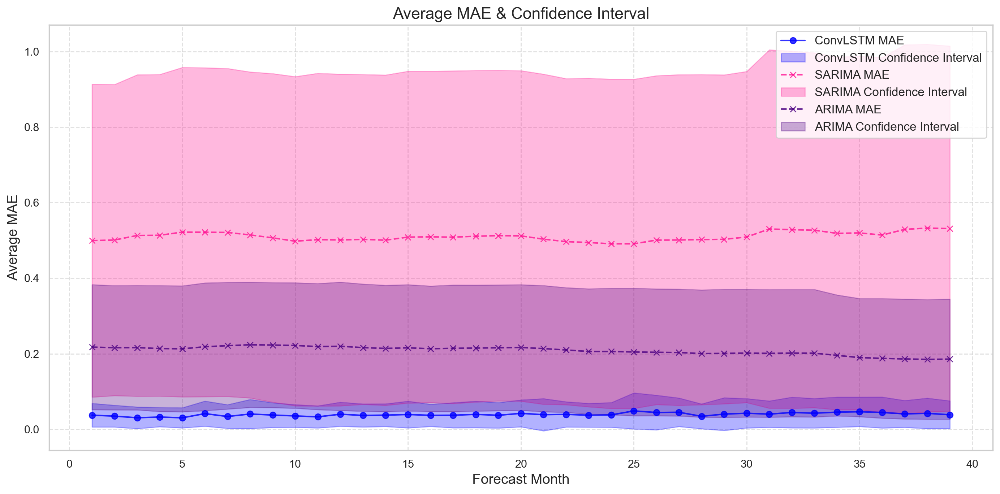

In [87]:


# Plotting
plt.figure(figsize=(14, 7))

# Plot ConvLSTM MAE with shaded confidence interval
# plt.plot(range(1, 25), var_step_mae, label='VAR', marker='o', linestyle='-', color='green', alpha=0.8)

# plt.plot(range(1, 25), conv_lstm_sel_step_mae, label='ConvLSTM + Var Sel MAE', marker='o', linestyle='-', color='blue', alpha=0.8)
# plt.fill_between(range(1, 25),
#                  conv_lstm_sel_step_mae - conv_lstm_sel_step_std,
#                  conv_lstm_sel_step_mae + conv_lstm_sel_step_std,
#                  color='gray', alpha=0.2, label='ConvLSTM Confidence Interval')

# Plot ConvLSTM MAE with shaded confidence interval
plt.plot(range(1, test_size+1), conv_lstm_step_mae, label='ConvLSTM MAE', marker='o', linestyle='-', color='blue', alpha=0.8)
plt.fill_between(range(1, test_size+1),
                 conv_lstm_step_mae - conv_lstm_step_std,
                 conv_lstm_step_mae + conv_lstm_step_std,
                 color='blue', alpha=0.3, label='ConvLSTM Confidence Interval')

# Plot SARIMA MAE with shaded confidence interval
plt.plot(range(1, test_size+1), sarima_step_mae, label='SARIMA MAE', marker='x', linestyle='--', color='deeppink', alpha=0.8)
plt.fill_between(range(1, test_size+1),
                 sarima_step_mae - sarima_step_std,
                 sarima_step_mae + sarima_step_std,
                 color='deeppink', alpha=0.3, label='SARIMA Confidence Interval')

# Plot ARIMA MAE with shaded confidence interval
plt.plot(range(1, test_size+1), arima_step_mae, label='ARIMA MAE', marker='x', linestyle='--', color='indigo', alpha=0.8)
plt.fill_between(range(1, test_size+1),
                 arima_step_mae - arima_step_std,
                 arima_step_mae + arima_step_std,
                 color='indigo', alpha=0.3, label='ARIMA Confidence Interval')

# Customize the plot
plt.title('Average MAE & Confidence Interval', fontsize=16)
plt.xlabel('Forecast Month', fontsize=14)
plt.ylabel('Average MAE', fontsize=14)
plt.legend(fontsize=12, loc='upper right')
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()



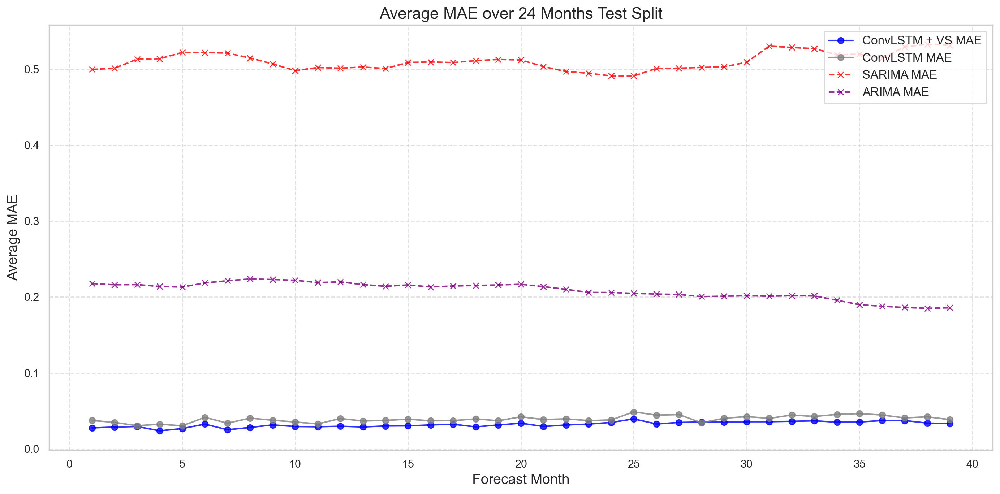

In [90]:


# Plotting
plt.figure(figsize=(14, 7))

# Plot ConvLSTM MAE with shaded confidence interval

# plt.plot(range(1, test_size+1), var_step_mae, label='ConvLSTM + VS MAE', marker='o', linestyle='-', color='green', alpha=0.8)

plt.plot(range(1, test_size+1), conv_lstm_sel_step_mae, label='ConvLSTM + VS MAE', marker='o', linestyle='-', color='blue', alpha=0.8)
# plt.fill_between(range(1, 25),
#                  conv_lstm_sel_step_mae - conv_lstm_sel_step_std,
#                  conv_lstm_sel_step_mae + conv_lstm_sel_step_std,
#                  color='gray', alpha=0.2, label='ConvLSTM Confidence Interval')

# Plot ConvLSTM MAE with shaded confidence interval
plt.plot(range(1, test_size+1), conv_lstm_step_mae, label='ConvLSTM MAE', marker='o', linestyle='-', color='gray', alpha=0.8)
# plt.fill_between(range(1, 25),
#                  conv_lstm_step_mae - conv_lstm_step_std,
#                  conv_lstm_step_mae + conv_lstm_step_std,
#                  color='blue', alpha=0.2, label='ConvLSTM Confidence Interval')

# Plot SARIMA MAE with shaded confidence interval
plt.plot(range(1, test_size+1), sarima_step_mae, label='SARIMA MAE', marker='x', linestyle='--', color='red', alpha=0.8)
# plt.fill_between(range(1, 25),
#                  sarima_step_mae - sarima_step_std,
#                  sarima_step_mae + sarima_step_std,
#                  color='red', alpha=0.2, label='SARIMA Confidence Interval')

# Plot ARIMA MAE with shaded confidence interval
plt.plot(range(1, test_size+1), arima_step_mae, label='ARIMA MAE', marker='x', linestyle='--', color='purple', alpha=0.8)
# plt.fill_between(range(1, 25),
#                  arima_step_mae - arima_step_std,
#                  arima_step_mae + arima_step_std,
#                  color='purple', alpha=0.2, label='ARIMA Confidence Interval')

# Customize the plot
plt.title('Average MAE over 24 Months Test Split', fontsize=16)
plt.xlabel('Forecast Month', fontsize=14)
plt.ylabel('Average MAE', fontsize=14)
plt.legend(fontsize=12, loc='upper right')
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()



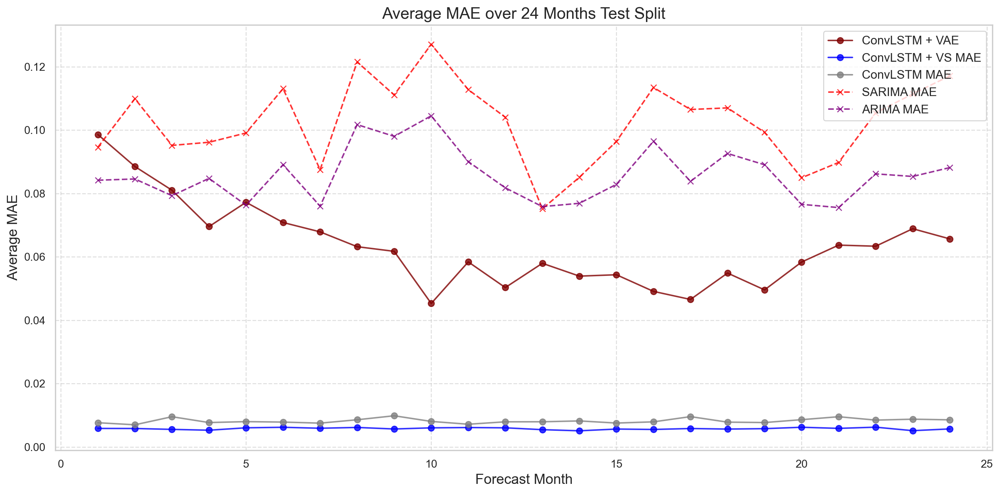

In [273]:


# Plotting
plt.figure(figsize=(14, 7))

# Plot ConvLSTM MAE with shaded confidence interval

# plt.plot(range(1, 25), var_step_mae, label='ConvLSTM + VS MAE', marker='o', linestyle='-', color='green', alpha=0.8)
plt.plot(range(1, 25), conv_lstm_vae_step_mae, label='ConvLSTM + VAE', marker='o', linestyle='-', color='maroon', alpha=0.8)
# plt.fill_between(range(1, 25),
#                  conv_lstm_sel_step_mae - conv_lstm_sel_step_std,
#                  conv_lstm_sel_step_mae + conv_lstm_sel_step_std,
#                  color='gray', alpha=0.2, label='ConvLSTM Confidence Interval')

plt.plot(range(1, 25), conv_lstm_sel_step_mae, label='ConvLSTM + VS MAE', marker='o', linestyle='-', color='blue', alpha=0.8)
# plt.fill_between(range(1, 25),
#                  conv_lstm_sel_step_mae - conv_lstm_sel_step_std,
#                  conv_lstm_sel_step_mae + conv_lstm_sel_step_std,
#                  color='gray', alpha=0.2, label='ConvLSTM Confidence Interval')

# Plot ConvLSTM MAE with shaded confidence interval
plt.plot(range(1, 25), conv_lstm_step_mae, label='ConvLSTM MAE', marker='o', linestyle='-', color='gray', alpha=0.8)
# plt.fill_between(range(1, 25),
#                  conv_lstm_step_mae - conv_lstm_step_std,
#                  conv_lstm_step_mae + conv_lstm_step_std,
#                  color='blue', alpha=0.2, label='ConvLSTM Confidence Interval')

# Plot SARIMA MAE with shaded confidence interval
plt.plot(range(1, 25), sarima_step_mae, label='SARIMA MAE', marker='x', linestyle='--', color='red', alpha=0.8)
# plt.fill_between(range(1, 25),
#                  sarima_step_mae - sarima_step_std,
#                  sarima_step_mae + sarima_step_std,
#                  color='red', alpha=0.2, label='SARIMA Confidence Interval')

# Plot ARIMA MAE with shaded confidence interval
plt.plot(range(1, 25), arima_step_mae, label='ARIMA MAE', marker='x', linestyle='--', color='purple', alpha=0.8)
# plt.fill_between(range(1, 25),
#                  arima_step_mae - arima_step_std,
#                  arima_step_mae + arima_step_std,
#                  color='purple', alpha=0.2, label='ARIMA Confidence Interval')

# Customize the plot
plt.title('Average MAE over 24 Months Test Split', fontsize=16)
plt.xlabel('Forecast Month', fontsize=14)
plt.ylabel('Average MAE', fontsize=14)
plt.legend(fontsize=12, loc='upper right')
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()



In [157]:
# Compare performance at each step
conv_lstm_sel_step_errors = np.array(cnn_sel_all_predictions).reshape(100, 24)  # Reshape to (100, 12)
conv_lstm_step_errors = np.array(cnn_all_predictions).reshape(100, 24)

# Calculate standard deviation for each step
conv_lstm_sel_step_std = np.std(np.abs(conv_lstm_sel_step_errors), axis=0)
conv_lstm_step_std = np.std(np.abs(conv_lstm_step_errors), axis=0)  # Standard deviation across 100 runs

# Calculate mean absolute error for each step
conv_lstm_sel_step_mae = np.mean(np.abs(conv_lstm_sel_step_errors), axis=0)
conv_lstm_step_mae = np.mean(np.abs(conv_lstm_step_errors), axis=0)  # Average across 100 runs


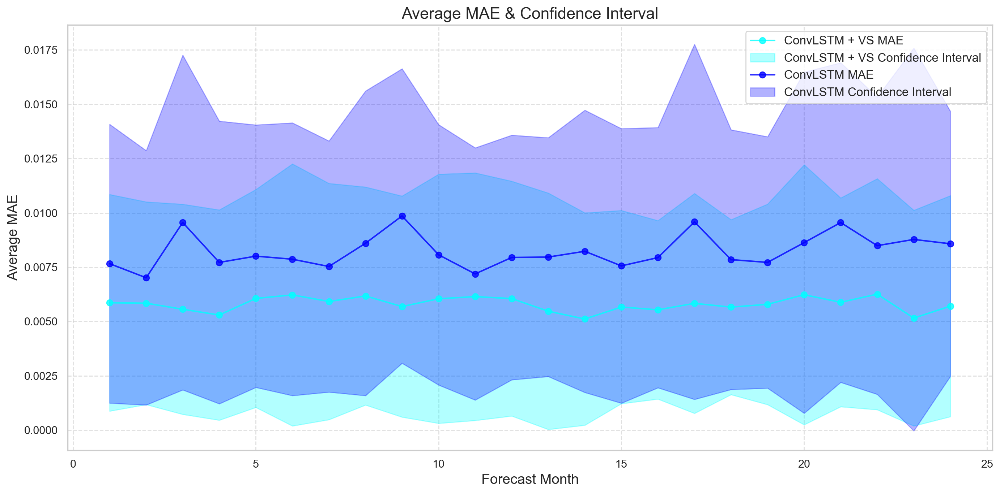

In [158]:


# Plotting
plt.figure(figsize=(14, 7))

# Plot ConvLSTM + Variable Selection MAE with shaded confidence interval
plt.plot(range(1, 25), conv_lstm_sel_step_mae, label='ConvLSTM + VS MAE', marker='o', linestyle='-', color='cyan', alpha=0.8)
plt.fill_between(range(1, 25),
                 conv_lstm_sel_step_mae - conv_lstm_sel_step_std,
                 conv_lstm_sel_step_mae + conv_lstm_sel_step_std,
                 color='cyan', alpha=0.3, label='ConvLSTM + VS Confidence Interval')

# Plot ConvLSTM MAE with shaded confidence interval
plt.plot(range(1, 25), conv_lstm_step_mae, label='ConvLSTM MAE', marker='o', linestyle='-', color='blue', alpha=0.8)
plt.fill_between(range(1, 25),
                 conv_lstm_step_mae - conv_lstm_step_std,
                 conv_lstm_step_mae + conv_lstm_step_std,
                 color='blue', alpha=0.3, label='ConvLSTM Confidence Interval')

# Customize the plot
plt.title('Average MAE & Confidence Interval', fontsize=16)
plt.xlabel('Forecast Month', fontsize=14)
plt.ylabel('Average MAE', fontsize=14)
plt.legend(fontsize=12, loc='upper right')
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()



/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before opera

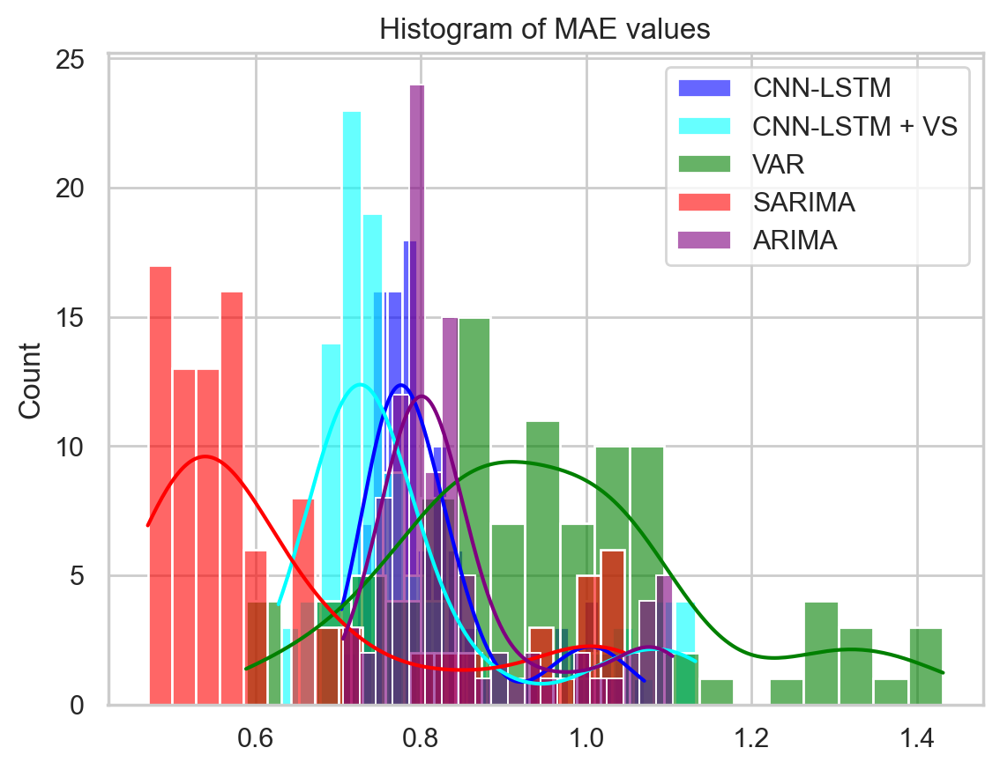

In [91]:
sns.histplot(cnn_maes, kde=True, bins=20, label="CNN-LSTM", color="blue", alpha=0.6)
sns.histplot(cnn_sel_maes, kde=True, bins=20, label="CNN-LSTM + VS", color="cyan", alpha=0.6)
sns.histplot(var_maes, kde=True, bins=20, label="VAR", color="green", alpha=0.6)
sns.histplot(sarima_maes, kde=True, bins=20, label="SARIMA", color="red", alpha=0.6)
sns.histplot(arima_maes, kde=True, bins=20, label="ARIMA", color="purple", alpha=0.6)

plt.legend()
plt.title("Histogram of MAE values")
plt.show()

t.show()
Kolmogorov-Smirnov (K-S) Test
Best for large samples (n > 50).

If p < 0.05, the data is not normally distributed.

In [160]:
from scipy.stats import kstest

print("Kolmogorov-Smirnov (K-S) Test for Normality")
print("if p < 0.05, the data is not normally distributed\n")

stat, p = kstest(cnn_maes, 'norm', args=(np.mean(cnn_maes), np.std(cnn_maes)))
print(f"K-S Test for CNN-LSTM MAE: p-value = {p}")

stat, p = kstest(cnn_sel_maes, 'norm', args=(np.mean(cnn_sel_maes), np.std(cnn_sel_maes)))
print(f"K-S Test for CNN-LSTM + VS MAE: p-value = {p}")

stat, p = kstest(sarima_maes, 'norm', args=(np.mean(sarima_maes), np.std(sarima_maes)))
print(f"K-S Test for SARIMA MAE: p-value = {p}")

stat, p = kstest(arima_maes, 'norm', args=(np.mean(arima_maes), np.std(arima_maes)))
print(f"K-S Test for ARIMA MAE: p-value = {p}")

stat, p = kstest(var_maes, 'norm', args=(np.mean(var_maes), np.std(var_maes)))
print(f"K-S Test for VAR MAE: p-value = {p}")


Kolmogorov-Smirnov (K-S) Test for Normality
if p < 0.05, the data is not normally distributed

K-S Test for CNN-LSTM MAE: p-value = 0.9842448625782724
K-S Test for CNN-LSTM + VS MAE: p-value = 0.9420885913104129
K-S Test for SARIMA MAE: p-value = 0.7691984175168359
K-S Test for ARIMA MAE: p-value = 0.8073766723737531
K-S Test for VAR MAE: p-value = 0.9629974985508127


Significance Test

In [161]:
import scipy.stats as stats

f_statistic, p_value = stats.f_oneway(cnn_maes, cnn_sel_maes, sarima_maes, arima_maes, var_maes)

print(f"ANOVA F-statistic: {f_statistic}, p-value: {p_value}")

# Decision
if p_value < 0.05:
    print("Significant difference found! Proceed with post-hoc analysis.")
else:
    print("No significant difference between the models.")


ANOVA F-statistic: 37.22316392680368, p-value: 3.1521755292005757e-27
Significant difference found! Proceed with post-hoc analysis.


Post-hoc Analysis

Pairwise t-tests with Bonferroni correction

In [162]:
from itertools import combinations

models = {
    "CNN-LSTM": cnn_maes,
    "CNN-LSTM + VS": cnn_sel_maes,
    "SARIMA": sarima_maes,
    "ARIMA": arima_maes,
    "VAR": var_maes
}

# Perform pairwise t-tests with Bonferroni correction
# Generate all possible model pairs
model_pairs = list(combinations(models.keys(), 2))
num_tests = len(model_pairs)  # Number of comparisons

# Bonferroni-adjusted significance level
alpha = 0.05
adjusted_alpha = alpha / num_tests

# Perform paired t-tests and apply Bonferroni correction
results = []
for model1, model2 in model_pairs:
    t_stat, p_value = stats.ttest_rel(models[model1], models[model2])  # Paired T-Test
    significant = p_value < adjusted_alpha  # Check significance after Bonferroni correction
    results.append((model1, model2, p_value, significant))

# Print results
print(f"Bonferroni-adjusted alpha: {adjusted_alpha:.5f}\n")
print(f"{'Model 1':<15}{'Model 2':<15}{'p-value':<20}{'Significant?'}")
print("-" * 60)
for model1, model2, p_value, significant in results:
    print(f"{model1:<15}{model2:<15}{p_value:<20.6f}{'Yes' if significant else 'No'}")



Bonferroni-adjusted alpha: 0.00500

Model 1        Model 2        p-value             Significant?
------------------------------------------------------------
CNN-LSTM       CNN-LSTM + VS  0.544298            No
CNN-LSTM       SARIMA         0.000009            Yes
CNN-LSTM       ARIMA          0.000000            Yes
CNN-LSTM       VAR            0.000000            Yes
CNN-LSTM + VS  SARIMA         0.000007            Yes
CNN-LSTM + VS  ARIMA          0.000000            Yes
CNN-LSTM + VS  VAR            0.000000            Yes
SARIMA         ARIMA          0.375213            No
SARIMA         VAR            0.000000            Yes
ARIMA          VAR            0.000000            Yes


# CODE OF AGES

In [98]:
f_result_Dir = "ForecastResults/"
m_result_Dir = "MAEsResults/"
r_result_Dir = "RMSEsResults/"
read_dir = r_State_Dir

In [58]:
# Function for created multi-step ahead data sets
def shift_target_per_step(data, target_col='CPI', horizon=1):
    data = data.copy()
    data[target_col] = data[target_col].shift(-horizon + 1)
    return data.dropna()

In [ ]:
forecast_horizons = [1, 2, 3]  # Corresponds to dfCPI_L1, dfCPI_L2, dfCPI_L3
num_subsamples = 100

for horizon in forecast_horizons:
    horizon_name = f"dfCPI_L{horizon}"

    # Initialize metrics and forecasts for each model
    metrics = {
        "VAR": {"maes": [], "rmses": [], "forecasts": []},
        "CNN-LSTM": {"maes": [], "rmses": [], "forecasts": []},
        "CNN-LSTM + VS": {"maes": [], "rmses": [], "forecasts": []},
        "SARIMA": {"maes": [], "rmses": [], "forecasts": []},
        "ARIMA": {"maes": [], "rmses": [], "forecasts": []}
    }

    for i in range(num_subsamples):
        filename = f"{horizon_name}_rolling_data_norm_{i+1}.csv"
        file_path = os.path.join(all_LagsCPI_Dir, filename)
        data = pd.read_csv(file_path, index_col=0, parse_dates=True)

        # --- CNN-LSTM ---
        X_train, y_train, X_test, y_test, scaler_y, test_index = prep_data_for_cnn_r(data, 'CPI', test_size=62)
        model = build_model((1, 1, 1, X_train.shape[-1]))
        _, predictions = evaluate_model(model, X_test, y_test)
        y_test_actual = inverse_transform(scaler_y, y_test)
        predictions_actual = inverse_transform(scaler_y, predictions)
        metrics["CNN-LSTM"]["maes"].append(mean_absolute_error(y_test_actual, predictions_actual))
        metrics["CNN-LSTM"]["rmses"].append(np.sqrt(mean_squared_error(y_test_actual, predictions_actual)))
        metrics["CNN-LSTM"]["forecasts"].append(pd.Series(predictions_actual.flatten(), index=test_index))

        # --- CNN-LSTM + Variable Selection ---
        X_train, y_train, X_test, y_test, scaler_y, test_index = prep_data_for_cnn_var_sel(data, 'CPI', test_size=62)
        model = build_model((1, 1, 1, X_train.shape[-1]))
        _, predictions = evaluate_model(model, X_test, y_test)
        y_test_actual = inverse_transform(scaler_y, y_test)
        predictions_actual = inverse_transform(scaler_y, predictions)
        metrics["CNN-LSTM + VS"]["maes"].append(mean_absolute_error(y_test_actual, predictions_actual))
        metrics["CNN-LSTM + VS"]["rmses"].append(np.sqrt(mean_squared_error(y_test_actual, predictions_actual)))
        metrics["CNN-LSTM + VS"]["forecasts"].append(pd.Series(predictions_actual.flatten(), index=test_index))

        # --- SARIMA ---
        mae, rmse, forecast = train_and_evaluate_sarima_model(data, auto_arima_model_sarima, test_size=62)
        metrics["SARIMA"]["maes"].append(mae)
        metrics["SARIMA"]["rmses"].append(rmse)
        metrics["SARIMA"]["forecasts"].append(forecast)

        # --- ARIMA ---
        forecast, mae, rmse = train_and_evaluate_arima_model(data, auto_arima_model_arima, test_size=62)
        metrics["ARIMA"]["maes"].append(mae)
        metrics["ARIMA"]["rmses"].append(rmse)
        metrics["ARIMA"]["forecasts"].append(forecast)

        # --- VAR ---
        mae, rmse, forecast = train_and_evaluate_var_model(data, lag_order, test_size=62)
        metrics["VAR"]["maes"].append(mae)
        metrics["VAR"]["rmses"].append(rmse)
        metrics["VAR"]["forecasts"].append(forecast)

    # --- Save Forecasts ---
    for model_name, values in metrics.items():
        forecast_df = pd.concat(values["forecasts"], axis=1)
        forecast_df.columns = [f"Forecast_{i+1}" for i in range(len(values["forecasts"]))]
        forecast_path = os.path.join(f_result_Dir, f"{model_name.replace(' ', '_')}_forecasts_{horizon}_month_ahead.csv")
        forecast_df.to_csv(forecast_path)

    # --- Save Metrics ---
    maes_df = pd.DataFrame({model: data["maes"] for model, data in metrics.items()})
    maes_df.to_csv(os.path.join(m_result_Dir, f"maess_{horizon}_month_ahead.csv"), index=False)

    rmses_df = pd.DataFrame({model: data["rmses"] for model, data in metrics.items()})
    rmses_df.to_csv(os.path.join(r_result_Dir, f"rmses_{horizon}_month_ahead.csv"), index=False)

    print(f"[{horizon_name}] Forecasts and metrics saved for {horizon}-month ahead.")


In [96]:

forecast_horizons = [1, 2, 3]

for steps in forecast_horizons:

    # Initialize lists for each model
    var_maes, var_rmses, var_all_forecasts = [], [], []
    cnn_maes, cnn_rmses, cnn_all_predictions = [], [], []
    cnn_sel_maes, cnn_sel_rmses, cnn_sel_all_predictions = [], [], []
    sarima_maes, sarima_rmses, sarima_all_forecasts = [], [], []
    arima_maes, arima_rmses, arima_all_forecasts = [], [], []

    for i in range(100):
        file_path = os.path.join(read_dir, f"random_data_{i+1}.csv")
        # data = shift_target_per_step(pd.read_csv(file_path), horizon=steps)

        # CNN-LSTM model
        X_train, y_train, X_test, y_test, scaler_y, test_index = prep_data_for_cnn_r(data, 'CPI', test_size=62)
        model = build_model((1, 1, 1, X_train.shape[-1]))
        loss, predictions = evaluate_model(model, X_test, y_test)
        y_test_actual = inverse_transform(scaler_y, y_test)
        predictions_actual = inverse_transform(scaler_y, predictions)
        mae = mean_absolute_error(y_test_actual, predictions_actual)
        rmse = np.sqrt(mean_squared_error(y_test_actual, predictions_actual))
        cnn_maes.append(mae)
        cnn_rmses.append(rmse)
        predictions_series = pd.Series(predictions_actual.flatten(), index=test_index)
        cnn_all_predictions.append(predictions_series)

        # CNN-LSTM + VarSel model
        X_train, y_train, X_test, y_test, scaler_y, test_index = prep_data_for_cnn_var_sel(data, 'CPI', test_size=62)
        model = build_model((1, 1, 1, X_train.shape[-1]))
        loss, predictions = evaluate_model(model, X_test, y_test)
        y_test_actual = inverse_transform(scaler_y, y_test)
        predictions_actual = inverse_transform(scaler_y, predictions)
        mae_cnn_sel = mean_absolute_error(y_test_actual, predictions_actual)
        rmse_cnn_sel = np.sqrt(mean_squared_error(y_test_actual, predictions_actual))
        cnn_sel_maes.append(mae_cnn_sel)
        cnn_sel_rmses.append(rmse_cnn_sel)
        predictions_series = pd.Series(predictions_actual.flatten(), index=test_index)
        cnn_sel_all_predictions.append(predictions_series)

        # SARIMA model
        mae_sarima, rmse_sarima, forecasted_sarima = train_and_evaluate_sarima_model(data, auto_arima_model_sarima, test_size=62)
        sarima_maes.append(mae_sarima)
        sarima_rmses.append(rmse_sarima)
        sarima_all_forecasts.append(forecasted_sarima)

        # ARIMA model
        forecasted_arima, mae_arima, rmse_arima = train_and_evaluate_arima_model(data, auto_arima_model_arima, test_size=62)
        arima_maes.append(mae_arima)
        arima_rmses.append(rmse_arima)
        arima_all_forecasts.append(forecasted_arima)

        # VAR model
        mae_var, rmse_var, forecasted_var = train_and_evaluate_var_model(data, lag_order, test_size=62)
        var_maes.append(mae_var)
        var_rmses.append(rmse_var)
        var_all_forecasts.append(forecasted_var)

    models_maes = {
        "CNN-LSTM": cnn_maes,
        "CNN-LSTM + VS": cnn_sel_maes,
        "SARIMA": sarima_maes,
        "ARIMA": arima_maes,
        "VAR": var_maes
    }

    models_rmses = {
        "CNN-LSTM": cnn_rmses,
        "CNN-LSTM + VS": cnn_sel_rmses,
        "SARIMA": sarima_rmses,
        "ARIMA": arima_rmses,
        "VAR": var_rmses
    }

    sarima_forecast_df = pd.concat(sarima_all_forecasts, axis=1)
    sarima_forecast_df.columns = [f"Forecast_{i+1}" for i in range(len(sarima_all_forecasts))]

    cnn_all_predictions_df = pd.concat(cnn_all_predictions, axis=1)
    cnn_all_predictions_df.columns = [f"Forecast_{i+1}" for i in range(len(cnn_all_predictions))]

    cnn_sel_all_predictions_df = pd.concat(cnn_sel_all_predictions, axis=1)
    cnn_sel_all_predictions_df.columns = [f"Forecast_{i+1}" for i in range(len(cnn_sel_all_predictions))]

    arima_all_forecasts_df = pd.concat(arima_all_forecasts, axis=1)
    arima_all_forecasts_df.columns = [f"Forecast_{i+1}" for i in range(len(arima_all_forecasts))]

    var_all_forecasts_df = pd.concat(var_all_forecasts, axis=1)
    var_all_forecasts_df.columns = [f"Forecast_{i+1}" for i in range(len(var_all_forecasts))]


    models_forecasts = {
        "CNN-LSTM": cnn_all_predictions_df,
        "CNN-LSTM + VS": cnn_sel_all_predictions_df,
        "SARIMA":  sarima_forecast_df,
        "ARIMA": arima_all_forecasts_df,
        "VAR": var_all_forecasts_df
    }

    # Save each model's forecast as a separate CSV file
    for model_name, df in models_forecasts.items():
        output_path = os.path.join(f_result_Dir, f"{model_name.replace(' ', '_')}_forecasts_{steps}_month_ahead.csv")
        df.to_csv(output_path)

    maes_df = pd.DataFrame(models_maes)
    maes_df.to_csv(os.path.join(m_result_Dir, f"maess_{steps}_month_ahead.csv"), index=False)

    rmses_df = pd.DataFrame(models_rmses)
    rmses_df.to_csv(os.path.join(r_result_Dir, f"rmses_{steps}_month_ahead.csv"), index=False)

    print(f"Forecasts and MAEs for {steps}-month ahead saved to CSV files.")

Forecasts and MAEs for 1-month ahead saved to CSV files.
Forecasts and MAEs for 2-month ahead saved to CSV files.
Forecasts and MAEs for 3-month ahead saved to CSV files.


In [101]:

forecast_horizons = [1, 2, 3, 4, 5, 6, 7, 8, 9, 9, 10, 11, 12]

for steps in forecast_horizons:

    # Initialize lists for each model
    var_maes, var_rmses, var_all_forecasts = [], [], []
    cnn_maes, cnn_rmses, cnn_all_predictions = [], [], []
    cnn_sel_maes, cnn_sel_rmses, cnn_sel_all_predictions = [], [], []
    sarima_maes, sarima_rmses, sarima_all_forecasts = [], [], []
    arima_maes, arima_rmses, arima_all_forecasts = [], [], []

    for i in range(100):
        file_path = os.path.join(read_dir, f"random_data_{i+1}.csv")
        data = shift_target_per_step(pd.read_csv(file_path), horizon=steps)

        # CNN-LSTM model
        X_train, y_train, X_test, y_test, scaler_y, test_index = prep_data_for_cnn_r(data, 'CPI', test_size=62)
        model = build_model((1, 1, 1, X_train.shape[-1]))
        loss, predictions = evaluate_model(model, X_test, y_test)
        y_test_actual = inverse_transform(scaler_y, y_test)
        predictions_actual = inverse_transform(scaler_y, predictions)
        mae = mean_absolute_error(y_test_actual, predictions_actual)
        rmse = np.sqrt(mean_squared_error(y_test_actual, predictions_actual))
        cnn_maes.append(mae)
        # cnn_rmses.append(rmse)
        # predictions_series = pd.Series(predictions_actual.flatten(), index=test_index)
        # cnn_all_predictions.append(predictions_series)

        # CNN-LSTM + VarSel model
        X_train, y_train, X_test, y_test, scaler_y, test_index = prep_data_for_cnn_var_sel(data, 'CPI', test_size=62)
        model = build_model((1, 1, 1, X_train.shape[-1]))
        loss, predictions = evaluate_model(model, X_test, y_test)
        y_test_actual = inverse_transform(scaler_y, y_test)
        predictions_actual = inverse_transform(scaler_y, predictions)
        mae_cnn_sel = mean_absolute_error(y_test_actual, predictions_actual)
        rmse_cnn_sel = np.sqrt(mean_squared_error(y_test_actual, predictions_actual))
        cnn_sel_maes.append(mae_cnn_sel)
        # cnn_sel_rmses.append(rmse_cnn_sel)
        # predictions_series = pd.Series(predictions_actual.flatten(), index=test_index)
        # cnn_sel_all_predictions.append(predictions_series)

        # SARIMA model
        mae_sarima, rmse_sarima, forecasted_sarima = train_and_evaluate_sarima_model(data, auto_arima_model_sarima, test_size=62)
        sarima_maes.append(mae_sarima)
        # sarima_rmses.append(rmse_sarima)
        # sarima_all_forecasts.append(forecasted_sarima)

        # ARIMA model
        forecasted_arima, mae_arima, rmse_arima = train_and_evaluate_arima_model(data, auto_arima_model_arima, test_size=62)
        arima_maes.append(mae_arima)
        # arima_rmses.append(rmse_arima)
        # arima_all_forecasts.append(forecasted_arima)

        # VAR model
        mae_var, rmse_var, forecasted_var = train_and_evaluate_var_model(data, lag_order, test_size=62)
        var_maes.append(mae_var)
        # var_rmses.append(rmse_var)
        # var_all_forecasts.append(forecasted_var)

    models_maes = {
        "CNN-LSTM": cnn_maes,
        "CNN-LSTM + VS": cnn_sel_maes,
        "SARIMA": sarima_maes,
        "ARIMA": arima_maes,
        "VAR": var_maes
    }

    # models_rmses = {
    #     "CNN-LSTM": cnn_rmses,
    #     "CNN-LSTM + VS": cnn_sel_rmses,
    #     "SARIMA": sarima_rmses,
    #     "ARIMA": arima_rmses,
    #     "VAR": var_rmses
    # }

    # sarima_forecast_df = pd.concat(sarima_all_forecasts, axis=1)
    # sarima_forecast_df.columns = [f"Forecast_{i+1}" for i in range(len(sarima_all_forecasts))]
    # 
    # cnn_all_predictions_df = pd.concat(cnn_all_predictions, axis=1)
    # cnn_all_predictions_df.columns = [f"Forecast_{i+1}" for i in range(len(cnn_all_predictions))]
    # 
    # cnn_sel_all_predictions_df = pd.concat(cnn_sel_all_predictions, axis=1)
    # cnn_sel_all_predictions_df.columns = [f"Forecast_{i+1}" for i in range(len(cnn_sel_all_predictions))]
    # 
    # arima_all_forecasts_df = pd.concat(arima_all_forecasts, axis=1)
    # arima_all_forecasts_df.columns = [f"Forecast_{i+1}" for i in range(len(arima_all_forecasts))]
    # 
    # var_all_forecasts_df = pd.concat(var_all_forecasts, axis=1)
    # var_all_forecasts_df.columns = [f"Forecast_{i+1}" for i in range(len(var_all_forecasts))]
    # 

    # models_forecasts = {
    #     "CNN-LSTM": cnn_all_predictions_df,
    #     "CNN-LSTM + VS": cnn_sel_all_predictions_df,
    #     "SARIMA":  sarima_forecast_df,
    #     "ARIMA": arima_all_forecasts_df,
    #     "VAR": var_all_forecasts_df
    # }

    # Save each model's forecast as a separate CSV file
    for model_name, df in models_forecasts.items():
        output_path = os.path.join(f_result_Dir, f"{model_name.replace(' ', '_')}_forecasts_{steps}_month_ahead.csv")
        df.to_csv(output_path)

    maes_df = pd.DataFrame(models_maes)
    maes_df.to_csv(os.path.join(m_result_Dir, f"maess_{steps}_month_ahead.csv"), index=False)
    # 
    # rmses_df = pd.DataFrame(models_rmses)
    # rmses_df.to_csv(os.path.join(r_result_Dir, f"rmses_{steps}_month_ahead.csv"), index=False)

    print(f"Forecasts and MAEs for {steps}-month ahead saved to CSV files.")

Forecasts and MAEs for 1-month ahead saved to CSV files.
Forecasts and MAEs for 2-month ahead saved to CSV files.
Forecasts and MAEs for 3-month ahead saved to CSV files.
Forecasts and MAEs for 4-month ahead saved to CSV files.
Forecasts and MAEs for 5-month ahead saved to CSV files.
Forecasts and MAEs for 6-month ahead saved to CSV files.
Forecasts and MAEs for 7-month ahead saved to CSV files.
Forecasts and MAEs for 8-month ahead saved to CSV files.
Forecasts and MAEs for 9-month ahead saved to CSV files.
Forecasts and MAEs for 9-month ahead saved to CSV files.
Forecasts and MAEs for 10-month ahead saved to CSV files.
Forecasts and MAEs for 11-month ahead saved to CSV files.
Forecasts and MAEs for 12-month ahead saved to CSV files.


Forecasts and MAEs for 10-month ahead saved to CSV files.
Forecasts and MAEs for 11-month ahead saved to CSV files.
Forecasts and MAEs for 12-month ahead saved to CSV files.


In [81]:
print(f"Auto ARIMA Order: {auto_arima_model_sarima.order}")
print(f"Auto ARIMA Seasonal Order: {auto_arima_model_sarima.seasonal_order}")

print(len(data) // 5)

Auto ARIMA Order: (0, 0, 4)
Auto ARIMA Seasonal Order: (1, 0, 1, 12)
62


# JUNK

# IGNORE

In [ ]:
forecast_horizons = [1, 2, 3]

var_results = {}
cnn_sel_results = {}
sarima_results = {}
arima_results = {}


for steps in forecast_horizons:

    # VAR model for each random state
    var_maes, var_rmses, var_all_forecasts = [], [], []
    for i in range(100):
        file_path = os.path.join(read_dir, f"random_data_{i+1}.csv")
        random_data = pd.read_csv(file_path)
        data = random_data.copy()

        mae, rmse, forecasted_cpiauscl = train_and_evaluate_var_model(data, lag_order, steps=steps)
        var_maes.append(mae)
        var_rmses.append(rmse)
        var_all_forecasts.append(forecasted_cpiauscl)

    # var_results[f"{steps}_month_ahead"] = {
    #     "maes": var_maes,
    #     "rmses": var_rmses,
    #     "forecasts": var_all_forecasts
    # }

    # CNN-LSTM + VarSel model for each random state
    cnn_sel_maes, cnn_sel_rmses, cnn_sel_all_predictions = [], [], []
    for i in range(100):
        file_path = os.path.join(read_dir, f"random_data_{i+1}.csv")
        shuffled_data = pd.read_csv(file_path)

        X_train, y_train, X_test, y_test, scaler_y = prep_data_for_cnn_var_sel(shuffled_data, 'CPI', forecast_horizon=steps, test_size=24)
        model = build_model((1, 1, 1, X_train.shape[-1]))
        loss, predictions = evaluate_model(model, X_test, y_test)

        y_test_actual = inverse_transform(scaler_y, y_test)
        predictions_actual = inverse_transform(scaler_y, predictions)

        mae = mean_absolute_error(y_test_actual, predictions_actual)
        rmse = np.sqrt(mean_squared_error(y_test_actual, predictions_actual))

        cnn_sel_maes.append(mae)
        cnn_sel_rmses.append(rmse)
        cnn_sel_all_predictions.append(predictions)

    # cnn_sel_results[f"{steps}_month_ahead"] = {
    #     "maes": cnn_sel_maes,
    #     "rmses": cnn_sel_rmses,
    #     "forecasts": cnn_sel_all_predictions
    # }

    # SARIMA model for each random state
    sarima_maes, sarima_rmses, sarima_all_forecasts = [], [], []
    for i in range(100):
        # Read shuffled data from CSV file
        file_path = os.path.join(read_dir, f"random_data_{i+1}.csv")
        random_data = pd.read_csv(file_path)
        # Create data DataFrame with selected columns
        data = random_data.copy()
        mae, rmse, forecasted_cpiauscl = train_and_evaluate_sarima_model(data, auto_arima_model_sarima)
        sarima_maes.append(mae)
        sarima_rmses.append(rmse)
        sarima_all_forecasts.append(forecasted_cpiauscl)

    # sarima_results[f"{steps}_month_ahead"] = {
    #     "maes": sarima_maes,
    #     "rmses": sarima_rmses,
    #     "forecasts": sarima_all_forecasts
    # }

    # ARIMA model for each random state
    arima_maes, arima_rmses, arima_all_forecasts = [], [], []
    for i in range(100):
        # Read shuffled data from CSV file
        file_path = os.path.join(read_dir, f"random_data_{i+1}.csv")
        random_data = pd.read_csv(file_path)
        # Create data DataFrame with selected columns
        data = random_data.copy()
        train_df = data.iloc[:-24]
        test_df = data.iloc[-24:]
        forecasted_cpi, mae, rmse = train_and_evaluate_arima_model(train_df, test_df, auto_arima_model_arima)
        arima_maes.append(mae)
        arima_rmses.append(rmse)
        arima_all_forecasts.append(forecasted_cpi)

    # sarima_results[f"{steps}_month_ahead"] = {
    #     "maes": sarima_maes,
    #     "rmses": sarima_rmses,
    #     "forecasts": sarima_all_forecasts
    # }

    models_maes = {
        "CNN-LSTM": cnn_maes,
        "CNN-LSTM + VS": cnn_sel_maes,
        "SARIMA": sarima_maes,
        "ARIMA": arima_maes,
        "VAR": var_maes
    }
    
    models_forecasts = {
        "CNN-LSTM": cnn_all_predictions,
        "CNN-LSTM + VS": cnn_sel_all_predictions,
        "SARIMA": sarima_all_forecasts,
        "ARIMA": arima_all_forecasts,
        "VAR": var_all_forecasts
    }

    # --- Save the forecasts to a CSV file ---
    forecasts_df = pd.DataFrame(models_forecasts)
    forecasts_df.to_csv(f"forecasts_{steps}_month_ahead.csv", index=False)
    # --- Save the MAEs to a CSV file ---
    maes_df = pd.DataFrame(models_maes)
    maes_df.to_csv(f"maes_{steps}_month_ahead.csv", index=False)
    
    print(f"Forecasts and MAEs for {steps}-month ahead saved to CSV files.")





In [ ]:
forecast_horizons = [1, 2, 3]

var_results = {}
for steps in forecast_horizons:
    var_maes, var_rmses, var_all_forecasts = [], [], []

    for i in range(100):
        file_path = os.path.join(read_dir, f"random_data_{i+1}.csv")
        random_data = pd.read_csv(file_path)
        data = random_data.copy()

        mae, rmse, forecasted_cpiauscl = train_and_evaluate_var_model(data, lag_order, steps=steps)
        var_maes.append(mae)
        var_rmses.append(rmse)
        var_all_forecasts.append(forecasted_cpiauscl)

    var_results[f"{steps}_month_ahead"] = {
        "maes": var_maes,
        "rmses": var_rmses,
        "forecasts": var_all_forecasts
    }

cnn_sel_results = {}
for steps in forecast_horizons:
    cnn_sel_maes, cnn_sel_rmses, cnn_sel_all_predictions = [], [], []

    for i in range(100):
        file_path = os.path.join(read_dir, f"random_data_{i+1}.csv")
        shuffled_data = pd.read_csv(file_path)
    
        X_train, y_train, X_test, y_test, scaler_y = prep_data_for_cnn_var_sel(shuffled_data, 'CPI', forecast_horizon=steps, test_size=24)
        model = build_model((1, 1, 1, X_train.shape[-1]))
        loss, predictions = evaluate_model(model, X_test, y_test)
    
        y_test_actual = inverse_transform(scaler_y, y_test)
        predictions_actual = inverse_transform(scaler_y, predictions)
    
        mae = mean_absolute_error(y_test_actual, predictions_actual)
        rmse = np.sqrt(mean_squared_error(y_test_actual, predictions_actual))
    
        cnn_sel_maes.append(mae)
        cnn_sel_rmses.append(rmse)
        cnn_sel_all_predictions.append(predictions)

    cnn_sel_results[f"{steps}_month_ahead"] = {
        "maes": cnn_sel_maes,
        "rmses": cnn_sel_rmses,
        "forecasts": cnn_sel_all_predictions
    }


sarima_results = {}
for steps in forecast_horizons:
    sarima_maes, sarima_rmses, sarima_all_forecasts = [], [], []

    for i in range(100):
    # Read shuffled data from CSV file
        file_path = os.path.join(read_dir, f"random_data_{i+1}.csv")
        random_data = pd.read_csv(file_path)
        # Create data DataFrame with selected columns
        data = random_data.copy()
        mae, rmse, forecasted_cpiauscl = train_and_evaluate_sarima_model(data, auto_arima_model_sarima)
        sarima_maes.append(mae)
        sarima_rmses.append(rmse)
        sarima_all_forecasts.append(forecasted_cpiauscl)

    sarima_results[f"{steps}_month_ahead"] = {
        "maes": sarima_maes,
        "rmses": sarima_rmses,
        "forecasts": sarima_all_forecasts
    }

arima_results = {}
for steps in forecast_horizons:
    arima_maes, arima_rmses, arima_all_forecasts = [], [], []

    for i in range(100):
    # Read shuffled data from CSV file
        file_path = os.path.join(read_dir, f"random_data_{i+1}.csv")
        random_data = pd.read_csv(file_path)
        # Create data DataFrame with selected columns
        data = random_data.copy()
        train_df = data.iloc[:-24]
        test_df = data.iloc[-24:]
        forecasted_cpi, mae, rmse = train_and_evaluate_arima_model(train_df, test_df, auto_arima_model_arima)
        arima_maes.append(mae)
        arima_rmses.append(rmse)
        arima_all_forecasts.append(forecasted_cpi)

    sarima_results[f"{steps}_month_ahead"] = {
        "maes": sarima_maes,
        "rmses": sarima_rmses,
        "forecasts": sarima_all_forecasts
    }


